In [82]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [83]:
pd.set_option("display.max_columns", 50)

# read in customer churn file 
# print head
df = pd.read_csv('https://assets.datacamp.com/production/repositories/1764/datasets/79c5446a4a753e728e32b4a67138344847b8f131/Churn.csv')
df.head(10)

,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,State,Area_Code,Phone
0,128,25,265.1,197.4,244.7,10.0,1,no,no,yes,110,45.07,99,16.78,91,11.01,3,2.70,KS,415,382-4657
1,107,26,161.6,195.5,254.4,13.7,1,no,no,yes,123,27.47,103,16.62,103,11.45,3,3.70,OH,415,371-7191
2,137,0,243.4,121.2,162.6,12.2,0,no,no,no,114,41.38,110,10.30,104,7.32,5,3.29,NJ,415,358-1921
3,84,0,299.4,61.9,196.9,6.6,2,no,yes,no,71,50.90,88,5.26,89,8.86,7,1.78,OH,408,375-9999
4,75,0,166.7,148.3,186.9,10.1,3,no,yes,no,113,28.34,122,12.61,121,8.41,3,2.73,OK,415,330-6626
5,118,0,223.4,220.6,203.9,6.3,0,no,yes,no,98,37.98,101,18.75,118,9.18,6,1.70,AL,510,391-8027
6,121,24,218.2,348.5,212.6,7.5,3,no,no,yes,88,37.09,108,29.62,118,9.57,7,2.03,MA,510,355-9993
7,147,0,157.0,103.1,211.8,7.1,0,no,yes,no,79,26.69,94,8.76,96,9.53,6,1.92,MO,415,329-9001
8,117,0,184.5,351.6,215.8,8.7,1,no,no,no,97,31.37,80,29.89,90,9.71,4,2.35,LA,408,335-4719
9,141,37,258.6,222.0,326.4,11.2,0,no,yes,yes,84,43.96,111,18.87,97,14.69,5,3.02,WV,415,330-8173


In [84]:
df.columns

Index(['Account_Length', 'Vmail_Message', 'Day_Mins', 'Eve_Mins', 'Night_Mins',
       'Intl_Mins', 'CustServ_Calls', 'Churn', 'Intl_Plan', 'Vmail_Plan',
       'Day_Calls', 'Day_Charge', 'Eve_Calls', 'Eve_Charge', 'Night_Calls',
       'Night_Charge', 'Intl_Calls', 'Intl_Charge', 'State', 'Area_Code',
       'Phone'],
      dtype='object')

In [85]:
!pwd

/Users/andrewhoffman/Desktop


In [86]:
df.to_csv('churn_data.csv')

In [87]:
# Get the dimensions of the dataframe

df.shape

(3333, 21)

In [88]:
# get column index

cols = df.columns
for i in enumerate(cols):
    print(i)

(0, 'Account_Length')
(1, 'Vmail_Message')
(2, 'Day_Mins')
(3, 'Eve_Mins')
(4, 'Night_Mins')
(5, 'Intl_Mins')
(6, 'CustServ_Calls')
(7, 'Churn')
(8, 'Intl_Plan')
(9, 'Vmail_Plan')
(10, 'Day_Calls')
(11, 'Day_Charge')
(12, 'Eve_Calls')
(13, 'Eve_Charge')
(14, 'Night_Calls')
(15, 'Night_Charge')
(16, 'Intl_Calls')
(17, 'Intl_Charge')
(18, 'State')
(19, 'Area_Code')
(20, 'Phone')


In [89]:
# get data types for columns

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
Account_Length    3333 non-null int64
Vmail_Message     3333 non-null int64
Day_Mins          3333 non-null float64
Eve_Mins          3333 non-null float64
Night_Mins        3333 non-null float64
Intl_Mins         3333 non-null float64
CustServ_Calls    3333 non-null int64
Churn             3333 non-null object
Intl_Plan         3333 non-null object
Vmail_Plan        3333 non-null object
Day_Calls         3333 non-null int64
Day_Charge        3333 non-null float64
Eve_Calls         3333 non-null int64
Eve_Charge        3333 non-null float64
Night_Calls       3333 non-null int64
Night_Charge      3333 non-null float64
Intl_Calls        3333 non-null int64
Intl_Charge       3333 non-null float64
State             3333 non-null object
Area_Code         3333 non-null int64
Phone             3333 non-null object
dtypes: float64(8), int64(8), object(5)
memory usage: 546.9+ KB


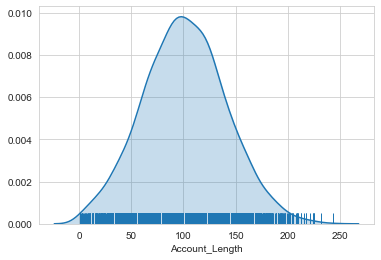

In [90]:
# visualize distribution of account length to get a sense of increment

sns.set_style('whitegrid')
sns.distplot(df['Account_Length'], hist=False,
            rug=True, kde_kws={'shade': True})

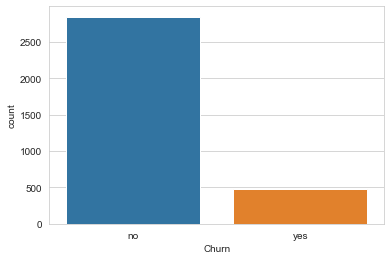

In [91]:
# frequency count of churners vs non-churners

sns.countplot(data=df, x='Churn')

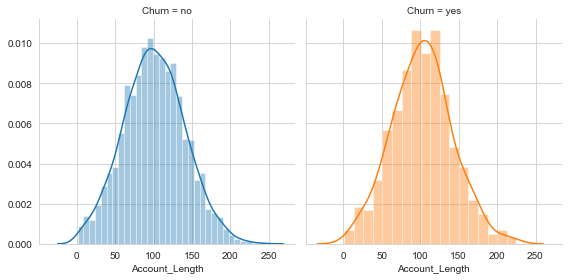

In [92]:
# distribution of account length for churners vs non-churners

ChurnGrid = sns.FacetGrid(df, col='Churn', hue="Churn", height=4)
ChurnGrid.map(sns.distplot, "Account_Length")

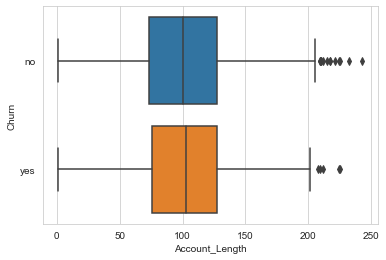

In [93]:
# Visualize relationship between account length and churn 

sns.boxplot(data=df, y='Churn', x='Account_Length')

In [94]:
# subset original data to calculate churn by state

churn_by_state = df[['State', 'Churn']]

In [95]:
# pivot on state and churn, get counts by churn

churn_by_state = churn_by_state.pivot_table(index='State', columns='Churn', aggfunc=len, margins=True)

In [96]:
# convert churn by state to dataframe
# rename columns
# drop row sum

churn_by_state_df = pd.DataFrame(churn_by_state.to_records())
churn_by_state_df = churn_by_state_df.rename(columns={'no': 'Retained', 'yes': 'Churned', 'All': 'Total_Customers'})
churn_by_state_df = churn_by_state_df.drop(51)
churn_by_state_df

,State,Retained,Churned,Total_Customers
0,AK,49,3,52
1,AL,72,8,80
2,AR,44,11,55
3,AZ,60,4,64
4,CA,25,9,34
5,CO,57,9,66
6,CT,62,12,74
7,DC,49,5,54
8,DE,52,9,61
9,FL,55,8,63


In [97]:
# check data types

churn_by_state_df.dtypes

State              object
Retained            int64
Churned             int64
Total_Customers     int64
dtype: object

In [98]:
# calculate rate by state

churn_by_state_df['Churn_Rate'] = (churn_by_state_df['Churned']/churn_by_state_df['Total_Customers'])*100

In [99]:
# sort by rate

churn_by_state_df.sort_values('Churn_Rate', ascending=False)

,State,Retained,Churned,Total_Customers,Churn_Rate
31,NJ,50,18,68,26.470588
4,CA,25,9,34,26.470588
43,TX,54,18,72,25.000000
20,MD,53,17,70,24.285714
40,SC,46,14,60,23.333333
22,MI,57,16,73,21.917808
25,MS,51,14,65,21.538462
33,NV,52,14,66,21.212121
47,WA,52,14,66,21.212121
21,ME,49,13,62,20.967742


In [100]:
# Calculate percentage of customers by state

churn_by_state_df['PCT_Customers_by_State'] = (churn_by_state_df.Total_Customers/churn_by_state_df.Total_Customers.sum())*100

In [101]:
churn_by_state_df = churn_by_state_df.sort_values(['Churn_Rate', 'PCT_Customers_by_State'], ascending=False)
churn_by_state_df

,State,Retained,Churned,Total_Customers,Churn_Rate,PCT_Customers_by_State
31,NJ,50,18,68,26.470588,2.040204
4,CA,25,9,34,26.470588,1.020102
43,TX,54,18,72,25.000000,2.160216
20,MD,53,17,70,24.285714,2.100210
40,SC,46,14,60,23.333333,1.800180
22,MI,57,16,73,21.917808,2.190219
25,MS,51,14,65,21.538462,1.950195
33,NV,52,14,66,21.212121,1.980198
47,WA,52,14,66,21.212121,1.980198
21,ME,49,13,62,20.967742,1.860186


In [102]:
# write in states to region dict

states = {
        'AK': 'Other',
        'AL': 'South',
        'AR': 'South',
        'AS': 'Other',
        'AZ': 'West',
        'CA': 'West',
        'CO': 'West',
        'CT': 'Northeast',
        'DC': 'Northeast',
        'DE': 'Northeast',
        'FL': 'South',
        'GA': 'South',
        'GU': 'Other',
        'HI': 'Other',
        'IA': 'Midwest',
        'ID': 'West',
        'IL': 'Midwest',
        'IN': 'Midwest',
        'KS': 'Midwest',
        'KY': 'South',
        'LA': 'South',
        'MA': 'Northeast',
        'MD': 'Northeast',
        'ME': 'Northeast',
        'MI': 'West',
        'MN': 'Midwest',
        'MO': 'Midwest',
        'MP': 'Other',
        'MS': 'South',
        'MT': 'West',
        'NA': 'Other',
        'NC': 'South',
        'ND': 'Midwest',
        'NE': 'West',
        'NH': 'Northeast',
        'NJ': 'Northeast',
        'NM': 'West',
        'NV': 'West',
        'NY': 'Northeast',
        'OH': 'Midwest',
        'OK': 'South',
        'OR': 'West',
        'PA': 'Northeast',
        'PR': 'Other',
        'RI': 'Northeast',
        'SC': 'South',
        'SD': 'Midwest',
        'TN': 'South',
        'TX': 'South',
        'UT': 'West',
        'VA': 'South',
        'VI': 'Other',
        'VT': 'Northeast',
        'WA': 'West',
        'WI': 'Midwest',
        'WV': 'South',
        'WY': 'West'
}

In [103]:
# convert region lookup to DF

regions = pd.DataFrame(states, index=[0])

In [104]:
# transpose DF

regions = regions.T

In [105]:
# reset index

regions = regions.reset_index()

In [106]:
# add prefix to convert column names to strings

regions = regions.add_prefix('X_')

In [107]:
# check column names

regions.columns

Index(['X_index', 'X_0'], dtype='object')

In [108]:
# rename columns

regions = regions.rename(columns={'X_index': 'State', 'X_0': 'US_Region'})

In [109]:
# check column names

regions

,State,US_Region
0,AK,Other
1,AL,South
2,AR,South
3,AS,Other
4,AZ,West
5,CA,West
6,CO,West
7,CT,Northeast
8,DC,Northeast
9,DE,Northeast


In [110]:
# merge region key with churn by state dataframe

churn_by_state_df2 = pd.merge(churn_by_state_df, regions, how='left', on='State')

In [111]:
churn_by_state_df2

,State,Retained,Churned,Total_Customers,Churn_Rate,PCT_Customers_by_State,US_Region
0,NJ,50,18,68,26.470588,2.040204,Northeast
1,CA,25,9,34,26.470588,1.020102,West
2,TX,54,18,72,25.000000,2.160216,South
3,MD,53,17,70,24.285714,2.100210,Northeast
4,SC,46,14,60,23.333333,1.800180,South
5,MI,57,16,73,21.917808,2.190219,West
6,MS,51,14,65,21.538462,1.950195,South
7,NV,52,14,66,21.212121,1.980198,West
8,WA,52,14,66,21.212121,1.980198,West
9,ME,49,13,62,20.967742,1.860186,Northeast


In [112]:
churn_by_state_df2.dtypes

State                      object
Retained                    int64
Churned                     int64
Total_Customers             int64
Churn_Rate                float64
PCT_Customers_by_State    float64
US_Region                  object
dtype: object

In [113]:
primary_markets = churn_by_state_df2[churn_by_state_df2['US_Region'] != 'Other']
primary_markets

,State,Retained,Churned,Total_Customers,Churn_Rate,PCT_Customers_by_State,US_Region
0,NJ,50,18,68,26.470588,2.040204,Northeast
1,CA,25,9,34,26.470588,1.020102,West
2,TX,54,18,72,25.000000,2.160216,South
3,MD,53,17,70,24.285714,2.100210,Northeast
4,SC,46,14,60,23.333333,1.800180,South
5,MI,57,16,73,21.917808,2.190219,West
6,MS,51,14,65,21.538462,1.950195,South
7,NV,52,14,66,21.212121,1.980198,West
8,WA,52,14,66,21.212121,1.980198,West
9,ME,49,13,62,20.967742,1.860186,Northeast


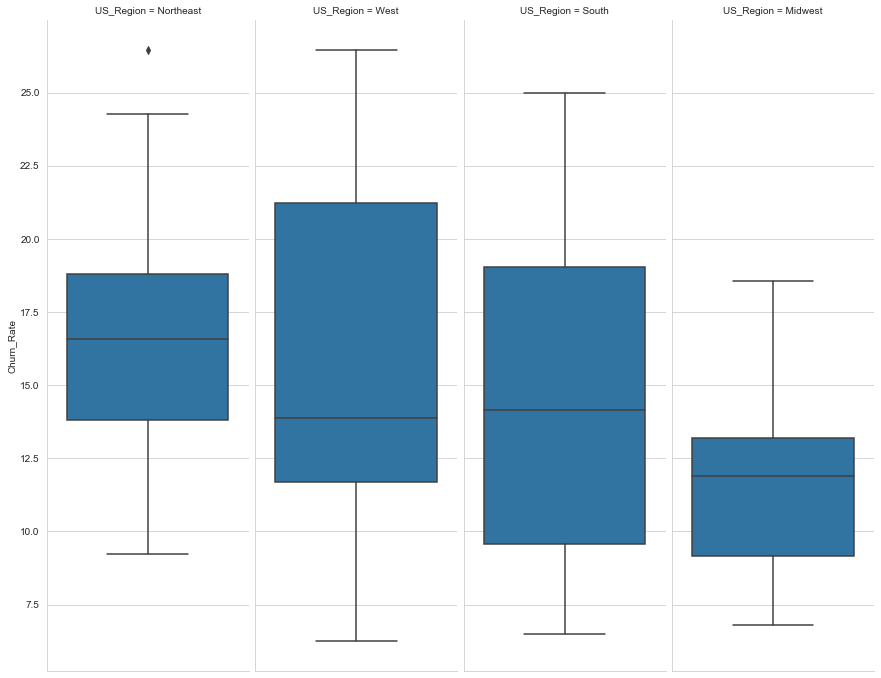

In [114]:
# visualize churn rates by region

g = sns.catplot(data=primary_markets, y='Churn_Rate', kind='box', col='US_Region')
g.fig.set_figwidth(12)
g.fig.set_figheight(10)

In [115]:
# Calculate percentage of churners by state

churn_by_state_df2['PCT_Churners_by_State'] = (churn_by_state_df2.Churned/churn_by_state_df2.Churned.sum())*100
churn_by_state_df2['Churn_Index'] = (churn_by_state_df2.Churned/churn_by_state_df2.Churned.mean())*100

In [116]:
churn_by_state_df2
sum(churn_by_state_df2['Total_Customers'])

3333

In [117]:
primary_markets2 = churn_by_state_df2[churn_by_state_df2['US_Region'] != 'Other']

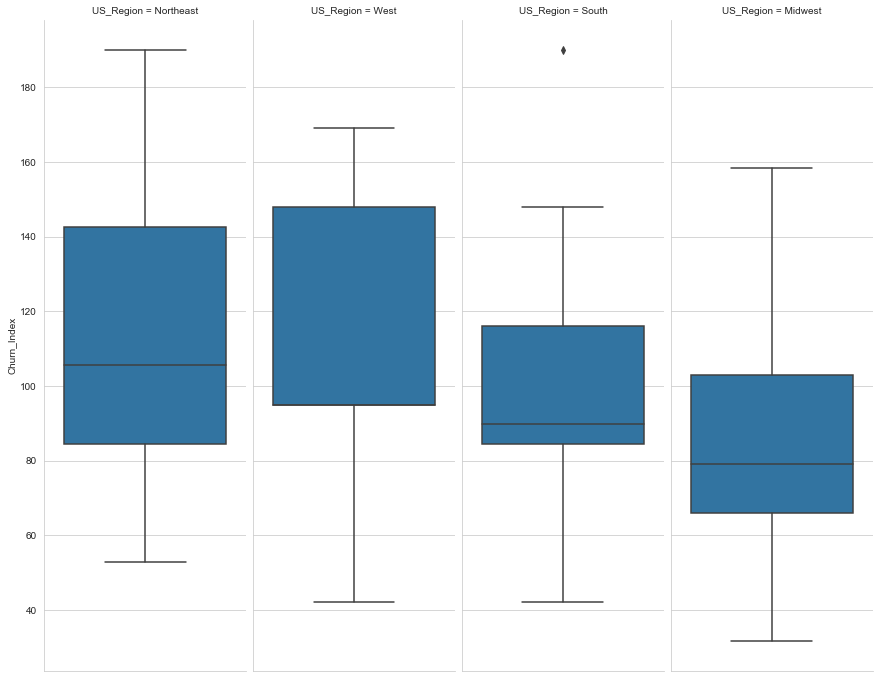

In [118]:
# visualize churn rates by region

g = sns.catplot(data=primary_markets2, y='Churn_Index', kind='box', col='US_Region')
g.fig.set_figwidth(12)
g.fig.set_figheight(10)

In [120]:
corr_by_state = df[['State', 'Churn']]
corr_by_state['Churn'] = corr_by_state['Churn'].replace({'no':0, 'yes':1})
corr_by_state = pd.get_dummies(corr_by_state)

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [121]:
corr_by_state.columns
csc = ['State_WY', 'State_AK', 'State_AL', 'State_AR', 'State_AZ', 'State_CA',
       'State_CO', 'State_CT', 'State_DC', 'State_DE', 'State_FL', 'State_GA',
       'State_HI', 'State_IA', 'State_ID', 'State_IL', 'State_IN', 'State_KS',
       'State_KY', 'State_LA', 'State_MA', 'State_MD', 'State_ME', 'State_MI',
       'State_MN', 'State_MO', 'State_MS', 'State_MT', 'State_NC', 'State_ND',
       'State_NE', 'State_NH', 'State_NJ', 'State_NM', 'State_NV', 'State_NY',
       'State_OH', 'State_OK', 'State_OR', 'State_PA', 'State_RI', 'State_SC',
       'State_SD', 'State_TN', 'State_TX', 'State_UT', 'State_VA', 'State_VT',
       'State_WA', 'State_WI', 'State_WV', 'Churn']
corr_by_state = corr_by_state[csc]
corr_by_state

,State_WY,State_AK,State_AL,State_AR,State_AZ,State_CA,State_CO,State_CT,State_DC,State_DE,State_FL,State_GA,State_HI,State_IA,State_ID,State_IL,State_IN,State_KS,State_KY,State_LA,State_MA,State_MD,State_ME,State_MI,State_MN,...,State_MT,State_NC,State_ND,State_NE,State_NH,State_NJ,State_NM,State_NV,State_NY,State_OH,State_OK,State_OR,State_PA,State_RI,State_SC,State_SD,State_TN,State_TX,State_UT,State_VA,State_VT,State_WA,State_WI,State_WV,Churn
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3329,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3330,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3331,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [122]:
state_corr = corr_by_state[corr_by_state.columns[1:]].corr()['Churn'][:-1]
state_corr = pd.DataFrame(state_corr).reset_index()
state_corr

,index,Churn
0,State_AK,-0.031194
1,State_AL,-0.020009
2,State_AR,0.020270
3,State_AZ,-0.032759
4,State_CA,0.034547
5,State_CO,-0.003453
6,State_CT,0.007383
7,State_DC,-0.019074
8,State_DE,0.001019
9,State_FL,-0.007070


In [123]:
state_corr = state_corr.rename(columns={'index':'Prefix'})

In [124]:
state_corr['State'] = [x.split('_')[1] for x in state_corr['Prefix']]

In [125]:
scc2 = [ 'State', 'Churn']
state_corr = state_corr[scc2]
state_corr

,State,Churn
0,AK,-0.031194
1,AL,-0.020009
2,AR,0.020270
3,AZ,-0.032759
4,CA,0.034547
5,CO,-0.003453
6,CT,0.007383
7,DC,-0.019074
8,DE,0.001019
9,FL,-0.007070


In [126]:
state_corr = pd.merge(state_corr, regions, how='left', on='State')


In [127]:
state_corr

,State,Churn,US_Region
0,AK,-0.031194,Other
1,AL,-0.020009,South
2,AR,0.020270,South
3,AZ,-0.032759,West
4,CA,0.034547,West
5,CO,-0.003453,West
6,CT,0.007383,Northeast
7,DC,-0.019074,Northeast
8,DE,0.001019,Northeast
9,FL,-0.007070,South


In [129]:
corr_by_region = df[['State', 'Churn']]
corr_by_region['Churn'] = corr_by_region['Churn'].replace({'no':0, 'yes':1})

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [130]:
corr_by_region

,State,Churn
0,KS,0
1,OH,0
2,NJ,0
3,OH,0
4,OK,0
...,...,...
3328,AZ,0
3329,WV,0
3330,RI,0
3331,CT,0


In [131]:
corr_by_region = pd.merge(corr_by_region, regions, how='left', on='State')

In [132]:
corr_by_region

,State,Churn,US_Region
0,KS,0,Midwest
1,OH,0,Midwest
2,NJ,0,Northeast
3,OH,0,Midwest
4,OK,0,South
...,...,...,...
3328,AZ,0,West
3329,WV,0,South
3330,RI,0,Northeast
3331,CT,0,Northeast


In [133]:
corr_by_region_cols = ['US_Region', 'Churn']
corr_by_region = corr_by_region[corr_by_region_cols]
corr_by_region

,US_Region,Churn
0,Midwest,0
1,Midwest,0
2,Northeast,0
3,Midwest,0
4,South,0
...,...,...
3328,West,0
3329,South,0
3330,Northeast,0
3331,Northeast,0


In [134]:
corr_by_region = pd.get_dummies(corr_by_region)
corr_by_region.columns

Index(['Churn', 'US_Region_Midwest', 'US_Region_Northeast', 'US_Region_Other',
       'US_Region_South', 'US_Region_West'],
      dtype='object')

In [135]:
corr_by_region_cols = ['US_Region_Midwest', 'US_Region_Northeast', 'US_Region_Other',
       'US_Region_South', 'US_Region_West', 'Churn']
corr_by_region = corr_by_region[corr_by_region_cols]
corr_by_region

,US_Region_Midwest,US_Region_Northeast,US_Region_Other,US_Region_South,US_Region_West,Churn
0,1,0,0,0,0,0
1,1,0,0,0,0,0
2,0,1,0,0,0,0
3,1,0,0,0,0,0
4,0,0,0,1,0,0
...,...,...,...,...,...,...
3328,0,0,0,0,1,0
3329,0,0,0,1,0,0
3330,0,1,0,0,0,0
3331,0,1,0,0,0,0


In [136]:
region_corr = corr_by_region[corr_by_region.columns[1:]].corr()['Churn'][:-1]
region_corr = pd.DataFrame(region_corr).reset_index()
region_corr

,index,Churn
0,US_Region_Northeast,0.037403
1,US_Region_Other,-0.044970
2,US_Region_South,-0.001716
3,US_Region_West,0.010467


In [137]:
region_corr = region_corr.rename(columns={'index':'Prefix'})

In [138]:
region_corr['US_Region'] = [x.split('_')[2] for x in region_corr['Prefix']]

In [139]:
region_corr_cols = ['US_Region', 'Churn']
region_corr = region_corr[region_corr_cols]

In [140]:
region_corr = pd.merge(regions, region_corr, how='left', on='US_Region')
region_corr

,State,US_Region,Churn
0,AK,Other,-0.044970
1,AL,South,-0.001716
2,AR,South,-0.001716
3,AS,Other,-0.044970
4,AZ,West,0.010467
5,CA,West,0.010467
6,CO,West,0.010467
7,CT,Northeast,0.037403
8,DC,Northeast,0.037403
9,DE,Northeast,0.037403


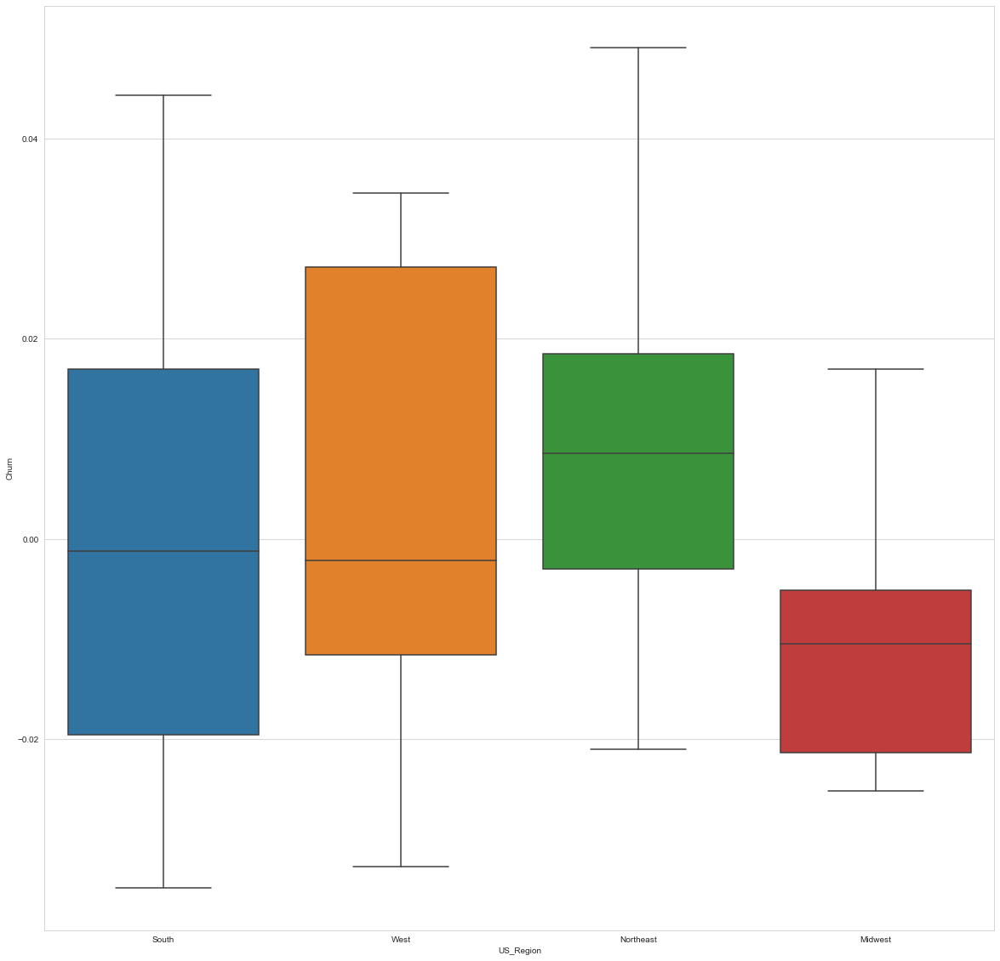

In [141]:
sns.set_style('whitegrid')
plt.subplots(figsize=(20, 20))
sns.boxplot(data=state_corr.query('US_Region != "Other"'), x='US_Region', y='Churn')

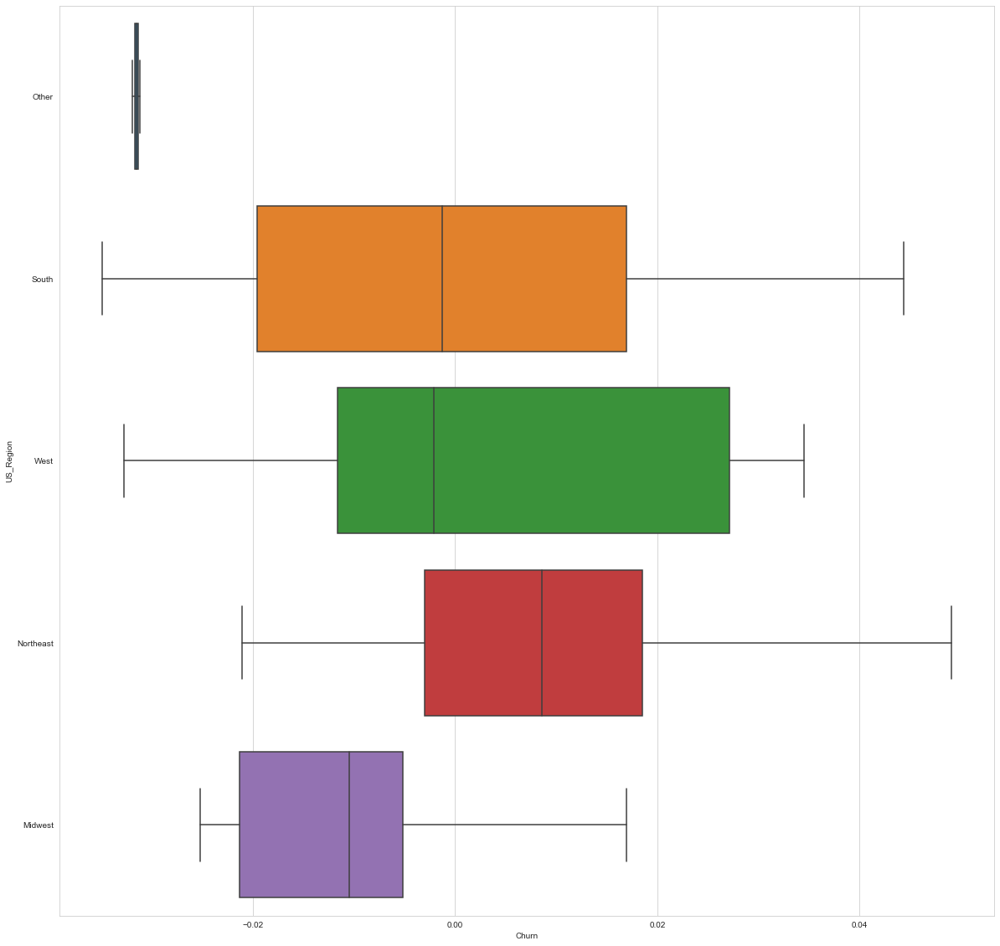

In [142]:
sns.set_style('whitegrid')
plt.subplots(figsize=(20, 20))
sns.boxplot(data=state_corr, y='US_Region', x='Churn')

In [143]:
import plotly.graph_objects as go

df = region_corr
fig = go.Figure(data=go.Choropleth(
    locations=df['State'], # Spatial coordinates
    z = df['Churn'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Purples',
    colorbar_title = "Corr Coef",
))

fig.update_layout(
    title_text = 'Churn Corr by Region',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [144]:
import plotly.graph_objects as go

df = state_corr
fig = go.Figure(data=go.Choropleth(
    locations=df['State'], # Spatial coordinates
    z = df['Churn'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Purples',
    colorbar_title = "Corr Coef",
))

fig.update_layout(
    title_text = 'Churn Corr by State',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [145]:
import plotly.graph_objects as go

df = churn_by_state_df2
fig = go.Figure(data=go.Choropleth(
    locations=df['State'], # Spatial coordinates
    z = df['Churn_Rate'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "Churn Rate",
))

fig.update_layout(
    title_text = 'Churn Rate By State',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [146]:
import plotly.graph_objects as go

df = churn_by_state_df2
fig = go.Figure(data=go.Choropleth(
    locations=df['State'], # Spatial coordinates
    z = df['PCT_Customers_by_State'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Blues',
    colorbar_title = "Percentage of Customers",
))

fig.update_layout(
    title_text = 'Percentage of Customers by State',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

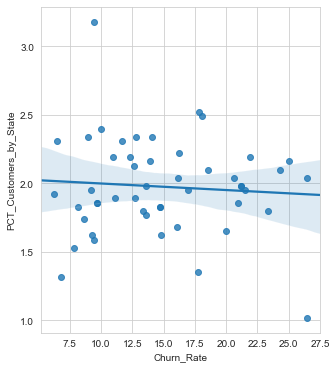

In [147]:
f, ax = plt.subplots(figsize=(5, 6))
sns.regplot(x="Churn_Rate", y="PCT_Customers_by_State", data=primary_markets, ax=ax)
            

# ax.set_yscale('log')
# ax.set_xscale('log')

In [148]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51 entries, 0 to 50
Data columns (total 9 columns):
State                     51 non-null object
Retained                  51 non-null int64
Churned                   51 non-null int64
Total_Customers           51 non-null int64
Churn_Rate                51 non-null float64
PCT_Customers_by_State    51 non-null float64
US_Region                 51 non-null object
PCT_Churners_by_State     51 non-null float64
Churn_Index               51 non-null float64
dtypes: float64(4), int64(3), object(2)
memory usage: 4.0+ KB


In [149]:
483/3300

0.14636363636363636

In [150]:
churn_data = pd.read_csv('https://assets.datacamp.com/production/repositories/1764/datasets/79c5446a4a753e728e32b4a67138344847b8f131/Churn.csv')

In [151]:
churn_data.head()

,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,State,Area_Code,Phone
0,128,25,265.1,197.4,244.7,10.0,1,no,no,yes,110,45.07,99,16.78,91,11.01,3,2.70,KS,415,382-4657
1,107,26,161.6,195.5,254.4,13.7,1,no,no,yes,123,27.47,103,16.62,103,11.45,3,3.70,OH,415,371-7191
2,137,0,243.4,121.2,162.6,12.2,0,no,no,no,114,41.38,110,10.30,104,7.32,5,3.29,NJ,415,358-1921
3,84,0,299.4,61.9,196.9,6.6,2,no,yes,no,71,50.90,88,5.26,89,8.86,7,1.78,OH,408,375-9999
4,75,0,166.7,148.3,186.9,10.1,3,no,yes,no,113,28.34,122,12.61,121,8.41,3,2.73,OK,415,330-6626


In [152]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
Account_Length    3333 non-null int64
Vmail_Message     3333 non-null int64
Day_Mins          3333 non-null float64
Eve_Mins          3333 non-null float64
Night_Mins        3333 non-null float64
Intl_Mins         3333 non-null float64
CustServ_Calls    3333 non-null int64
Churn             3333 non-null object
Intl_Plan         3333 non-null object
Vmail_Plan        3333 non-null object
Day_Calls         3333 non-null int64
Day_Charge        3333 non-null float64
Eve_Calls         3333 non-null int64
Eve_Charge        3333 non-null float64
Night_Calls       3333 non-null int64
Night_Charge      3333 non-null float64
Intl_Calls        3333 non-null int64
Intl_Charge       3333 non-null float64
State             3333 non-null object
Area_Code         3333 non-null int64
Phone             3333 non-null object
dtypes: float64(8), int64(8), object(5)
memory usage: 546.9+ KB


In [153]:
cols = churn_data.columns

for i in enumerate(cols):
    print(i)

(0, 'Account_Length')
(1, 'Vmail_Message')
(2, 'Day_Mins')
(3, 'Eve_Mins')
(4, 'Night_Mins')
(5, 'Intl_Mins')
(6, 'CustServ_Calls')
(7, 'Churn')
(8, 'Intl_Plan')
(9, 'Vmail_Plan')
(10, 'Day_Calls')
(11, 'Day_Charge')
(12, 'Eve_Calls')
(13, 'Eve_Charge')
(14, 'Night_Calls')
(15, 'Night_Charge')
(16, 'Intl_Calls')
(17, 'Intl_Charge')
(18, 'State')
(19, 'Area_Code')
(20, 'Phone')


In [154]:
churn_data['Total_Mins'] = churn_data.iloc[:, 2:6].sum(axis=1)
churn_data

,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,State,Area_Code,Phone,Total_Mins
0,128,25,265.1,197.4,244.7,10.0,1,no,no,yes,110,45.07,99,16.78,91,11.01,3,2.70,KS,415,382-4657,717.2
1,107,26,161.6,195.5,254.4,13.7,1,no,no,yes,123,27.47,103,16.62,103,11.45,3,3.70,OH,415,371-7191,625.2
2,137,0,243.4,121.2,162.6,12.2,0,no,no,no,114,41.38,110,10.30,104,7.32,5,3.29,NJ,415,358-1921,539.4
3,84,0,299.4,61.9,196.9,6.6,2,no,yes,no,71,50.90,88,5.26,89,8.86,7,1.78,OH,408,375-9999,564.8
4,75,0,166.7,148.3,186.9,10.1,3,no,yes,no,113,28.34,122,12.61,121,8.41,3,2.73,OK,415,330-6626,512.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,36,156.2,215.5,279.1,9.9,2,no,no,yes,77,26.55,126,18.32,83,12.56,6,2.67,AZ,415,414-4276,660.7
3329,68,0,231.1,153.4,191.3,9.6,3,no,no,no,57,39.29,55,13.04,123,8.61,4,2.59,WV,415,370-3271,585.4
3330,28,0,180.8,288.8,191.9,14.1,2,no,no,no,109,30.74,58,24.55,91,8.64,6,3.81,RI,510,328-8230,675.6
3331,184,0,213.8,159.6,139.2,5.0,2,no,yes,no,105,36.35,84,13.57,137,6.26,10,1.35,CT,510,364-6381,517.6


In [155]:
cols = ['Phone',
 'Area_Code',
 'State',
 'Churn',
 'Intl_Plan',
 'Vmail_Plan',
 'CustServ_Calls',
 'Vmail_Message',
 'Account_Length',
 'Day_Mins',
 'Eve_Mins',
 'Night_Mins',
 'Intl_Mins',
 'Total_Mins',
 'Day_Calls',
 'Eve_Calls',
 'Night_Calls',
 'Intl_Calls',
 'Day_Charge',
 'Eve_Charge',
 'Night_Charge',
 'Intl_Charge']

In [156]:
churn_data = churn_data[cols]

In [157]:
churn_data

,Phone,Area_Code,State,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge
0,382-4657,415,KS,no,no,yes,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70
1,371-7191,415,OH,no,no,yes,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70
2,358-1921,415,NJ,no,no,no,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29
3,375-9999,408,OH,no,yes,no,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78
4,330-6626,415,OK,no,yes,no,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,414-4276,415,AZ,no,no,yes,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67
3329,370-3271,415,WV,no,no,no,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59
3330,328-8230,510,RI,no,no,no,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81
3331,364-6381,510,CT,no,yes,no,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35


In [158]:
for i in enumerate(cols):
    print(i)

(0, 'Phone')
(1, 'Area_Code')
(2, 'State')
(3, 'Churn')
(4, 'Intl_Plan')
(5, 'Vmail_Plan')
(6, 'CustServ_Calls')
(7, 'Vmail_Message')
(8, 'Account_Length')
(9, 'Day_Mins')
(10, 'Eve_Mins')
(11, 'Night_Mins')
(12, 'Intl_Mins')
(13, 'Total_Mins')
(14, 'Day_Calls')
(15, 'Eve_Calls')
(16, 'Night_Calls')
(17, 'Intl_Calls')
(18, 'Day_Charge')
(19, 'Eve_Charge')
(20, 'Night_Charge')
(21, 'Intl_Charge')


In [159]:
churn_data['Total_Calls'] = churn_data.iloc[:, 14:18].sum(axis=1)
churn_data['Total_Charge'] = churn_data.iloc[:, 18:22].sum(axis=1)
churn_data

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Phone,Area_Code,State,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge
0,382-4657,415,KS,no,no,yes,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56
1,371-7191,415,OH,no,no,yes,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24
2,358-1921,415,NJ,no,no,no,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29
3,375-9999,408,OH,no,yes,no,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80
4,330-6626,415,OK,no,yes,no,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,414-4276,415,AZ,no,no,yes,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10
3329,370-3271,415,WV,no,no,no,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53
3330,328-8230,510,RI,no,no,no,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74
3331,364-6381,510,CT,no,yes,no,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53


In [160]:
churn_data['Cost_Per_Day_Minute'] = churn_data['Day_Charge']/churn_data['Day_Mins']
churn_data['Cost_Per_Eve_Minute'] = churn_data['Eve_Charge']/churn_data['Eve_Mins']
churn_data['Cost_Per_Night_Minute'] = churn_data['Night_Charge']/churn_data['Night_Mins']
churn_data['Cost_Per_Intl_Minute'] = churn_data['Intl_Charge']/churn_data['Intl_Mins']
churn_data['Avg_Daily_Charge'] = churn_data['Total_Charge']/churn_data['Account_Length']

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

In [161]:
churn_data

,Phone,Area_Code,State,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge
0,382-4657,415,KS,no,no,yes,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.170011,0.085005,0.044994,0.270000,0.590313
1,371-7191,415,OH,no,no,yes,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.169988,0.085013,0.045008,0.270073,0.553645
2,358-1921,415,NJ,no,no,no,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.170008,0.084983,0.045018,0.269672,0.454672
3,375-9999,408,OH,no,yes,no,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.170007,0.084976,0.044997,0.269697,0.795238
4,330-6626,415,OK,no,yes,no,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.170006,0.085030,0.044997,0.270297,0.694533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,414-4276,415,AZ,no,no,yes,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.169974,0.085012,0.045002,0.269697,0.313021
3329,370-3271,415,WV,no,no,no,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.170013,0.085007,0.045008,0.269792,0.934265
3330,328-8230,510,RI,no,no,no,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,0.170022,0.085007,0.045023,0.270213,2.419286
3331,364-6381,510,CT,no,yes,no,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.170019,0.085025,0.044971,0.270000,0.312663


In [162]:
churn_data['Avg_Cost_Per_Minute'] = churn_data['Total_Charge']/churn_data['Total_Mins']
churn_data['Avg_Minutes_Per_Call'] = churn_data['Total_Mins']/churn_data['Total_Calls']
churn_data['Avg_Cost_Per_Call'] = churn_data['Avg_Minutes_Per_Call']*churn_data['Avg_Cost_Per_Minute']

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

In [163]:
churn_data['Day_Mins_to_Total'] = (churn_data['Day_Mins']/churn_data['Total_Mins'])*100
churn_data['Eve_Mins_to_Total'] = churn_data['Eve_Mins']/churn_data['Total_Mins']*100
churn_data['Night_Mins_to_Total'] = churn_data['Night_Mins']/churn_data['Total_Mins']*100
churn_data['Intl_Mins_to_Total'] = churn_data['Intl_Mins']/churn_data['Total_Mins']*100

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

In [164]:
churn_data['Day_Charge_to_Total'] = (churn_data['Day_Charge']/churn_data['Total_Charge'])*100
churn_data['Eve_Charge_to_Total'] = churn_data['Eve_Charge']/churn_data['Total_Charge']*100
churn_data['Night_Charge_to_Total'] = churn_data['Night_Charge']/churn_data['Total_Charge']*100
churn_data['Intl_Charge_to_Total'] = churn_data['Intl_Charge']/churn_data['Total_Charge']*100

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

In [165]:
for i in enumerate(churn_data.columns):
    print(i)

(0, 'Phone')
(1, 'Area_Code')
(2, 'State')
(3, 'Churn')
(4, 'Intl_Plan')
(5, 'Vmail_Plan')
(6, 'CustServ_Calls')
(7, 'Vmail_Message')
(8, 'Account_Length')
(9, 'Day_Mins')
(10, 'Eve_Mins')
(11, 'Night_Mins')
(12, 'Intl_Mins')
(13, 'Total_Mins')
(14, 'Day_Calls')
(15, 'Eve_Calls')
(16, 'Night_Calls')
(17, 'Intl_Calls')
(18, 'Day_Charge')
(19, 'Eve_Charge')
(20, 'Night_Charge')
(21, 'Intl_Charge')
(22, 'Total_Calls')
(23, 'Total_Charge')
(24, 'Cost_Per_Day_Minute')
(25, 'Cost_Per_Eve_Minute')
(26, 'Cost_Per_Night_Minute')
(27, 'Cost_Per_Intl_Minute')
(28, 'Avg_Daily_Charge')
(29, 'Avg_Cost_Per_Minute')
(30, 'Avg_Minutes_Per_Call')
(31, 'Avg_Cost_Per_Call')
(32, 'Day_Mins_to_Total')
(33, 'Eve_Mins_to_Total')
(34, 'Night_Mins_to_Total')
(35, 'Intl_Mins_to_Total')
(36, 'Day_Charge_to_Total')
(37, 'Eve_Charge_to_Total')
(38, 'Night_Charge_to_Total')
(39, 'Intl_Charge_to_Total')


In [166]:
cols2 = churn_data.columns

In [167]:
cols2.tolist()

['Phone',
 'Area_Code',
 'State',
 'Churn',
 'Intl_Plan',
 'Vmail_Plan',
 'CustServ_Calls',
 'Vmail_Message',
 'Account_Length',
 'Day_Mins',
 'Eve_Mins',
 'Night_Mins',
 'Intl_Mins',
 'Total_Mins',
 'Day_Calls',
 'Eve_Calls',
 'Night_Calls',
 'Intl_Calls',
 'Day_Charge',
 'Eve_Charge',
 'Night_Charge',
 'Intl_Charge',
 'Total_Calls',
 'Total_Charge',
 'Cost_Per_Day_Minute',
 'Cost_Per_Eve_Minute',
 'Cost_Per_Night_Minute',
 'Cost_Per_Intl_Minute',
 'Avg_Daily_Charge',
 'Avg_Cost_Per_Minute',
 'Avg_Minutes_Per_Call',
 'Avg_Cost_Per_Call',
 'Day_Mins_to_Total',
 'Eve_Mins_to_Total',
 'Night_Mins_to_Total',
 'Intl_Mins_to_Total',
 'Day_Charge_to_Total',
 'Eve_Charge_to_Total',
 'Night_Charge_to_Total',
 'Intl_Charge_to_Total']

In [168]:
# cols2 = ['Phone',
#  'Area_Code',
#  'State',
#  'Churn',
#  'Intl_Plan',
#  'Vmail_Plan',
#  'CustServ_Calls',
#  'Vmail_Message',
#  'Account_Length',
#  'Day_Mins',
#  'Eve_Mins',
#  'Night_Mins',
#  'Intl_Mins',
#  'Day_Calls',
#  'Eve_Calls',
#  'Night_Calls',
#  'Intl_Calls',
#  'Day_Charge',
#  'Eve_Charge',
#  'Night_Charge',
#  'Intl_Charge',
#  'Total_Mins',
#  'Total_Calls',
#  'Total_Charge']

# churn_data = churn_data[cols2]

In [169]:
churn_data

,Phone,Area_Code,State,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total
0,382-4657,415,KS,no,no,yes,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.170011,0.085005,0.044994,0.270000,0.590313,0.105354,2.366997,0.249373,36.963190,27.523703,34.118795,1.394311,59.647962,22.207517,14.571202,3.573319
1,371-7191,415,OH,no,no,yes,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.169988,0.085013,0.045008,0.270073,0.553645,0.094754,1.883133,0.178434,25.847729,31.269994,40.690979,2.191299,46.370695,28.055368,19.328157,6.245780
2,358-1921,415,NJ,no,no,no,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.170008,0.084983,0.045018,0.269672,0.454672,0.115480,1.619820,0.187057,45.124212,22.469410,30.144605,2.261772,66.431209,16.535559,11.751485,5.281747
3,375-9999,408,OH,no,yes,no,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.170007,0.084976,0.044997,0.269697,0.795238,0.118272,2.214902,0.261961,53.009915,10.959632,34.861898,1.168555,76.197605,7.874251,13.263473,2.664671
4,330-6626,415,OK,no,yes,no,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.170006,0.085030,0.044997,0.270297,0.694533,0.101738,1.426184,0.145097,32.558594,28.964844,36.503906,1.972656,54.405836,24.208101,16.145133,5.240929
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,414-4276,415,AZ,no,no,yes,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.169974,0.085012,0.045002,0.269697,0.313021,0.090964,2.262671,0.205822,23.641592,32.616921,42.243076,1.498411,44.176373,30.482529,20.898502,4.442596
3329,370-3271,415,WV,no,no,no,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.170013,0.085007,0.045008,0.269792,0.934265,0.108524,2.449372,0.265816,39.477280,26.204305,32.678510,1.639904,61.844798,20.525736,13.552652,4.076814
3330,328-8230,510,RI,no,no,no,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,0.170022,0.085007,0.045023,0.270213,2.419286,0.100266,2.559091,0.256591,26.761397,42.747188,28.404381,2.087034,45.379392,36.241512,12.754650,5.624446
3331,364-6381,510,CT,no,yes,no,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.170019,0.085025,0.044971,0.270000,0.312663,0.111148,1.540476,0.171220,41.306028,30.834621,26.893354,0.965997,63.184426,23.587693,10.881279,2.346602


In [170]:
churn_data['Total_Charge_Over_70'] = ['yes' if x >= 70 else 'no' for x in churn_data['Total_Charge']]

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [171]:
# create customer care buckets based on call center data

def cs_bucket(row):
    if row['CustServ_Calls'] == 0:
        return 'none'
    elif row['CustServ_Calls'] == 1:
        return 'low'
    elif row['CustServ_Calls'] == 2:
        return 'high'
    else:
        return 'critical'

churn_data2 = churn_data.assign(Care_Status=churn_data.apply(cs_bucket, axis=1))

In [172]:
churn_data2

,Phone,Area_Code,State,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70,Care_Status
0,382-4657,415,KS,no,no,yes,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.170011,0.085005,0.044994,0.270000,0.590313,0.105354,2.366997,0.249373,36.963190,27.523703,34.118795,1.394311,59.647962,22.207517,14.571202,3.573319,yes,low
1,371-7191,415,OH,no,no,yes,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.169988,0.085013,0.045008,0.270073,0.553645,0.094754,1.883133,0.178434,25.847729,31.269994,40.690979,2.191299,46.370695,28.055368,19.328157,6.245780,no,low
2,358-1921,415,NJ,no,no,no,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.170008,0.084983,0.045018,0.269672,0.454672,0.115480,1.619820,0.187057,45.124212,22.469410,30.144605,2.261772,66.431209,16.535559,11.751485,5.281747,no,none
3,375-9999,408,OH,no,yes,no,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.170007,0.084976,0.044997,0.269697,0.795238,0.118272,2.214902,0.261961,53.009915,10.959632,34.861898,1.168555,76.197605,7.874251,13.263473,2.664671,no,high
4,330-6626,415,OK,no,yes,no,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.170006,0.085030,0.044997,0.270297,0.694533,0.101738,1.426184,0.145097,32.558594,28.964844,36.503906,1.972656,54.405836,24.208101,16.145133,5.240929,no,critical
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,414-4276,415,AZ,no,no,yes,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.169974,0.085012,0.045002,0.269697,0.313021,0.090964,2.262671,0.205822,23.641592,32.616921,42.243076,1.498411,44.176373,30.482529,20.898502,4.442596,no,high
3329,370-3271,415,WV,no,no,no,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.170013,0.085007,0.045008,0.269792,0.934265,0.108524,2.449372,0.265816,39.477280,26.204305,32.678510,1.639904,61.844798,20.525736,13.552652,4.076814,no,critical
3330,328-8230,510,RI,no,no,no,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,0.170022,0.085007,0.045023,0.270213,2.419286,0.100266,2.559091,0.256591,26.761397,42.747188,28.404381,2.087034,45.379392,36.241512,12.754650,5.624446,no,high
3331,364-6381,510,CT,no,yes,no,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.170019,0.085025,0.044971,0.270000,0.312663,0.111148,1.540476,0.171220,41.306028,30.834621,26.893354,0.965997,63.184426,23.587693,10.881279,2.346602,no,high


In [173]:
cols3 = churn_data.columns
cols3

Index(['Phone', 'Area_Code', 'State', 'Churn', 'Intl_Plan', 'Vmail_Plan',
       'CustServ_Calls', 'Vmail_Message', 'Account_Length', 'Day_Mins',
       'Eve_Mins', 'Night_Mins', 'Intl_Mins', 'Total_Mins', 'Day_Calls',
       'Eve_Calls', 'Night_Calls', 'Intl_Calls', 'Day_Charge', 'Eve_Charge',
       'Night_Charge', 'Intl_Charge', 'Total_Calls', 'Total_Charge',
       'Cost_Per_Day_Minute', 'Cost_Per_Eve_Minute', 'Cost_Per_Night_Minute',
       'Cost_Per_Intl_Minute', 'Avg_Daily_Charge', 'Avg_Cost_Per_Minute',
       'Avg_Minutes_Per_Call', 'Avg_Cost_Per_Call', 'Day_Mins_to_Total',
       'Eve_Mins_to_Total', 'Night_Mins_to_Total', 'Intl_Mins_to_Total',
       'Day_Charge_to_Total', 'Eve_Charge_to_Total', 'Night_Charge_to_Total',
       'Intl_Charge_to_Total', 'Total_Charge_Over_70'],
      dtype='object')

In [174]:
bp_cols = ['Churn',
       'CustServ_Calls', 'Vmail_Message', 'Account_Length', 'Day_Mins',
       'Eve_Mins', 'Night_Mins', 'Intl_Mins', 'Day_Calls', 'Eve_Calls',
       'Night_Calls', 'Intl_Calls', 'Day_Charge', 'Eve_Charge', 'Night_Charge',
       'Intl_Charge', 'Total_Mins', 'Total_Calls', 'Total_Charge',
       'Avg_Cost_Per_Minute', 'Avg_Minutes_Per_Call', 'Avg_Cost_Per_Call',
       'Day_Mins_to_Total', 'Eve_Mins_to_Total', 'Night_Mins_to_Total',
       'Intl_Mins_to_Total', 'Day_Charge_to_Total', 'Eve_Charge_to_Total',
       'Night_Charge_to_Total', 'Intl_Charge_to_Total']

In [175]:
quant = churn_data[bp_cols]
quant

,Churn,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Mins,Total_Calls,Total_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total
0,no,1,25,128,265.1,197.4,244.7,10.0,110,99,91,3,45.07,16.78,11.01,2.70,717.2,303,75.56,0.105354,2.366997,0.249373,36.963190,27.523703,34.118795,1.394311,59.647962,22.207517,14.571202,3.573319
1,no,1,26,107,161.6,195.5,254.4,13.7,123,103,103,3,27.47,16.62,11.45,3.70,625.2,332,59.24,0.094754,1.883133,0.178434,25.847729,31.269994,40.690979,2.191299,46.370695,28.055368,19.328157,6.245780
2,no,0,0,137,243.4,121.2,162.6,12.2,114,110,104,5,41.38,10.30,7.32,3.29,539.4,333,62.29,0.115480,1.619820,0.187057,45.124212,22.469410,30.144605,2.261772,66.431209,16.535559,11.751485,5.281747
3,no,2,0,84,299.4,61.9,196.9,6.6,71,88,89,7,50.90,5.26,8.86,1.78,564.8,255,66.80,0.118272,2.214902,0.261961,53.009915,10.959632,34.861898,1.168555,76.197605,7.874251,13.263473,2.664671
4,no,3,0,75,166.7,148.3,186.9,10.1,113,122,121,3,28.34,12.61,8.41,2.73,512.0,359,52.09,0.101738,1.426184,0.145097,32.558594,28.964844,36.503906,1.972656,54.405836,24.208101,16.145133,5.240929
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,no,2,36,192,156.2,215.5,279.1,9.9,77,126,83,6,26.55,18.32,12.56,2.67,660.7,292,60.10,0.090964,2.262671,0.205822,23.641592,32.616921,42.243076,1.498411,44.176373,30.482529,20.898502,4.442596
3329,no,3,0,68,231.1,153.4,191.3,9.6,57,55,123,4,39.29,13.04,8.61,2.59,585.4,239,63.53,0.108524,2.449372,0.265816,39.477280,26.204305,32.678510,1.639904,61.844798,20.525736,13.552652,4.076814
3330,no,2,0,28,180.8,288.8,191.9,14.1,109,58,91,6,30.74,24.55,8.64,3.81,675.6,264,67.74,0.100266,2.559091,0.256591,26.761397,42.747188,28.404381,2.087034,45.379392,36.241512,12.754650,5.624446
3331,no,2,0,184,213.8,159.6,139.2,5.0,105,84,137,10,36.35,13.57,6.26,1.35,517.6,336,57.53,0.111148,1.540476,0.171220,41.306028,30.834621,26.893354,0.965997,63.184426,23.587693,10.881279,2.346602


In [176]:
quant.describe()

,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Mins,Total_Calls,Total_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,1.562856,8.099010,101.064806,179.775098,200.980348,200.872037,10.237294,100.435644,100.114311,100.107711,4.479448,30.562307,17.083540,9.039325,2.764581,591.864776,305.137114,59.449754,0.100354,1.964884,0.197334,30.208202,34.010976,34.008750,1.772072,50.477494,29.148336,15.575134,4.799036
std,1.315491,13.688365,39.822106,54.467389,50.713844,50.573847,2.791840,20.069084,19.922625,19.568609,2.461214,9.259435,4.310668,2.275873,0.753773,89.954251,34.448164,10.502261,0.008440,0.376958,0.041760,7.696959,7.402189,7.388904,0.566639,9.462073,7.419837,4.489671,1.600443
min,0.000000,0.000000,1.000000,0.000000,0.000000,23.200000,0.000000,0.000000,0.000000,33.000000,0.000000,0.000000,0.000000,1.040000,0.000000,284.300000,191.000000,22.930000,0.066950,0.798596,0.068973,0.000000,0.000000,6.417704,0.000000,0.000000,0.000000,2.302413,0.000000
25%,1.000000,0.000000,74.000000,143.700000,166.600000,167.000000,8.500000,87.000000,87.000000,87.000000,3.000000,24.430000,14.160000,7.520000,2.300000,531.500000,282.000000,52.380000,0.094893,1.705187,0.168741,25.259369,29.194139,29.116860,1.402255,45.034911,24.137451,12.517123,3.740598
50%,1.000000,0.000000,101.000000,179.400000,201.400000,201.200000,10.300000,101.000000,100.000000,100.000000,4.000000,30.500000,17.120000,9.050000,2.780000,593.600000,305.000000,59.470000,0.100385,1.939936,0.194419,30.327717,33.904376,33.962912,1.744287,51.250440,28.645509,15.238095,4.668857
75%,2.000000,20.000000,127.000000,216.400000,235.300000,235.300000,12.100000,114.000000,114.000000,113.000000,6.000000,36.790000,20.000000,10.590000,3.270000,652.400000,328.000000,66.480000,0.106056,2.195963,0.223420,35.368878,38.739626,38.964293,2.111614,57.147370,33.600188,18.244437,5.745155
max,9.000000,51.000000,243.000000,350.800000,363.700000,395.000000,20.000000,165.000000,170.000000,175.000000,20.000000,59.640000,30.910000,17.770000,5.400000,885.000000,416.000000,96.150000,0.129791,3.612245,0.409718,56.912065,64.778620,66.038501,4.246170,76.243568,64.833532,44.400726,14.064516


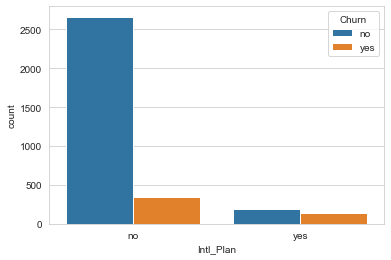

In [177]:
sns.countplot(data=churn_data, x='Intl_Plan', hue='Churn')
plt.show()

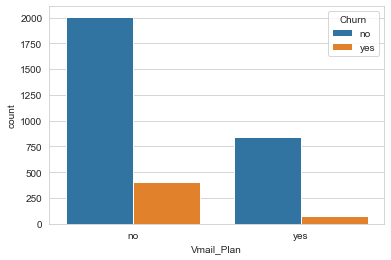

In [178]:
sns.countplot(data=churn_data, x='Vmail_Plan', hue='Churn', order=['no', 'yes'])
plt.show()

In [179]:
!pip install dexplot

In [180]:
import dexplot as dxp

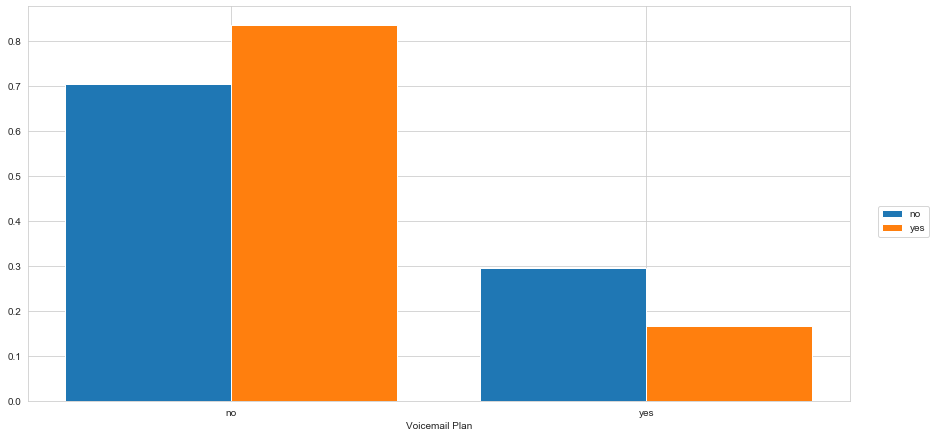

In [181]:
g = dxp.aggplot(data=churn_data, agg='Vmail_Plan', hue='Churn', normalize='Churn')
g.set(xlabel='Voicemail Plan')
plt.show()

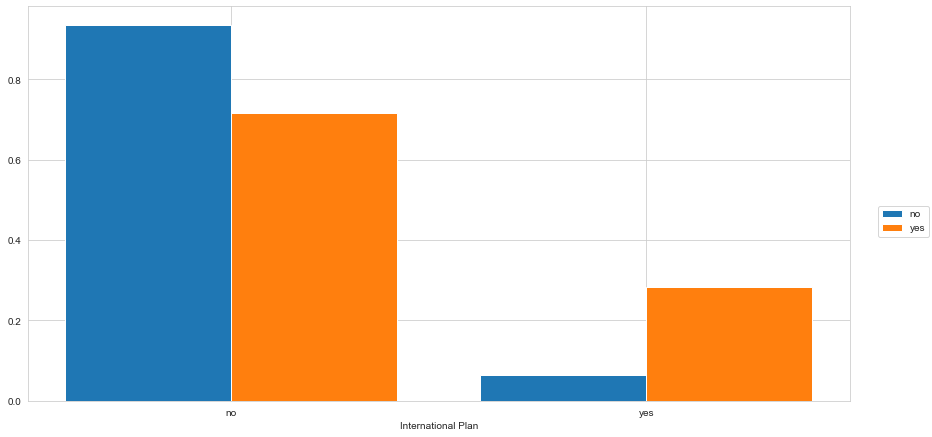

In [182]:
g = dxp.aggplot(data=churn_data, agg='Intl_Plan', hue='Churn', normalize='Churn')
g.set(xlabel='International Plan')
plt.show()

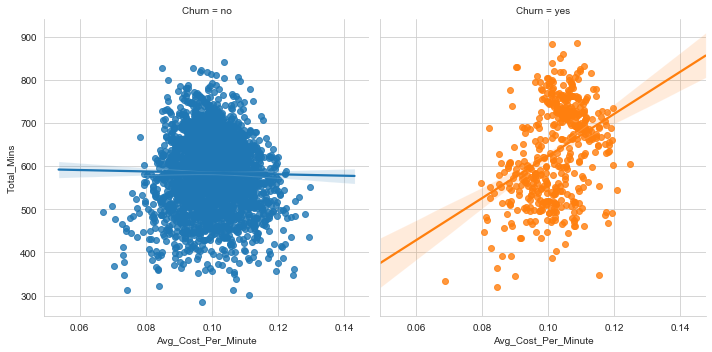

In [183]:
sns.lmplot(data=churn_data, x='Avg_Cost_Per_Minute', y='Total_Mins', hue='Churn', col='Churn')

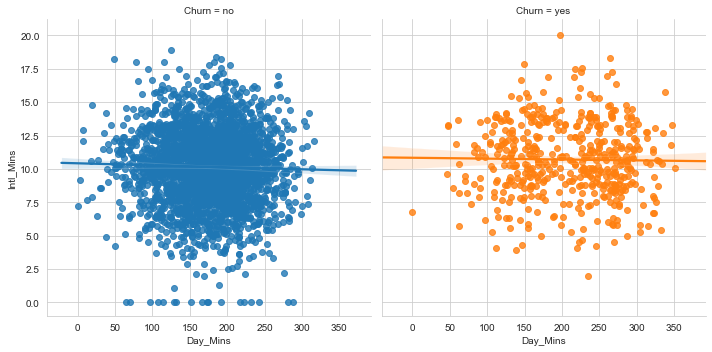

In [184]:
sns.set_style('whitegrid')
sns.lmplot(data=churn_data, x='Day_Mins', y='Intl_Mins', hue='Churn', col='Churn', x_jitter=.03)

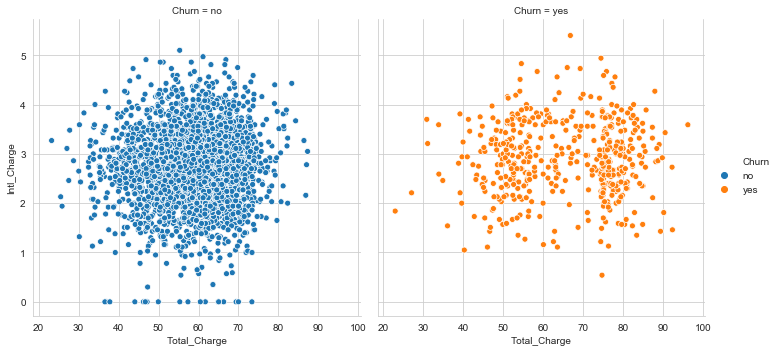

In [185]:
sns.set_style('whitegrid')
sns.relplot(data=churn_data, x='Total_Charge', y='Intl_Charge', hue='Churn', col='Churn', kind='scatter')

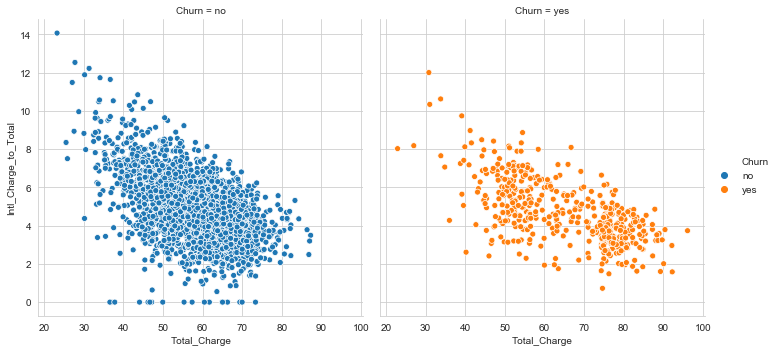

In [186]:
sns.set_style('whitegrid')
sns.relplot(data=churn_data, x='Total_Charge', y='Intl_Charge_to_Total', hue='Churn', col='Churn', kind='scatter')

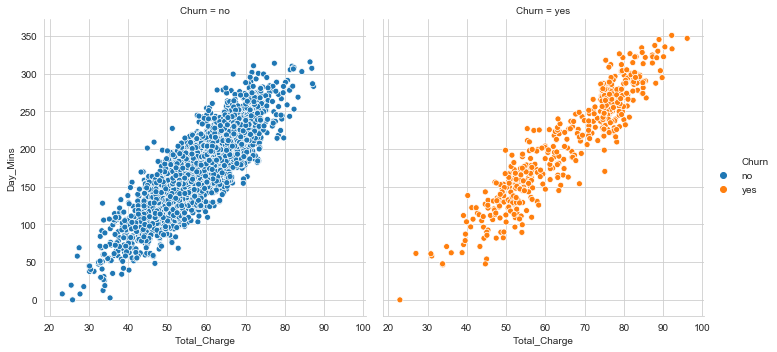

In [187]:
sns.set_style('whitegrid')
sns.relplot(data=churn_data, x='Total_Charge', y='Day_Mins', hue='Churn', col='Churn', kind='scatter')

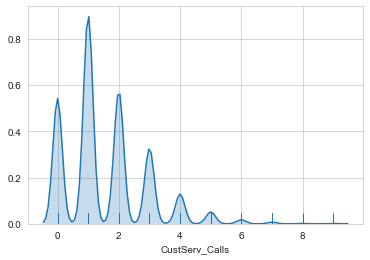

In [188]:
# visualize distribution of account length to get a sense of increment

sns.set_style('whitegrid')
sns.distplot(quant['CustServ_Calls'], hist=False,
            rug=True, kde_kws={'shade': True})

In [189]:
cols_x = churn_data2.columns

for i in enumerate(cols_x):
    print(i)

(0, 'Phone')
(1, 'Area_Code')
(2, 'State')
(3, 'Churn')
(4, 'Intl_Plan')
(5, 'Vmail_Plan')
(6, 'CustServ_Calls')
(7, 'Vmail_Message')
(8, 'Account_Length')
(9, 'Day_Mins')
(10, 'Eve_Mins')
(11, 'Night_Mins')
(12, 'Intl_Mins')
(13, 'Total_Mins')
(14, 'Day_Calls')
(15, 'Eve_Calls')
(16, 'Night_Calls')
(17, 'Intl_Calls')
(18, 'Day_Charge')
(19, 'Eve_Charge')
(20, 'Night_Charge')
(21, 'Intl_Charge')
(22, 'Total_Calls')
(23, 'Total_Charge')
(24, 'Cost_Per_Day_Minute')
(25, 'Cost_Per_Eve_Minute')
(26, 'Cost_Per_Night_Minute')
(27, 'Cost_Per_Intl_Minute')
(28, 'Avg_Daily_Charge')
(29, 'Avg_Cost_Per_Minute')
(30, 'Avg_Minutes_Per_Call')
(31, 'Avg_Cost_Per_Call')
(32, 'Day_Mins_to_Total')
(33, 'Eve_Mins_to_Total')
(34, 'Night_Mins_to_Total')
(35, 'Intl_Mins_to_Total')
(36, 'Day_Charge_to_Total')
(37, 'Eve_Charge_to_Total')
(38, 'Night_Charge_to_Total')
(39, 'Intl_Charge_to_Total')
(40, 'Total_Charge_Over_70')
(41, 'Care_Status')


In [190]:
churn_data2 = churn_data2.round(2)


In [191]:
churn_data2.to_csv('churn_data.csv')

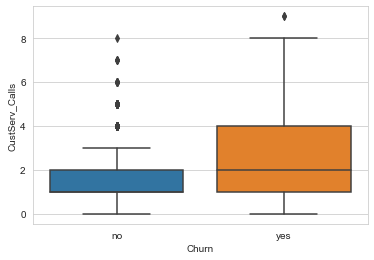

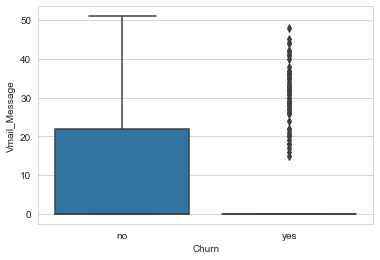

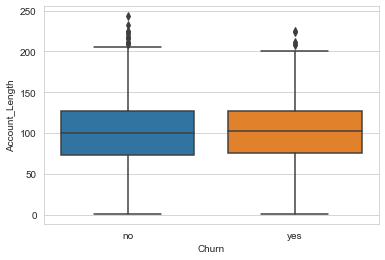

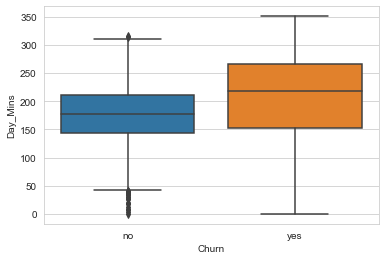

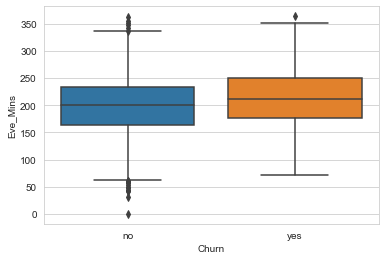

...

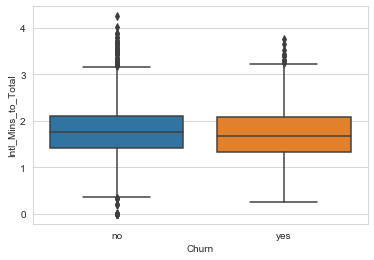

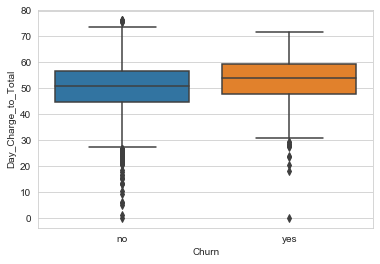

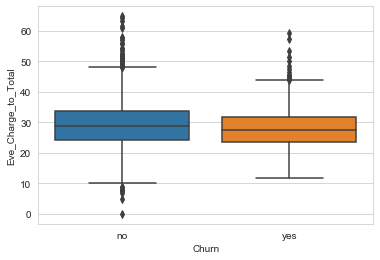

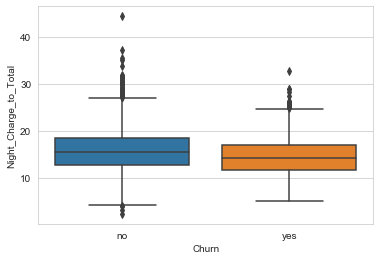

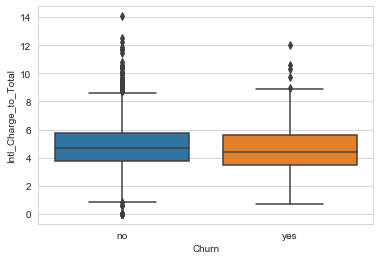

In [192]:
for i in range(1,30):   
    sns.boxplot(data=quant, y=quant.columns[i], x='Churn')
    plt.show()

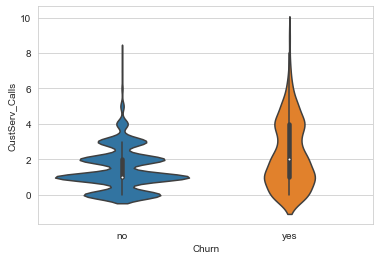

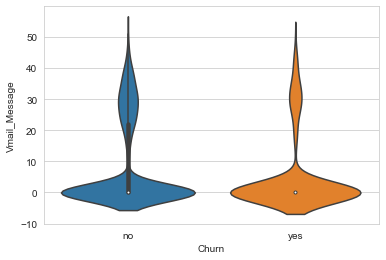

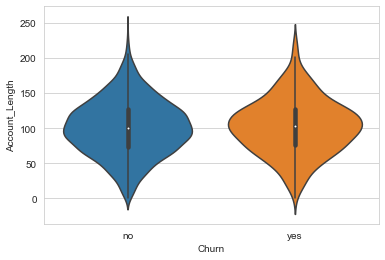

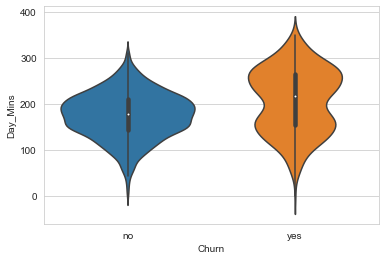

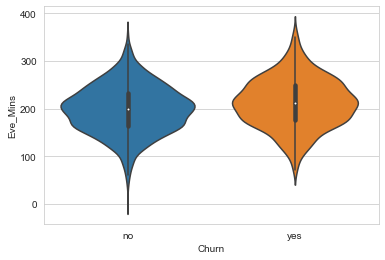

...

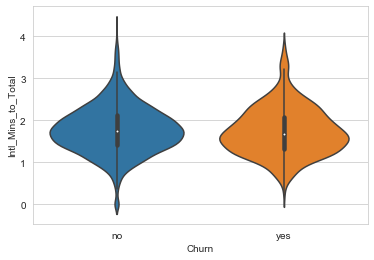

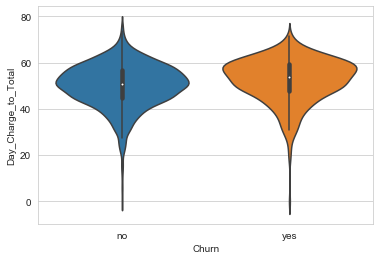

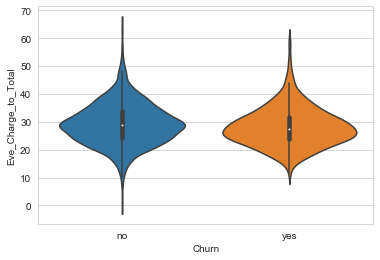

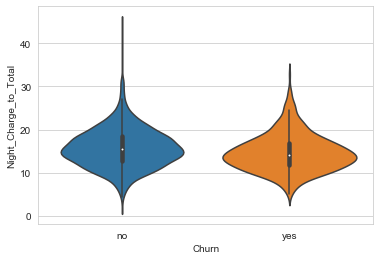

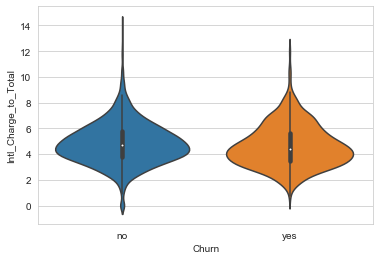

In [193]:
for i in range(1,30):   
    sns.violinplot(data=quant, y=quant.columns[i], x='Churn', inner='box')
    plt.show()

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning:

invalid value encountered in true_divide

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning:

invalid value encountered in double_scalars

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:311: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



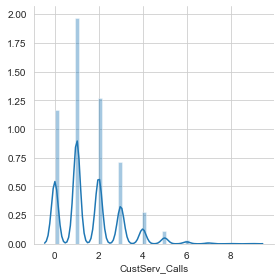

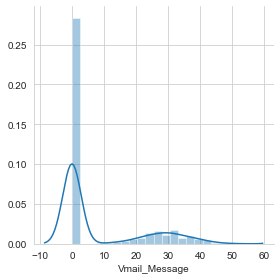

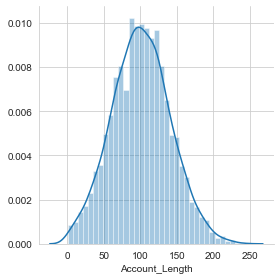

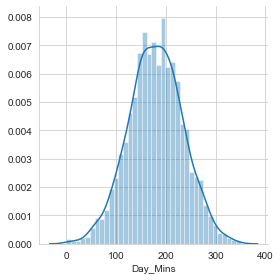

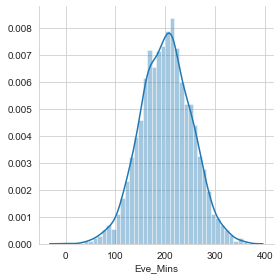

...

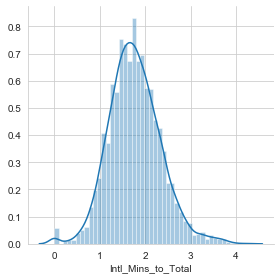

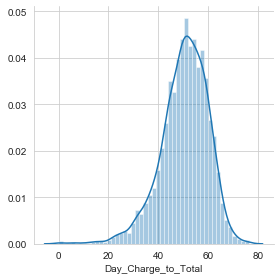

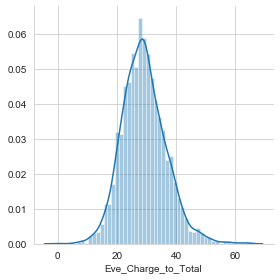

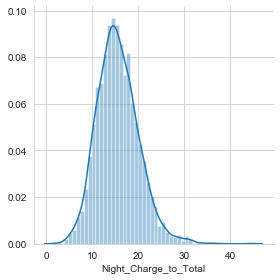

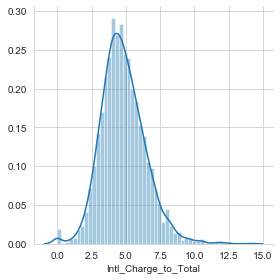

In [194]:
for i in range(6, 40):  
    ChurnGrid = sns.FacetGrid(churn_data2, height=4)
    ChurnGrid.map(sns.distplot, churn_data2.columns[i])

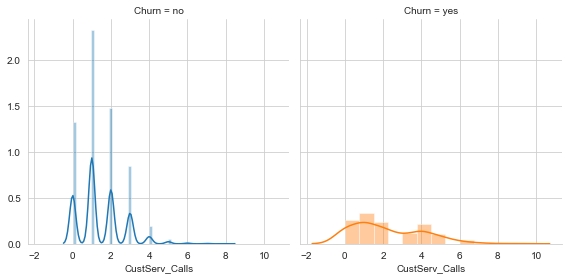

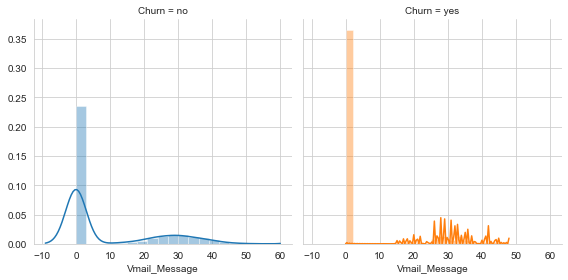

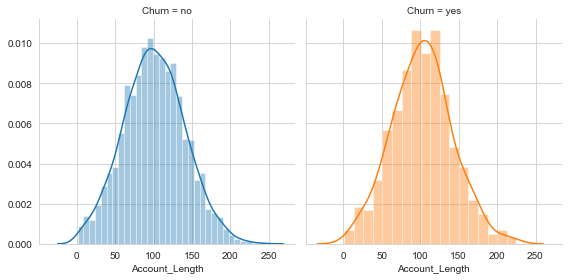

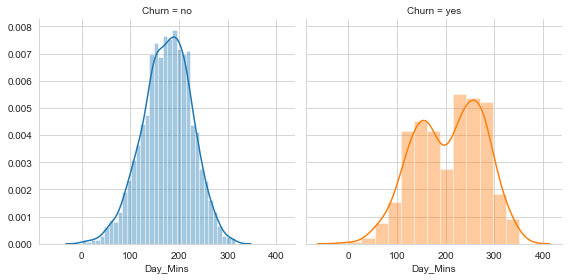

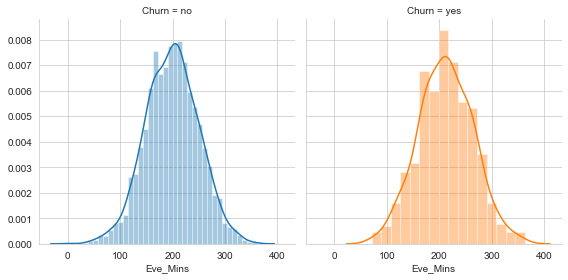

...

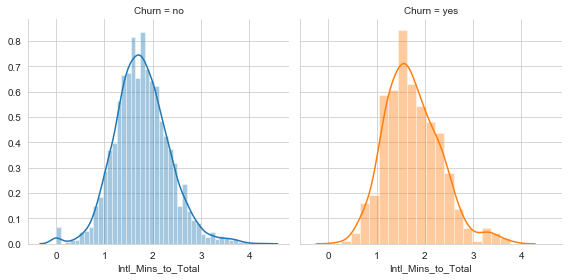

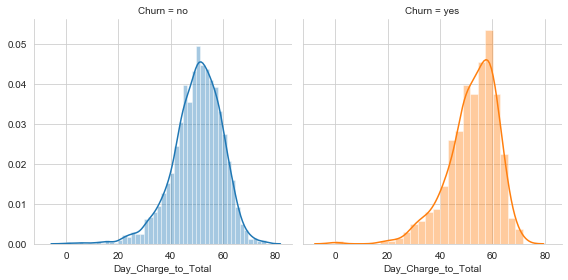

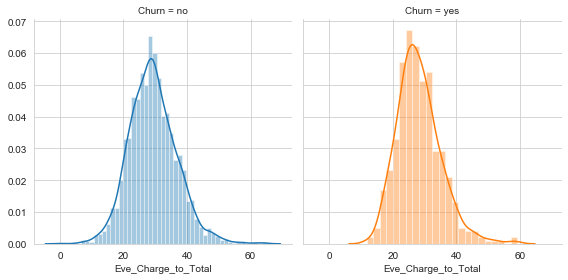

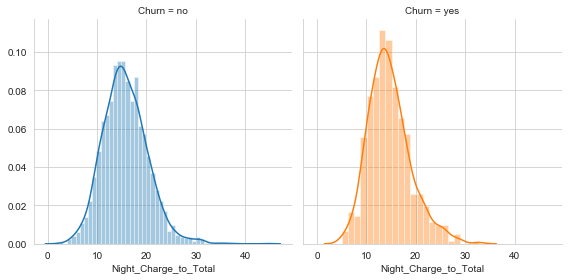

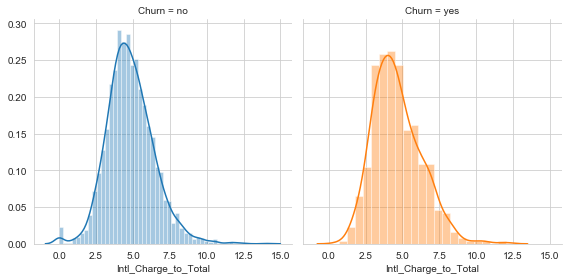

In [195]:
for i in range(6, 40):  
    ChurnGrid = sns.FacetGrid(churn_data2, hue="Churn", col='Churn', height=4)
    ChurnGrid.map(sns.distplot, churn_data2.columns[i])

In [196]:
churn_data3 = churn_data2.copy()

In [197]:
churn_data3

,Phone,Area_Code,State,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70,Care_Status
0,382-4657,415,KS,no,no,yes,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.17,0.09,0.04,0.27,0.59,0.11,2.37,0.25,36.96,27.52,34.12,1.39,59.65,22.21,14.57,3.57,yes,low
1,371-7191,415,OH,no,no,yes,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.17,0.09,0.05,0.27,0.55,0.09,1.88,0.18,25.85,31.27,40.69,2.19,46.37,28.06,19.33,6.25,no,low
2,358-1921,415,NJ,no,no,no,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.17,0.08,0.05,0.27,0.45,0.12,1.62,0.19,45.12,22.47,30.14,2.26,66.43,16.54,11.75,5.28,no,none
3,375-9999,408,OH,no,yes,no,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.17,0.08,0.04,0.27,0.80,0.12,2.21,0.26,53.01,10.96,34.86,1.17,76.20,7.87,13.26,2.66,no,high
4,330-6626,415,OK,no,yes,no,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.17,0.09,0.04,0.27,0.69,0.10,1.43,0.15,32.56,28.96,36.50,1.97,54.41,24.21,16.15,5.24,no,critical
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,414-4276,415,AZ,no,no,yes,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.17,0.09,0.05,0.27,0.31,0.09,2.26,0.21,23.64,32.62,42.24,1.50,44.18,30.48,20.90,4.44,no,high
3329,370-3271,415,WV,no,no,no,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.17,0.09,0.05,0.27,0.93,0.11,2.45,0.27,39.48,26.20,32.68,1.64,61.84,20.53,13.55,4.08,no,critical
3330,328-8230,510,RI,no,no,no,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,0.17,0.09,0.05,0.27,2.42,0.10,2.56,0.26,26.76,42.75,28.40,2.09,45.38,36.24,12.75,5.62,no,high
3331,364-6381,510,CT,no,yes,no,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.17,0.09,0.04,0.27,0.31,0.11,1.54,0.17,41.31,30.83,26.89,0.97,63.18,23.59,10.88,2.35,no,high


In [198]:
churn_data3['Churn'] = churn_data3['Churn'].replace({'no':0, 'yes':1})
churn_data3['Intl_Plan'] = churn_data3['Intl_Plan'].replace({'no':0, 'yes':1})
churn_data3['Vmail_Plan'] = churn_data3['Vmail_Plan'].replace({'no':0, 'yes':1})

In [199]:
churn_data3 = pd.merge(churn_data3, regions, how='left', on='State')

In [200]:
cd3_cols = ['Churn', 'Intl_Plan', 'Vmail_Plan',
       'CustServ_Calls', 'Vmail_Message', 'Account_Length', 'Day_Mins',
       'Eve_Mins', 'Night_Mins', 'Intl_Mins', 'Total_Mins', 'Day_Calls',
       'Eve_Calls', 'Night_Calls', 'Intl_Calls', 'Day_Charge', 'Eve_Charge',
       'Night_Charge', 'Intl_Charge', 'Total_Calls', 'Total_Charge',
       'Avg_Daily_Charge', 'Avg_Cost_Per_Minute',
       'Avg_Minutes_Per_Call', 'Avg_Cost_Per_Call', 'Day_Mins_to_Total',
       'Eve_Mins_to_Total', 'Night_Mins_to_Total', 'Intl_Mins_to_Total',
       'Day_Charge_to_Total', 'Eve_Charge_to_Total', 'Night_Charge_to_Total',
       'Intl_Charge_to_Total', 'US_Region']

churn_data3 = churn_data3[cd3_cols]

In [201]:
churn_data3

,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,US_Region
0,0,0,1,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.59,0.11,2.37,0.25,36.96,27.52,34.12,1.39,59.65,22.21,14.57,3.57,Midwest
1,0,0,1,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.55,0.09,1.88,0.18,25.85,31.27,40.69,2.19,46.37,28.06,19.33,6.25,Midwest
2,0,0,0,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.45,0.12,1.62,0.19,45.12,22.47,30.14,2.26,66.43,16.54,11.75,5.28,Northeast
3,0,1,0,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.80,0.12,2.21,0.26,53.01,10.96,34.86,1.17,76.20,7.87,13.26,2.66,Midwest
4,0,1,0,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.69,0.10,1.43,0.15,32.56,28.96,36.50,1.97,54.41,24.21,16.15,5.24,South
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,0,0,1,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.31,0.09,2.26,0.21,23.64,32.62,42.24,1.50,44.18,30.48,20.90,4.44,West
3329,0,0,0,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.93,0.11,2.45,0.27,39.48,26.20,32.68,1.64,61.84,20.53,13.55,4.08,South
3330,0,0,0,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,2.42,0.10,2.56,0.26,26.76,42.75,28.40,2.09,45.38,36.24,12.75,5.62,Northeast
3331,0,1,0,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.31,0.11,1.54,0.17,41.31,30.83,26.89,0.97,63.18,23.59,10.88,2.35,Northeast


In [202]:
churn_data3 = pd.get_dummies(churn_data3)

In [203]:
churn_data3.columns

Index(['Churn', 'Intl_Plan', 'Vmail_Plan', 'CustServ_Calls', 'Vmail_Message',
       'Account_Length', 'Day_Mins', 'Eve_Mins', 'Night_Mins', 'Intl_Mins',
       'Total_Mins', 'Day_Calls', 'Eve_Calls', 'Night_Calls', 'Intl_Calls',
       'Day_Charge', 'Eve_Charge', 'Night_Charge', 'Intl_Charge',
       'Total_Calls', 'Total_Charge', 'Avg_Daily_Charge',
       'Avg_Cost_Per_Minute', 'Avg_Minutes_Per_Call', 'Avg_Cost_Per_Call',
       'Day_Mins_to_Total', 'Eve_Mins_to_Total', 'Night_Mins_to_Total',
       'Intl_Mins_to_Total', 'Day_Charge_to_Total', 'Eve_Charge_to_Total',
       'Night_Charge_to_Total', 'Intl_Charge_to_Total', 'US_Region_Midwest',
       'US_Region_Northeast', 'US_Region_Other', 'US_Region_South',
       'US_Region_West'],
      dtype='object')

In [204]:
churn_matrix = churn_data3.corr()
churn_matrix = churn_matrix.round(4)
churn_matrix

,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,US_Region_Midwest,US_Region_Northeast,US_Region_Other,US_Region_South,US_Region_West
Churn,1.0000,0.2599,-0.1021,0.2087,-0.0897,0.0165,0.2052,0.0928,0.0355,0.0682,0.1986,0.0185,0.0092,0.0061,-0.0528,0.2052,0.0928,0.0355,0.0683,0.0158,0.2315,0.0030,0.0972,0.1446,0.1814,0.0956,-0.0237,-0.0742,-0.0222,0.0864,-0.0516,-0.0827,-0.0400,-0.0294,0.0374,-0.0450,-0.0017,0.0105
Intl_Plan,0.2599,1.0000,0.0060,-0.0245,0.0087,0.0247,0.0494,0.0191,-0.0289,0.0459,0.0259,0.0038,0.0061,0.0125,0.0174,0.0494,0.0191,-0.0289,0.0458,0.0140,0.0484,-0.0058,0.0634,0.0127,0.0336,0.0422,0.0052,-0.0510,0.0232,0.0332,-0.0124,-0.0525,0.0081,0.0133,0.0283,-0.0184,-0.0058,-0.0263
Vmail_Plan,-0.1021,0.0060,1.0000,-0.0178,0.9569,0.0029,-0.0017,0.0215,0.0061,-0.0013,0.0145,-0.0111,-0.0064,0.0156,0.0076,-0.0017,0.0216,0.0061,-0.0013,-0.0008,0.0086,0.0102,-0.0035,0.0111,0.0087,-0.0077,0.0149,-0.0063,-0.0091,-0.0077,0.0133,-0.0019,-0.0109,0.0205,-0.0122,0.0075,-0.0009,-0.0090
CustServ_Calls,0.2087,-0.0245,-0.0178,1.0000,-0.0133,-0.0038,-0.0134,-0.0130,-0.0093,-0.0096,-0.0210,-0.0189,0.0024,-0.0128,-0.0176,-0.0134,-0.0130,-0.0093,-0.0097,-0.0182,-0.0199,-0.0053,-0.0145,-0.0085,-0.0106,-0.0066,0.0014,0.0056,-0.0000,-0.0045,0.0017,0.0060,0.0019,-0.0410,-0.0031,-0.0014,0.0316,0.0088
Vmail_Message,-0.0897,0.0087,0.9569,-0.0133,1.0000,-0.0046,0.0008,0.0176,0.0077,0.0029,0.0148,-0.0095,-0.0059,0.0071,0.0140,0.0008,0.0176,0.0077,0.0029,-0.0039,0.0098,0.0088,-0.0006,0.0131,0.0110,-0.0048,0.0086,-0.0032,-0.0048,-0.0051,0.0075,0.0007,-0.0066,0.0204,-0.0104,0.0047,0.0012,-0.0118
Account_Length,0.0165,0.0247,0.0029,-0.0038,-0.0046,1.0000,0.0062,-0.0068,-0.0090,0.0095,-0.0048,0.0385,0.0193,-0.0132,0.0207,0.0062,-0.0067,-0.0090,0.0095,0.0275,0.0015,-0.2969,0.0226,-0.0218,-0.0156,0.0116,-0.0075,-0.0053,0.0095,0.0088,-0.0085,-0.0069,0.0067,0.0074,0.0005,0.0014,-0.0087,0.0011
Day_Mins,0.2052,0.0494,-0.0017,-0.0134,0.0008,0.0062,1.0000,0.0070,0.0043,-0.0102,0.6116,0.0068,0.0158,0.0230,0.0080,1.0000,0.0070,0.0043,-0.0101,0.0267,0.8848,0.0301,0.7398,0.4692,0.7227,0.8586,-0.4314,-0.4380,-0.3154,0.8644,-0.6434,-0.5753,-0.5141,0.0353,0.0107,-0.0087,-0.0161,-0.0227
Eve_Mins,0.0928,0.0191,0.0215,-0.0130,0.0176,-0.0068,0.0070,1.0000,-0.0126,-0.0110,0.5606,-0.0215,-0.0114,0.0076,0.0025,0.0070,1.0000,-0.0126,-0.0111,-0.0146,0.4131,0.0181,-0.1411,0.4530,0.3520,-0.3352,0.7889,-0.4188,-0.2910,-0.3846,0.7136,-0.2816,-0.2447,0.0104,0.0112,-0.0467,-0.0111,0.0097
Night_Mins,0.0355,-0.0289,0.0061,-0.0093,0.0077,-0.0090,0.0043,-0.0126,1.0000,-0.0152,0.5573,0.0229,-0.0021,0.0112,-0.0124,0.0043,-0.0126,1.0000,-0.0152,0.0176,0.2143,0.0045,-0.5321,0.4329,0.1699,-0.3348,-0.4106,0.7824,-0.2912,-0.1941,-0.1689,0.7364,-0.1351,0.0245,0.0311,-0.0100,-0.0187,-0.0293
Intl_Mins,0.0682,0.0459,-0.0013,-0.0096,0.0029,0.0095,-0.0102,-0.0110,-0.0152,1.0000,0.0101,0.0216,0.0087,-0.0136,0.0323,-0.0102,-0.0110,-0.0152,1.0000,0.0122,0.0550,-0.0331,0.0994,0.0023,0.0397,-0.0188,-0.0190,-0.0262,0.8459,-0.0695,-0.0511,-0.0504,0.7891,-0.0172,0.0028,-0.0129,0.0051,0.0130


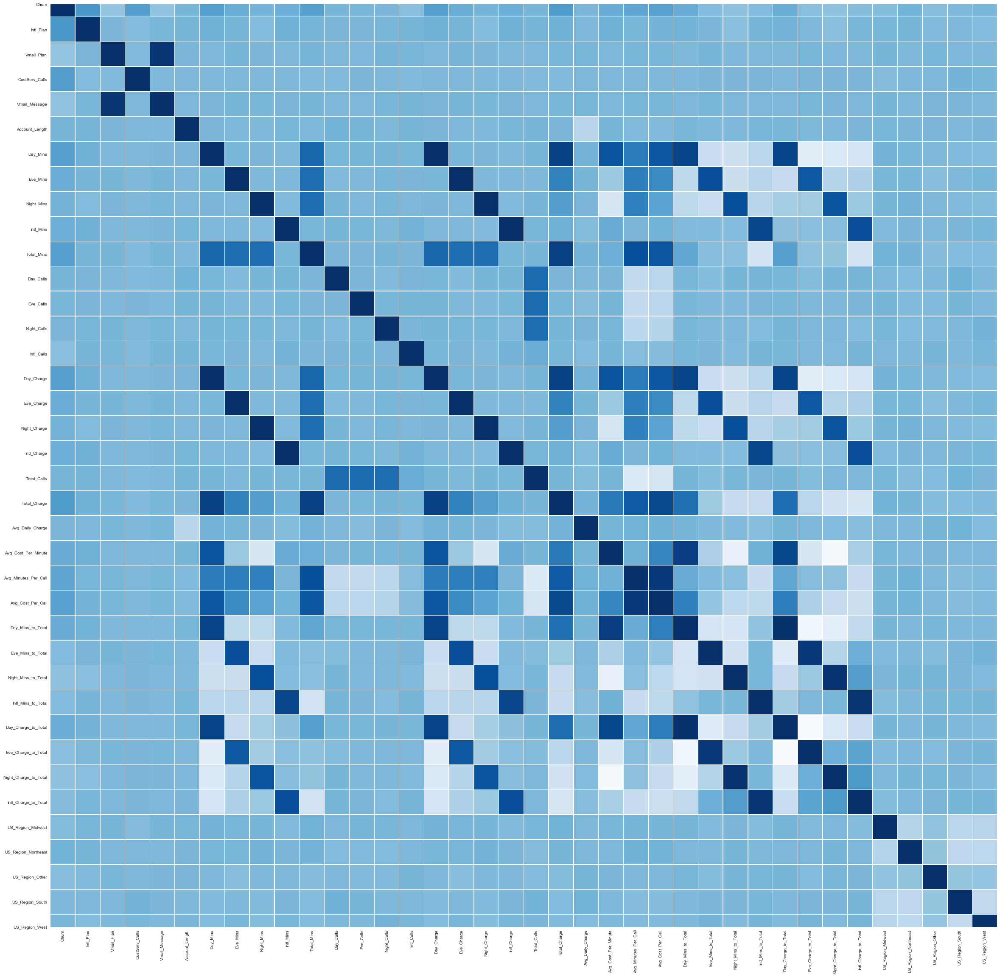

In [205]:
plt.subplots(figsize=(40, 40))
sns.set(font_scale=2)
sns.heatmap(churn_matrix, cmap='Blues', cbar=False, linewidths=.5)

In [206]:
churn_matrix = churn_matrix.sort_values('Churn', ascending=True)

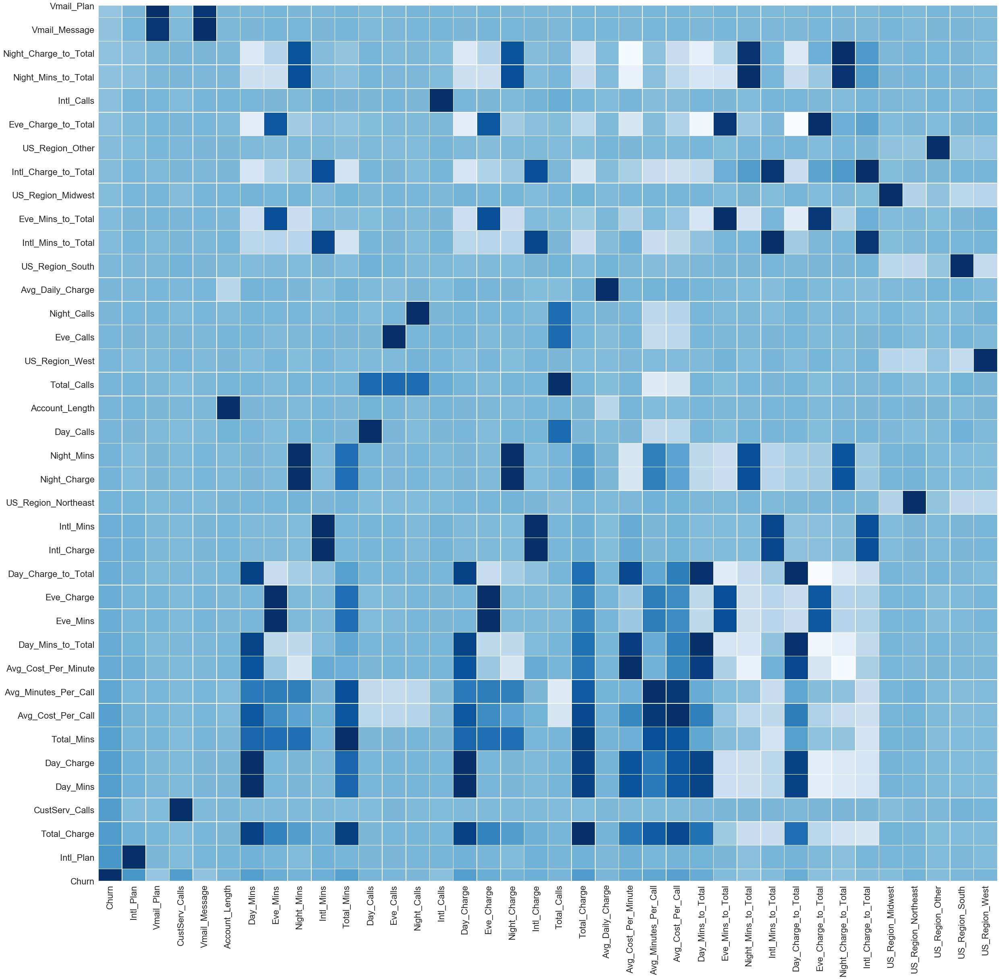

In [207]:
plt.subplots(figsize=(40, 40))
sns.set(font_scale=2)
sns.heatmap(churn_matrix, cmap='Blues', cbar=False, linewidths=.5)

In [208]:
churn_data3

,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,US_Region_Midwest,US_Region_Northeast,US_Region_Other,US_Region_South,US_Region_West
0,0,0,1,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.59,0.11,2.37,0.25,36.96,27.52,34.12,1.39,59.65,22.21,14.57,3.57,1,0,0,0,0
1,0,0,1,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.55,0.09,1.88,0.18,25.85,31.27,40.69,2.19,46.37,28.06,19.33,6.25,1,0,0,0,0
2,0,0,0,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.45,0.12,1.62,0.19,45.12,22.47,30.14,2.26,66.43,16.54,11.75,5.28,0,1,0,0,0
3,0,1,0,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.80,0.12,2.21,0.26,53.01,10.96,34.86,1.17,76.20,7.87,13.26,2.66,1,0,0,0,0
4,0,1,0,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.69,0.10,1.43,0.15,32.56,28.96,36.50,1.97,54.41,24.21,16.15,5.24,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,0,0,1,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.31,0.09,2.26,0.21,23.64,32.62,42.24,1.50,44.18,30.48,20.90,4.44,0,0,0,0,1
3329,0,0,0,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.93,0.11,2.45,0.27,39.48,26.20,32.68,1.64,61.84,20.53,13.55,4.08,0,0,0,1,0
3330,0,0,0,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,2.42,0.10,2.56,0.26,26.76,42.75,28.40,2.09,45.38,36.24,12.75,5.62,0,1,0,0,0
3331,0,1,0,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.31,0.11,1.54,0.17,41.31,30.83,26.89,0.97,63.18,23.59,10.88,2.35,0,1,0,0,0


In [209]:
cont_columns = churn_data3.iloc[:, 4:-5]

In [210]:
cont_columns

,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total
0,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.59,0.11,2.37,0.25,36.96,27.52,34.12,1.39,59.65,22.21,14.57,3.57
1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.55,0.09,1.88,0.18,25.85,31.27,40.69,2.19,46.37,28.06,19.33,6.25
2,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.45,0.12,1.62,0.19,45.12,22.47,30.14,2.26,66.43,16.54,11.75,5.28
3,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.80,0.12,2.21,0.26,53.01,10.96,34.86,1.17,76.20,7.87,13.26,2.66
4,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.69,0.10,1.43,0.15,32.56,28.96,36.50,1.97,54.41,24.21,16.15,5.24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.31,0.09,2.26,0.21,23.64,32.62,42.24,1.50,44.18,30.48,20.90,4.44
3329,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.93,0.11,2.45,0.27,39.48,26.20,32.68,1.64,61.84,20.53,13.55,4.08
3330,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,2.42,0.10,2.56,0.26,26.76,42.75,28.40,2.09,45.38,36.24,12.75,5.62
3331,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.31,0.11,1.54,0.17,41.31,30.83,26.89,0.97,63.18,23.59,10.88,2.35


In [211]:
cont_col_names = cont_columns.columns

In [212]:
from sklearn.preprocessing import StandardScaler

In [213]:
cont_cols_scaled = StandardScaler().fit_transform(cont_columns)
cont_columns_scaled_df = pd.DataFrame(cont_cols_scaled, columns=cont_col_names)

In [214]:
cont_columns_scaled_df.describe()

,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total
count,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03,3.333000e+03
mean,3.832651e-16,1.713134e-16,7.081711e-16,-1.067919e-16,6.602046e-17,-3.274375e-16,1.661504e-16,-2.150828e-16,3.527531e-16,-7.041739e-17,-1.264615e-16,-3.226409e-16,1.266447e-16,-3.134473e-17,2.785384e-16,6.449820e-16,-1.731455e-16,-1.486668e-17,-1.306835e-16,3.733387e-16,-3.440925e-16,2.342194e-16,-2.296310e-16,-4.026016e-16,-3.388254e-16,-6.330403e-16,2.152275e-16,2.491590e-17,-1.677420e-16
std,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00,1.000150e+00
min,-5.917599e-01,-2.513172e+00,-3.301096e+00,-3.963622e+00,-3.513648e+00,-3.667413e+00,-3.419637e+00,-5.005247e+00,-5.025911e+00,-3.429870e+00,-1.820289e+00,-3.301162e+00,-3.963679e+00,-3.515366e+00,-3.668210e+00,-3.313798e+00,-3.477845e+00,-2.632404e-01,-3.420799e+00,-3.090424e+00,-3.039910e+00,-3.925249e+00,-4.595386e+00,-3.734366e+00,-3.127417e+00,-5.335515e+00,-3.929008e+00,-2.957288e+00,-2.999179e+00
25%,-5.917599e-01,-6.797448e-01,-6.624241e-01,-6.780300e-01,-6.698545e-01,-6.223690e-01,-6.711615e-01,-6.695701e-01,-6.583610e-01,-6.699340e-01,-6.011951e-01,-6.623760e-01,-6.783123e-01,-6.676792e-01,-6.164341e-01,-6.717509e-01,-6.732660e-01,-1.641597e-01,-1.169313e+00,-6.759069e-01,-6.527036e-01,-6.429628e-01,-6.513861e-01,-6.617366e-01,-6.566981e-01,-5.758004e-01,-6.750862e-01,-6.805796e-01,-6.618629e-01
50%,-5.917599e-01,-1.627644e-03,-6.887677e-03,8.276141e-03,6.485803e-03,2.246393e-02,1.929296e-02,2.812491e-02,-5.738630e-03,-5.505089e-03,-1.948306e-01,-6.730063e-03,8.459274e-03,4.691242e-03,2.045823e-02,-3.980888e-03,1.928067e-03,-1.163276e-01,-4.357060e-02,-6.564428e-02,-1.752623e-01,1.583335e-02,-1.499559e-02,-6.603428e-03,-5.666631e-02,8.165963e-02,-6.716636e-02,-7.464561e-02,-8.065859e-02
75%,8.695542e-01,6.513740e-01,6.725198e-01,6.768330e-01,6.808485e-01,6.672969e-01,6.730566e-01,6.759846e-01,6.970854e-01,6.589239e-01,6.178983e-01,6.726790e-01,6.766695e-01,6.814562e-01,6.706192e-01,6.637891e-01,6.695036e-01,-3.774636e-02,1.082172e+00,6.242178e-01,5.408995e-01,6.707313e-01,6.389598e-01,6.701871e-01,5.963094e-01,7.052954e-01,6.000628e-01,5.936640e-01,5.942883e-01
max,3.134591e+00,3.564766e+00,3.140422e+00,3.209066e+00,3.839081e+00,3.497397e+00,3.259203e+00,3.217588e+00,3.508382e+00,3.827739e+00,6.307001e+00,3.140803e+00,3.207980e+00,3.836763e+00,3.496829e+00,3.218735e+00,3.495033e+00,2.358105e+01,3.333658e+00,4.365393e+00,5.076591e+00,3.469640e+00,4.157348e+00,4.335684e+00,4.372980e+00,2.723127e+00,4.809672e+00,6.421323e+00,5.787630e+00


In [215]:
add_cols = ['Churn', 'Intl_Plan', 'Vmail_Plan', 'CustServ_Calls', 'US_Region_Midwest', 'US_Region_Northeast', 'US_Region_Other', 'US_Region_South', 'US_Region_West']

In [216]:
for i in add_cols:
    cont_columns_scaled_df[i] = churn_data3[i]

In [217]:
cont_columns_scaled_df

,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,US_Region_Midwest,US_Region_Northeast,US_Region_Other,US_Region_South,US_Region_West
0,1.234883,0.676489,1.566767,-0.070610,0.866743,-0.085008,1.393531,0.476643,-0.055940,-0.465494,-0.601195,1.567036,-0.070427,0.866029,-0.085690,-0.062048,1.534209,-0.116328,1.082172,1.075281,1.257061,0.877336,-0.877028,0.015054,-0.674346,0.969548,-0.935238,-0.223901,-0.768104,0,0,1,1,1,0,0,0,0
1,1.307948,0.149065,-0.333738,-0.108080,1.058571,1.240482,0.370635,1.124503,0.144867,0.147825,-0.601195,-0.334013,-0.107549,1.059390,1.241169,0.779923,-0.019975,-0.129994,-1.169313,-0.224843,-0.413983,-0.566298,-0.370347,0.904357,0.737493,-0.434161,-0.146695,0.836483,0.906764,0,0,1,1,1,0,0,0,0
2,-0.591760,0.902529,1.168304,-1.573383,-0.756869,0.703121,-0.583326,0.675985,0.496279,0.198935,0.211534,1.168464,-1.573900,-0.755571,0.697156,0.808957,0.270482,-0.164160,2.207915,-0.914705,-0.175262,1.937647,-1.559357,-0.523671,0.861029,1.686200,-1.699519,-0.852112,0.300561,0,0,0,0,0,1,0,0,0
3,-0.591760,-0.428590,2.196596,-2.742865,-0.078551,-1.303026,-0.300918,-1.466936,-0.608159,-0.567714,1.024263,2.196759,-2.743268,-0.078806,-1.306401,-1.455655,0.699978,-0.044580,2.207915,0.650751,1.495782,2.962874,-3.114528,0.115219,-1.062602,2.718899,-2.868181,-0.515730,-1.336810,0,1,0,2,1,0,0,0,0
4,-0.591760,-0.654629,-0.240090,-1.038932,-0.276311,-0.049184,-0.887971,0.626149,1.098699,1.067803,-0.601195,-0.240041,-1.037939,-0.276562,-0.045885,1.563827,-0.700883,-0.082162,-0.043571,-1.418835,-1.130145,0.305600,-0.682462,0.337206,0.349238,0.415675,-0.665651,0.128075,0.275563,0,1,0,3,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,2.038605,2.283878,-0.432895,0.286348,1.547039,-0.120832,0.765340,-1.167924,1.299506,-0.874374,0.617898,-0.433386,0.286880,1.547188,-0.125496,-0.381416,0.061924,-0.211992,-1.169313,0.783417,0.302179,-0.853466,-0.187942,1.114162,-0.480218,-0.665646,0.179506,1.186232,-0.224397,0,0,1,2,0,0,0,0,1
3329,-0.591760,-0.830437,0.942447,-0.938353,-0.189297,-0.228304,-0.071878,-2.164631,-2.264816,1.170023,-0.194831,0.942714,-0.938172,-0.188670,-0.231645,-1.920191,0.388570,-0.000164,1.082172,1.287547,1.734503,1.204785,-1.055379,-0.179862,-0.233146,1.201033,-1.161692,-0.451127,-0.449380,0,0,0,3,0,0,0,1,0
3330,-0.591760,-1.835055,0.018820,1.731930,-0.177431,1.383778,0.931004,0.426808,-2.114211,-0.465494,0.617898,0.019193,1.732349,-0.175486,1.387123,-1.194354,0.789496,0.508906,-0.043571,1.579411,1.495782,-0.448053,1.180770,-0.759194,0.561013,-0.538805,0.955918,-0.629343,0.513045,0,0,0,2,0,1,0,0,0
3331,-0.591760,2.082955,0.624778,-0.816080,-1.219628,-1.876211,-0.825708,0.227466,-0.808966,1.885562,2.243356,0.625153,-0.815203,-1.221396,-1.876950,0.896057,-0.182822,-0.211992,1.082172,-1.126970,-0.652704,1.442575,-0.429798,-0.963585,-1.415562,1.342672,-0.749223,-1.045922,-1.530544,0,1,0,2,0,1,0,0,0


In [218]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X1 = cont_columns_scaled_df

vif = pd.DataFrame()
vif["variables"] = X1.columns
vif["VIF"] = [variance_inflation_factor(X1.values, i) for i in range(X1.shape[1])]

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning:

divide by zero encountered in double_scalars



In [219]:
vif = vif.sort_values('VIF', ascending=False)

In [220]:
vif

,variables,VIF
13,Night_Charge,inf
15,Total_Calls,inf
2,Day_Mins,inf
3,Eve_Mins,inf
4,Night_Mins,inf
5,Intl_Mins,inf
6,Total_Mins,inf
7,Day_Calls,inf
8,Eve_Calls,inf
9,Night_Calls,inf


In [221]:
vif = vif.iloc[16:, :]

In [222]:
vif = vif.round(2)

In [223]:
vif_cols = vif['variables']

In [224]:
vif_cols = list(vif_cols)

In [225]:
vif_cols = [
 'US_Region_South',
 'US_Region_West',
 'US_Region_Northeast',
 'US_Region_Midwest',
 'US_Region_Other',
 'Avg_Daily_Charge',
 'Account_Length',
 'Intl_Plan',
 'CustServ_Calls']

In [226]:
cont_columns_scaled_df2 = cont_columns_scaled_df[vif_cols]

In [227]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X2 = cont_columns_scaled_df2

vif2 = pd.DataFrame()
vif2["variables"] = X2.columns
vif2["VIF"] = [variance_inflation_factor(X2.values, i) for i in range(X2.shape[1])]

In [228]:
vif2 = vif2.sort_values('VIF', ascending=False)
vif2 = vif2.round(2)
vif2

,variables,VIF
0,US_Region_South,1.46
1,US_Region_West,1.40
2,US_Region_Northeast,1.36
3,US_Region_Midwest,1.27
5,Avg_Daily_Charge,1.10
6,Account_Length,1.10
4,US_Region_Other,1.05
7,Intl_Plan,1.00
8,CustServ_Calls,1.00


In [235]:
features = ['Vmail_Message', 'Account_Length', 'Day_Mins', 'Eve_Mins', 'Night_Mins',
       'Intl_Mins', 'Total_Mins', 'Day_Calls', 'Eve_Calls', 'Night_Calls',
       'Intl_Calls', 'Day_Charge', 'Eve_Charge', 'Night_Charge', 'Intl_Charge',
       'Total_Calls', 'Total_Charge', 'Avg_Daily_Charge',
       'Avg_Cost_Per_Minute', 'Avg_Minutes_Per_Call', 'Avg_Cost_Per_Call',
       'Day_Mins_to_Total', 'Eve_Mins_to_Total', 'Night_Mins_to_Total',
       'Intl_Mins_to_Total', 'Day_Charge_to_Total', 'Eve_Charge_to_Total',
       'Night_Charge_to_Total', 'Intl_Charge_to_Total', 'Intl_Plan',
       'Vmail_Plan', 'CustServ_Calls', 'US_Region_Midwest',
       'US_Region_Northeast', 'US_Region_Other', 'US_Region_South',
       'US_Region_West']

In [236]:
target = ['Churn']

In [237]:
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

In [238]:
X = cont_columns_scaled_df[features]
y = cont_columns_scaled_df[target]

In [239]:
clf = RandomForestClassifier()

param_grid = {"max_depth": [3, 5, 8, 15, 25, 30, None],
              "max_features": [1, 3, 10, 15, 20, 30],
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}

random_search = RandomizedSearchCV(clf, param_grid)

random_search.fit(X, y)

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the 

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the 

RandomizedSearchCV(cv=None, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
            

In [241]:
print(random_search.best_params_)

{'max_features': 30, 'max_depth': 5, 'criterion': 'entropy', 'bootstrap': False}


In [242]:
clf2 = RandomForestClassifier(bootstrap=False, max_depth=None, max_features=15, criterion='gini')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
clf2.fit(X_train, y_train)
y_pred = clf2.predict(X_test)


/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [243]:
summary = metrics.classification_report(y_test, y_pred)
print(summary)
print()

              precision    recall  f1-score   support

           0       0.96      1.00      0.98       275
           1       1.00      0.83      0.91        59

    accuracy                           0.97       334
   macro avg       0.98      0.92      0.94       334
weighted avg       0.97      0.97      0.97       334




In [244]:
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

array([[275,   0],
       [ 10,  49]])

(2.0, 0.0)

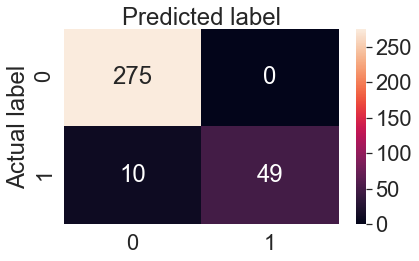

In [245]:
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [246]:
# Calculate feature importances
importances = clf2.feature_importances_

# Create labels
labels = X.columns

feats = {} # a dict to hold feature_name: feature_importance
for feature, importance in zip(labels, importances):
    feats[feature] = importance #add the name/value pair 
    
importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-importance'})
importances = importances.sort_values('Gini-importance', ascending=False)

In [247]:
importances = importances.reset_index()

In [248]:
importances = importances.rename(columns={'index':'Feature', 'Gini-importance': 'Gini-Importance'})

(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 ]),
 <a list of 7 Text xticklabel objects>)

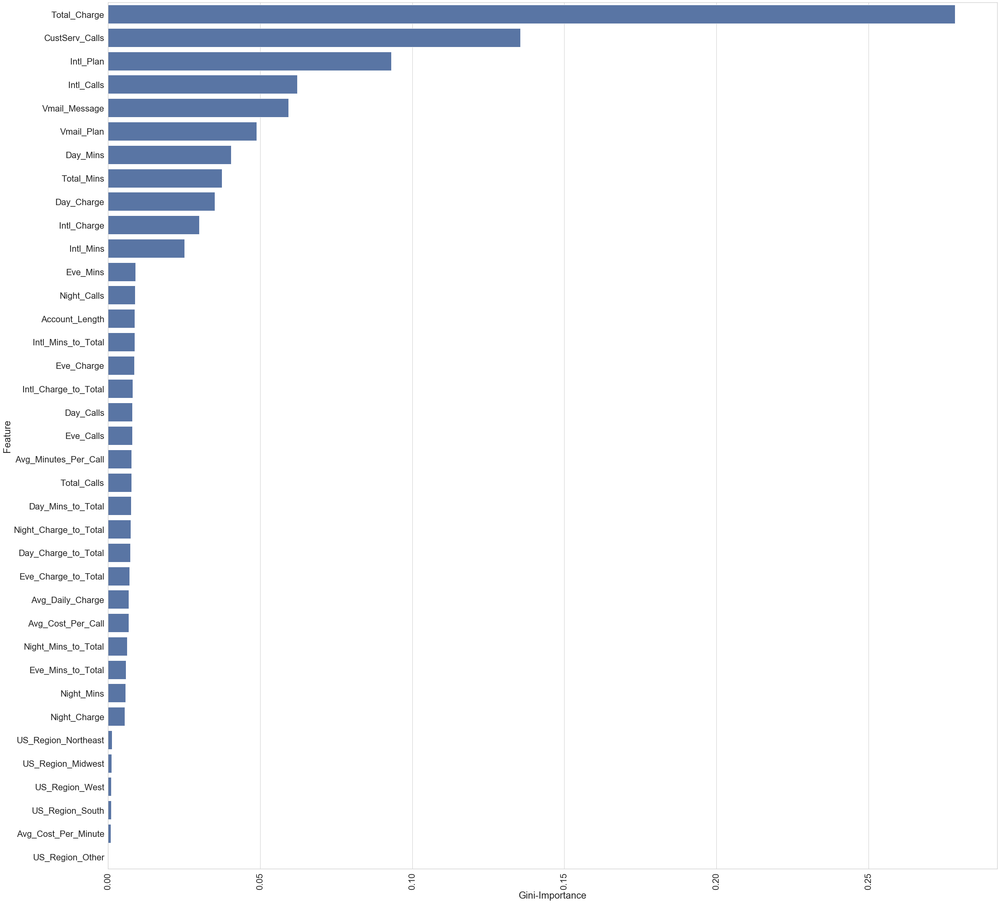

In [249]:
sns.set_style('whitegrid')
plt.subplots(figsize=(40, 40))
sns.set(font_scale=2)
sns.barplot(data=importances,  y='Feature', x='Gini-Importance', color='b')
plt.xticks(rotation=90)

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3666: UserWarning:

The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.



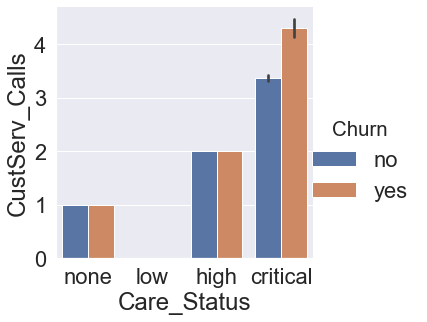

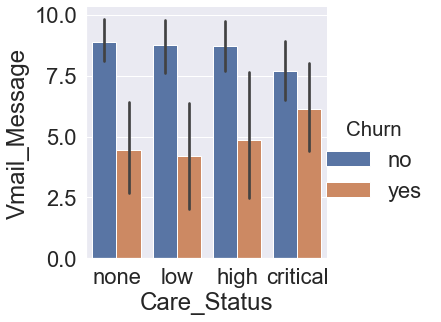

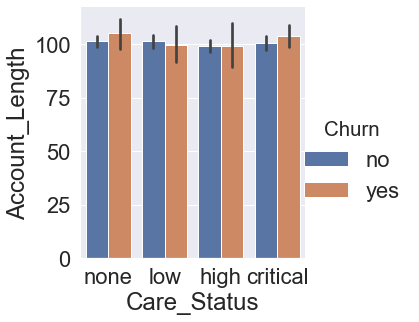

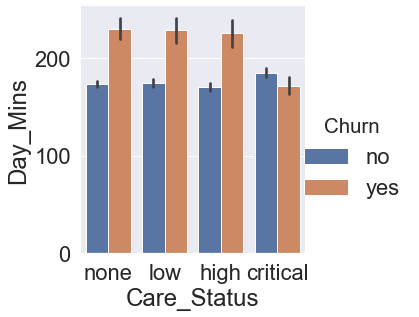

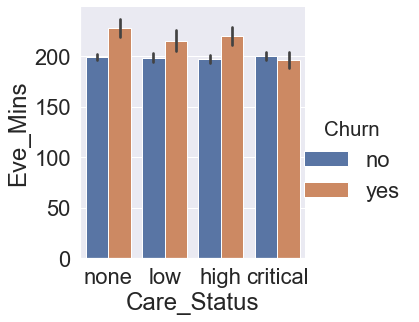

...

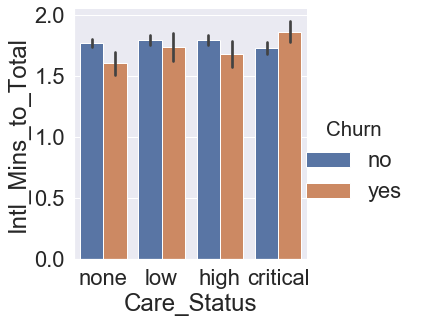

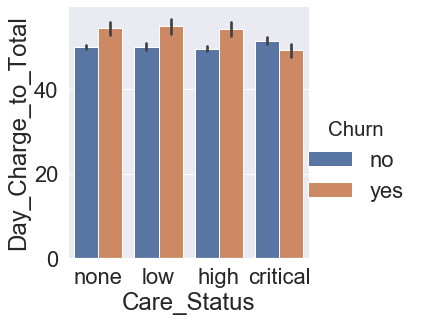

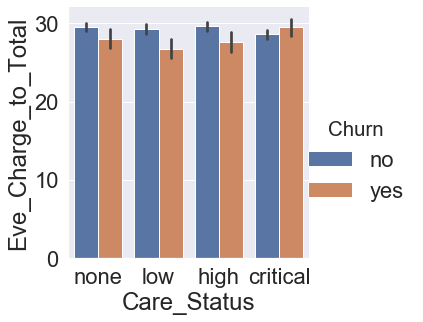

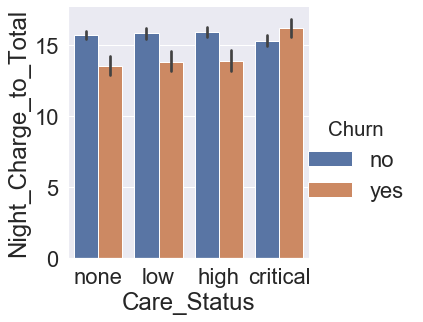

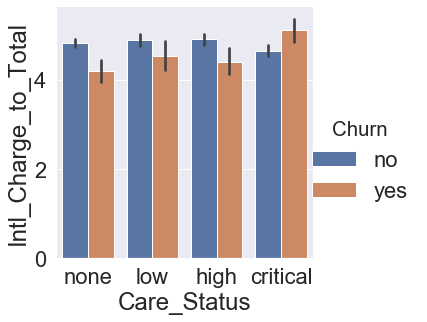

In [250]:
for i in range(6,40):   
    f = sns.factorplot(data=churn_data2, x='Care_Status', y=churn_data2.columns[i], hue='Churn', kind='bar')
    f.set_xticklabels(['none', 'low', 'high', 'critical'])
    plt.show()

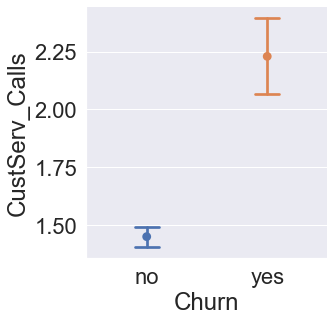

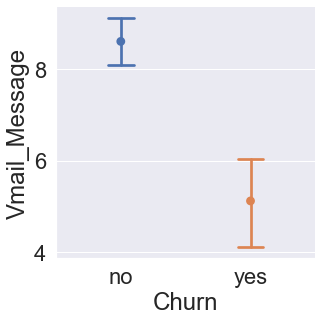

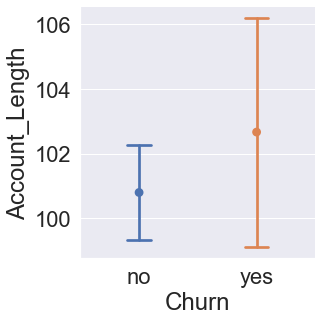

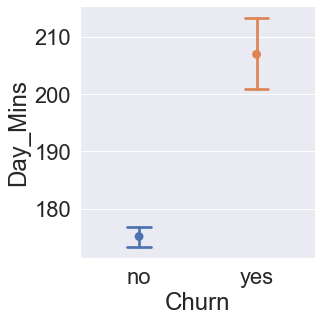

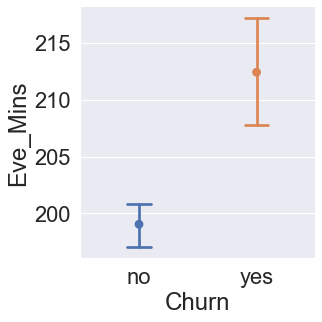

...

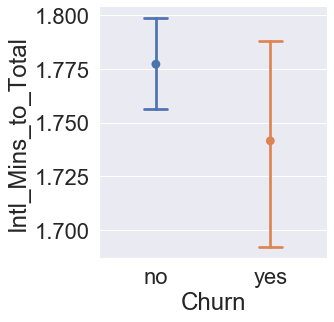

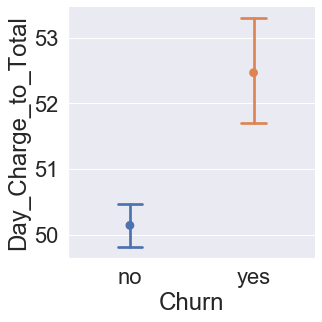

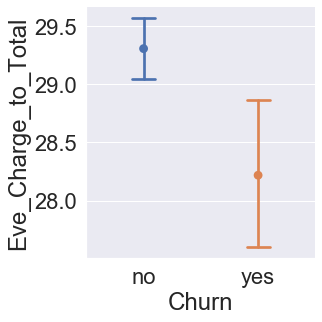

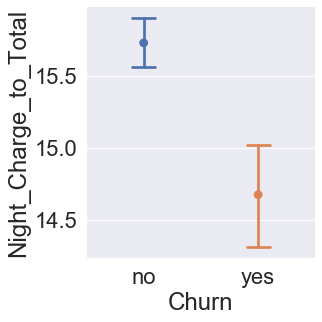

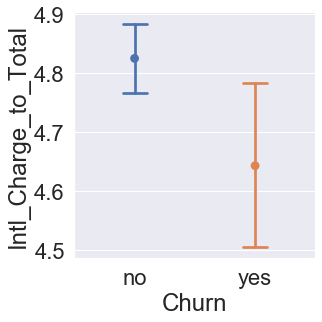

In [251]:
for i in range(6,40):   
    f = sns.factorplot(data=churn_data2, x='Churn', y=churn_data2.columns[i], hue='Churn', kind='point', capsize=0.2)
    plt.show()

In [252]:
cv_df = churn_data2.groupby('Churn')[['Account_Length', 'Avg_Daily_Charge']].agg(np.mean)
cv_df.reset_index()
cv_df['Avg_Cust_Value'] = cv_df['Account_Length']*cv_df['Avg_Daily_Charge']
cv_df

,Account_Length,Avg_Daily_Charge,Avg_Cust_Value
Churn,,,
no,100.793684,0.926818,93.417355
yes,102.664596,0.952091,97.746048


In [253]:
cv_df_stats = cv_df.T
cv_df_stats['Lift_Index'] = cv_df_stats['yes']/cv_df_stats['no']
regions = regions.rename(columns={'X_index': 'State', 'X_0': 'US_Region'})
cv_df_stats = cv_df_stats.rename(columns={'Churn':'Metric', 'no':'Retained', 'yes':'Churned'})
cv_df_stats

Churn,Retained,Churned,Lift_Index
Account_Length,100.793684,102.664596,1.018562
Avg_Daily_Charge,0.926818,0.952091,1.027269
Avg_Cust_Value,93.417355,97.746048,1.046337


In [254]:
cv_df_stats['PCT_Increase'] = (cv_df_stats['Churned'] - cv_df_stats['Retained'])/cv_df_stats['Retained']
cv_df_stats = cv_df_stats.round(2)
cv_df_stats

Churn,Retained,Churned,Lift_Index,PCT_Increase
Account_Length,100.79,102.66,1.02,0.02
Avg_Daily_Charge,0.93,0.95,1.03,0.03
Avg_Cust_Value,93.42,97.75,1.05,0.05


In [255]:
pct_churn_profit = churn_data2.groupby('Churn')['Total_Charge'].agg([len, sum])
pct_churn_profit = pct_churn_profit.rename(columns={'len':'Count', 'sum':'Total_Revenue'})
pct_churn_profit

,Count,Total_Revenue
Churn,,
no,2850.0,166579.10
yes,483.0,31566.93


In [256]:
pct_churn_profit = pct_churn_profit.T
pct_churn_profit = pd.DataFrame(pct_churn_profit)
pct_churn_profit['Total'] = pct_churn_profit.no + pct_churn_profit.yes

In [257]:
pct_churn_profit = pct_churn_profit.reset_index(drop=True)

In [258]:
pct_churn_profit = pct_churn_profit.rename(columns={'no':'Retained', 'yes':'Churned'}, index={0:'Count', 1:'Revenue'})

In [259]:
pct_churn_profit['Retained_PCT_Of_Total'] = (pct_churn_profit['Retained']/pct_churn_profit['Total'])*100
pct_churn_profit['Churned_PCT_Of_Total'] = (1-(pct_churn_profit['Retained']/pct_churn_profit['Total']))*100
pct_churn_profit

Churn,Retained,Churned,Total,Retained_PCT_Of_Total,Churned_PCT_Of_Total
Count,2850.0,483.00,3333.00,85.508551,14.491449
Revenue,166579.1,31566.93,198146.03,84.068856,15.931144


In [260]:
x = 166579.1/2850.0
y = 31566.93/483.00
b = y/x
z = (y-x)/x

print('retained avg rev: ', x)
print('churned avg rev: ', y)
print('for every retained dollar spent: ', b)
print('incremental rev lost per churn customer: ', z)

retained avg rev:  58.448807017543864
churned avg rev:  65.35596273291925
for every retained dollar spent:  1.1181744515897845
incremental rev lost per churn customer:  0.11817445158978442


In [261]:
profit_calcs = pct_churn_profit.iloc[:, -2:]

In [262]:
profit_calcs = profit_calcs.T

In [263]:
profit_calcs = pd.DataFrame(profit_calcs).reset_index()

In [264]:
profit_calcs['Index'] = profit_calcs['Revenue']/profit_calcs['Count']

In [265]:
profit_calcs = profit_calcs.round(2)
profit_calcs

,Churn,Count,Revenue,Index
0,Retained_PCT_Of_Total,85.51,84.07,0.98
1,Churned_PCT_Of_Total,14.49,15.93,1.10


In [266]:
1.12*.15
1.12*100
112/2.2
51/50
14.49*1.10
1/20

0.05

In [267]:
x1 = 1/.98
y1 = x1*1.1
y1

1.1224489795918369

In [268]:

rates = np.arange(0,1,.05)

ir = 1.10
customers = 3333
revenue = 198146.03

churned_l = []
churn_pct_revenue_l = []
churn_revenue_l = []
avg_rev_per_churn_customer_l = []
retained_revenue_l = []
retained_customers_l = []
avg_rev_per_retained_customer_l = []
break_even_acquisitions_l = []
break_even_acquisition_rate_l = []
break_even_incremental_acquisition_rate_l = []

for churn_rate in rates: 
    churned = churn_rate*customers
    churned_l.append(churned)
    
    churn_pct_revenue = churn_rate*ir
    churn_pct_revenue_l.append(churn_pct_revenue)
    
    churn_revenue = churn_pct_revenue*revenue
    churn_revenue_l.append(churn_revenue)
    
    avg_rev_per_churn_customer = churn_revenue/churned
    avg_rev_per_churn_customer_l.append(avg_rev_per_churn_customer)
    
    retained_revenue = revenue - churn_revenue
    retained_revenue_l.append(retained_revenue)
    
    retained_customers = customers*(1-churn_rate)
    retained_customers_l.append(retained_customers)
    
    avg_rev_per_retained_customer = retained_revenue/retained_customers
    avg_rev_per_retained_customer_l.append(avg_rev_per_retained_customer)
    
    break_even_acquisitions = churn_revenue/avg_rev_per_retained_customer
    break_even_acquisitions_l.append(break_even_acquisitions)
    
    break_even_acquisition_rate = break_even_acquisitions/customers
    break_even_acquisition_rate_l.append(break_even_acquisition_rate)
    
    break_even_incremental_acquisition_rate = (break_even_acquisition_rate-churn_rate)/churn_rate
    break_even_incremental_acquisition_rate_l.append(break_even_incremental_acquisition_rate)
    

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning:

invalid value encountered in double_scalars

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:46: RuntimeWarning:

invalid value encountered in double_scalars



In [269]:
rates2 = list(rates)

In [270]:
Elasticity_DF = {
                'Rate': rates2,
                'Churned': churned_l,
                'Churn_PCT_Revenue':churn_pct_revenue_l, 
                'Churn_Revenue' : churn_revenue_l,
                'Avg_Rev_Per_Churn_Customer': avg_rev_per_churn_customer_l,
                'Retained_Revenue': retained_revenue_l,
                'Retained_Customers': retained_customers_l,
                'Avg_Rev_Per_Retained_Customer': avg_rev_per_retained_customer_l,
                'Break_Even_Acquisitions': break_even_acquisitions_l,
                'Break_Even_Acquisition_Rate': break_even_acquisition_rate_l,
                'Break_Even_Incremental_Acquisition_Rate': break_even_incremental_acquisition_rate_l
                }

In [271]:
Rate_Elasticity = pd.DataFrame(Elasticity_DF)
Rate_Elasticity = Rate_Elasticity.iloc[1:19, :]

In [272]:
Rate_Elasticity = Rate_Elasticity.rename(columns={'Rate':'Churn_Rate'})
Rate_Elasticity2 = Rate_Elasticity.iloc[1:12, :]

In [273]:
Rate_Elasticity2['Break_Even_Acq_Rate_PCT_Change'] = Rate_Elasticity2['Break_Even_Acquisition_Rate'].pct_change()
Rate_Elasticity2['Churn_Rate_PCT_Change'] = Rate_Elasticity2['Churn_Rate'].pct_change()


/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [274]:
Rate_Elasticity2

,Churn_Rate,Churned,Churn_PCT_Revenue,Churn_Revenue,Avg_Rev_Per_Churn_Customer,Retained_Revenue,Retained_Customers,Avg_Rev_Per_Retained_Customer,Break_Even_Acquisitions,Break_Even_Acquisition_Rate,Break_Even_Incremental_Acquisition_Rate,Break_Even_Acq_Rate_PCT_Change,Churn_Rate_PCT_Change
2,0.10,333.30,0.110,21796.06330,65.394729,176349.96670,2999.70,58.789201,370.749438,0.111236,0.112360,NaN,NaN
3,0.15,499.95,0.165,32694.09495,65.394729,165451.93505,2833.05,58.400641,559.824251,0.167964,0.119760,0.509980,0.500000
4,0.20,666.60,0.220,43592.12660,65.394729,154553.90340,2666.40,57.963510,752.061538,0.225641,0.128205,0.343389,0.333333
5,0.25,833.25,0.275,54490.15825,65.394729,143655.87175,2499.75,57.468096,948.181034,0.284483,0.137931,0.260776,0.250000
6,0.30,999.90,0.330,65388.18990,65.394729,132757.84010,2333.10,56.901907,1149.138806,0.344776,0.149254,0.211940,0.200000
7,0.35,1166.55,0.385,76286.22155,65.394729,121859.80845,2166.45,56.248613,1356.232927,0.406911,0.162602,0.180217,0.166667
8,0.40,1333.20,0.440,87184.25320,65.394729,110961.77680,1999.80,55.486437,1571.271429,0.471429,0.178571,0.158556,0.142857
9,0.45,1499.85,0.495,98082.28485,65.394729,100063.74515,1833.15,54.585683,1796.850000,0.539109,0.198020,0.143564,0.125000
10,0.50,1666.50,0.550,108980.31650,65.394729,89165.71350,1666.50,53.504779,2036.833333,0.611111,0.222222,0.133558,0.111111
11,0.55,1833.15,0.605,119878.34815,65.394729,78267.68185,1499.85,52.183673,2297.238608,0.689241,0.253165,0.127848,0.100000


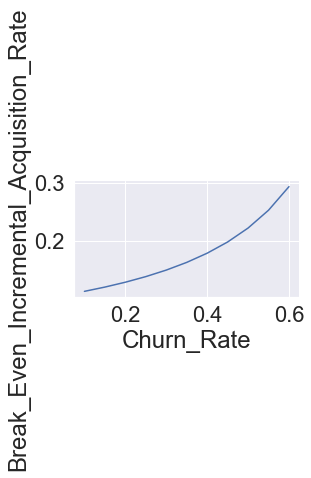

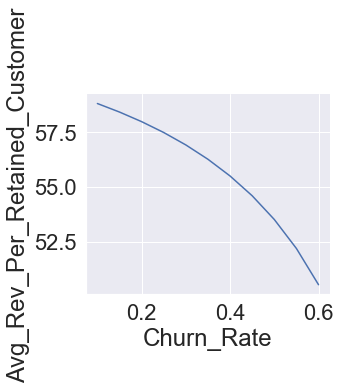

In [275]:
sns.relplot(data=Rate_Elasticity2, y='Break_Even_Incremental_Acquisition_Rate', x='Churn_Rate', kind='line')
sns.relplot(data=Rate_Elasticity2, y='Avg_Rev_Per_Retained_Customer', x='Churn_Rate', kind='line')

In [276]:
Rate_Elasticity2

,Churn_Rate,Churned,Churn_PCT_Revenue,Churn_Revenue,Avg_Rev_Per_Churn_Customer,Retained_Revenue,Retained_Customers,Avg_Rev_Per_Retained_Customer,Break_Even_Acquisitions,Break_Even_Acquisition_Rate,Break_Even_Incremental_Acquisition_Rate,Break_Even_Acq_Rate_PCT_Change,Churn_Rate_PCT_Change
2,0.10,333.30,0.110,21796.06330,65.394729,176349.96670,2999.70,58.789201,370.749438,0.111236,0.112360,NaN,NaN
3,0.15,499.95,0.165,32694.09495,65.394729,165451.93505,2833.05,58.400641,559.824251,0.167964,0.119760,0.509980,0.500000
4,0.20,666.60,0.220,43592.12660,65.394729,154553.90340,2666.40,57.963510,752.061538,0.225641,0.128205,0.343389,0.333333
5,0.25,833.25,0.275,54490.15825,65.394729,143655.87175,2499.75,57.468096,948.181034,0.284483,0.137931,0.260776,0.250000
6,0.30,999.90,0.330,65388.18990,65.394729,132757.84010,2333.10,56.901907,1149.138806,0.344776,0.149254,0.211940,0.200000
7,0.35,1166.55,0.385,76286.22155,65.394729,121859.80845,2166.45,56.248613,1356.232927,0.406911,0.162602,0.180217,0.166667
8,0.40,1333.20,0.440,87184.25320,65.394729,110961.77680,1999.80,55.486437,1571.271429,0.471429,0.178571,0.158556,0.142857
9,0.45,1499.85,0.495,98082.28485,65.394729,100063.74515,1833.15,54.585683,1796.850000,0.539109,0.198020,0.143564,0.125000
10,0.50,1666.50,0.550,108980.31650,65.394729,89165.71350,1666.50,53.504779,2036.833333,0.611111,0.222222,0.133558,0.111111
11,0.55,1833.15,0.605,119878.34815,65.394729,78267.68185,1499.85,52.183673,2297.238608,0.689241,0.253165,0.127848,0.100000


In [277]:
(40-30)/30
(0.471429-0.344776)/0.344776

0.36734865535884154

In [278]:
# non_churn_revenue = revenue - (

churn_rate * customers

3166.3500000000004

In [279]:
churn_stats = churn_data.groupby('Churn')[['Day_Mins', 'Eve_Mins', 'Night_Mins', 'Intl_Mins', 'Total_Mins']].agg(sum)

In [280]:
churn_stats = churn_stats.reset_index()

In [281]:
churn_stats

,Churn,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins
0,no,499250.9,567273.4,570379.6,28952.8,1665856.7
1,yes,99939.5,102594.1,99126.9,5168.1,306828.6


In [282]:
churn_stats['Day_Mins_to_Total'] = (churn_stats['Day_Mins']/churn_stats['Total_Mins'])*100
churn_stats['Eve_Mins_to_Total'] = churn_stats['Eve_Mins']/churn_stats['Total_Mins']*100
churn_stats['Night_Mins_to_Total'] = churn_stats['Night_Mins']/churn_stats['Total_Mins']*100
churn_stats['Intl_Mins_to_Total'] = churn_stats['Intl_Mins']/churn_stats['Total_Mins']*100

In [283]:
churn_stats

,Churn,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total
0,no,499250.9,567273.4,570379.6,28952.8,1665856.7,29.969619,34.052953,34.239416,1.738013
1,yes,99939.5,102594.1,99126.9,5168.1,306828.6,32.571768,33.436942,32.306930,1.684361


In [284]:
names = churn_stats.columns

for i in enumerate(names):
    print(i)

(0, 'Churn')
(1, 'Day_Mins')
(2, 'Eve_Mins')
(3, 'Night_Mins')
(4, 'Intl_Mins')
(5, 'Total_Mins')
(6, 'Day_Mins_to_Total')
(7, 'Eve_Mins_to_Total')
(8, 'Night_Mins_to_Total')
(9, 'Intl_Mins_to_Total')


In [285]:
names = names[6:]
names

Index(['Day_Mins_to_Total', 'Eve_Mins_to_Total', 'Night_Mins_to_Total',
       'Intl_Mins_to_Total'],
      dtype='object')

In [286]:
churn_stats = churn_stats[names]

In [287]:
churn_stats

,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total
0,29.969619,34.052953,34.239416,1.738013
1,32.571768,33.436942,32.306930,1.684361


In [288]:
non_churners_stats = [29.969619, 34.052953, 34.239416, 1.738013]
churner_stats = [32.571768, 33.436942, 32.306930, 1.684361]

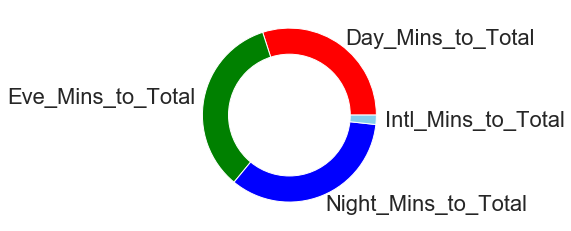

In [289]:
# library
import matplotlib.pyplot as plt

# create data
names = names
size1 = non_churners_stats
 
# Create a circle for the center of the plot
my_circle=plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size1, labels=names, colors=['red','green','blue','skyblue'])
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

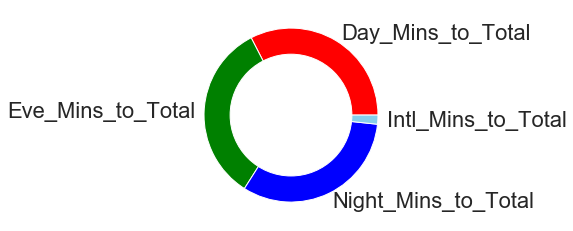

In [290]:
# library
import matplotlib.pyplot as plt

# create data
names = names
size2 = churner_stats
 
# Create a circle for the center of the plot
my_circle=plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size2, labels=names, colors=['red','green','blue','skyblue'])
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

In [291]:
churn_data2 = pd.merge(churn_data2, regions, how='left', on='State')

In [292]:
churn_data2

,Phone,Area_Code,State,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70,Care_Status,US_Region
0,382-4657,415,KS,no,no,yes,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.17,0.09,0.04,0.27,0.59,0.11,2.37,0.25,36.96,27.52,34.12,1.39,59.65,22.21,14.57,3.57,yes,low,Midwest
1,371-7191,415,OH,no,no,yes,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.17,0.09,0.05,0.27,0.55,0.09,1.88,0.18,25.85,31.27,40.69,2.19,46.37,28.06,19.33,6.25,no,low,Midwest
2,358-1921,415,NJ,no,no,no,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.17,0.08,0.05,0.27,0.45,0.12,1.62,0.19,45.12,22.47,30.14,2.26,66.43,16.54,11.75,5.28,no,none,Northeast
3,375-9999,408,OH,no,yes,no,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.17,0.08,0.04,0.27,0.80,0.12,2.21,0.26,53.01,10.96,34.86,1.17,76.20,7.87,13.26,2.66,no,high,Midwest
4,330-6626,415,OK,no,yes,no,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.17,0.09,0.04,0.27,0.69,0.10,1.43,0.15,32.56,28.96,36.50,1.97,54.41,24.21,16.15,5.24,no,critical,South
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,414-4276,415,AZ,no,no,yes,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.17,0.09,0.05,0.27,0.31,0.09,2.26,0.21,23.64,32.62,42.24,1.50,44.18,30.48,20.90,4.44,no,high,West
3329,370-3271,415,WV,no,no,no,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.17,0.09,0.05,0.27,0.93,0.11,2.45,0.27,39.48,26.20,32.68,1.64,61.84,20.53,13.55,4.08,no,critical,South
3330,328-8230,510,RI,no,no,no,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,0.17,0.09,0.05,0.27,2.42,0.10,2.56,0.26,26.76,42.75,28.40,2.09,45.38,36.24,12.75,5.62,no,high,Northeast
3331,364-6381,510,CT,no,yes,no,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.17,0.09,0.04,0.27,0.31,0.11,1.54,0.17,41.31,30.83,26.89,0.97,63.18,23.59,10.88,2.35,no,high,Northeast


In [293]:
churners = churn_data2[churn_data2['Churn']=='yes'] 

In [294]:
churners

,Phone,Area_Code,State,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70,Care_Status,US_Region
10,329-6603,415,IN,yes,no,no,4,0,65,129.1,228.5,208.8,12.7,579.1,137,83,111,6,21.95,19.42,9.40,3.43,337,54.20,0.17,0.08,0.05,0.27,0.83,0.09,1.72,0.16,22.29,39.46,36.06,2.19,40.50,35.83,17.34,6.33,no,critical,Midwest
15,351-7269,415,NY,yes,no,no,4,0,161,332.9,317.8,160.6,5.4,816.7,67,97,128,9,56.59,27.01,7.23,1.46,301,92.29,0.17,0.08,0.05,0.27,0.57,0.11,2.71,0.31,40.76,38.91,19.66,0.66,61.32,29.27,7.83,1.58,yes,critical,Northeast
21,393-7984,408,CO,yes,no,no,5,0,77,62.4,169.9,209.6,5.7,447.6,89,121,64,6,10.61,14.44,9.43,1.54,280,36.02,0.17,0.08,0.04,0.27,0.47,0.08,1.60,0.13,13.94,37.96,46.83,1.27,29.46,40.09,26.18,4.28,no,critical,West
33,360-1596,408,AZ,yes,no,no,1,0,12,249.6,252.4,280.2,11.8,794.0,118,119,90,3,42.43,21.45,12.61,3.19,330,79.68,0.17,0.08,0.05,0.27,6.64,0.10,2.41,0.24,31.44,31.79,35.29,1.49,53.25,26.92,15.83,4.00,yes,low,West
41,383-6029,408,MD,yes,yes,yes,0,41,135,173.1,203.9,122.2,14.6,513.8,85,107,78,15,29.43,17.33,5.50,3.94,285,56.20,0.17,0.08,0.05,0.27,0.42,0.11,1.80,0.20,33.69,39.68,23.78,2.84,52.37,30.84,9.79,7.01,no,none,Northeast
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3301,417-1488,415,CA,yes,no,no,0,0,84,280.0,202.2,156.8,10.4,649.4,113,90,103,4,47.60,17.19,7.06,2.81,310,74.66,0.17,0.09,0.05,0.27,0.89,0.11,2.09,0.24,43.12,31.14,24.15,1.60,63.76,23.02,9.46,3.76,yes,none,West
3304,330-7137,510,IL,yes,yes,no,4,0,71,186.1,198.6,206.5,13.8,605.0,114,140,80,5,31.64,16.88,9.29,3.73,339,61.54,0.17,0.08,0.04,0.27,0.87,0.10,1.78,0.18,30.76,32.83,34.13,2.28,51.41,27.43,15.10,6.06,no,critical,Midwest
3320,411-5677,510,GA,yes,yes,no,4,0,122,140.0,196.4,120.1,9.7,466.2,101,77,133,4,23.80,16.69,5.40,2.62,315,48.51,0.17,0.08,0.04,0.27,0.40,0.10,1.48,0.15,30.03,42.13,25.76,2.08,49.06,34.41,11.13,5.40,no,critical,South
3322,409-1856,408,MD,yes,no,no,4,0,62,321.1,265.5,180.5,11.5,778.6,105,122,72,2,54.59,22.57,8.12,3.11,301,88.39,0.17,0.09,0.04,0.27,1.43,0.11,2.59,0.29,41.24,34.10,23.18,1.48,61.76,25.53,9.19,3.52,yes,critical,Northeast


In [295]:
churner_cols = churners.columns
churner_cols

Index(['Phone', 'Area_Code', 'State', 'Churn', 'Intl_Plan', 'Vmail_Plan',
       'CustServ_Calls', 'Vmail_Message', 'Account_Length', 'Day_Mins',
       'Eve_Mins', 'Night_Mins', 'Intl_Mins', 'Total_Mins', 'Day_Calls',
       'Eve_Calls', 'Night_Calls', 'Intl_Calls', 'Day_Charge', 'Eve_Charge',
       'Night_Charge', 'Intl_Charge', 'Total_Calls', 'Total_Charge',
       'Cost_Per_Day_Minute', 'Cost_Per_Eve_Minute', 'Cost_Per_Night_Minute',
       'Cost_Per_Intl_Minute', 'Avg_Daily_Charge', 'Avg_Cost_Per_Minute',
       'Avg_Minutes_Per_Call', 'Avg_Cost_Per_Call', 'Day_Mins_to_Total',
       'Eve_Mins_to_Total', 'Night_Mins_to_Total', 'Intl_Mins_to_Total',
       'Day_Charge_to_Total', 'Eve_Charge_to_Total', 'Night_Charge_to_Total',
       'Intl_Charge_to_Total', 'Total_Charge_Over_70', 'Care_Status',
       'US_Region'],
      dtype='object')

In [296]:
churner_cols = ['Intl_Plan', 'Vmail_Plan','Care_Status', 'Total_Charge_Over_70', 'US_Region']

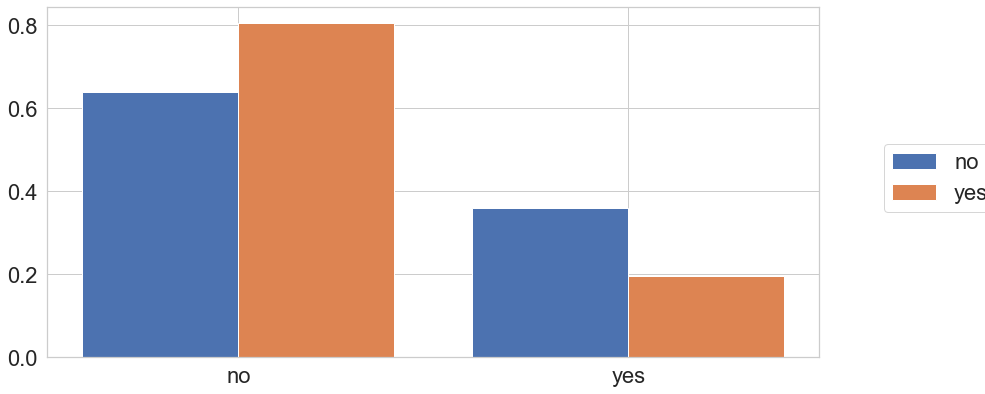

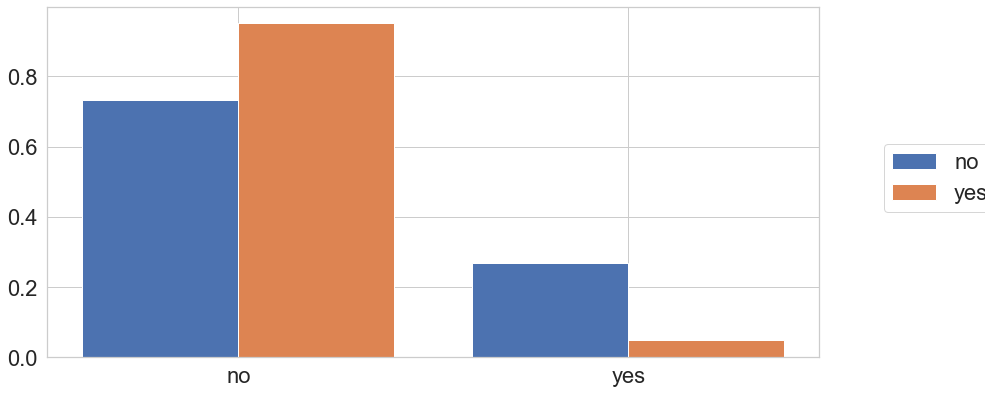

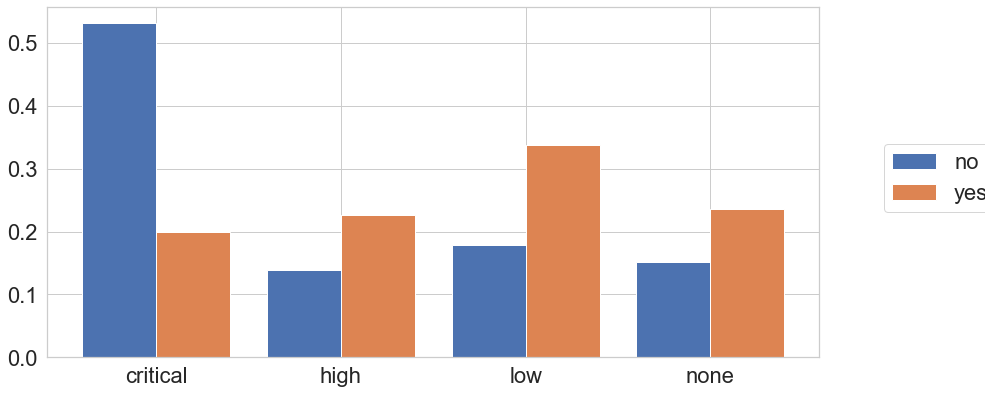

ValueError: The column Total_Charge_Over_70 was already used for parameter agg.

In [297]:
sns.set_style('whitegrid')
# dxp.aggplot(data=churn_data, agg='Vmail_Plan', hue='Churn', normalize='Churn')

for i in range(5):
    dxp.aggplot(data=churners, agg=churner_cols[i], hue='Total_Charge_Over_70', normalize='Total_Charge_Over_70')
    plt.show()

In [298]:
churner_quant_cols =  ['CustServ_Calls', 'Vmail_Message', 'Account_Length', 'Day_Mins',
                        'Eve_Mins', 'Night_Mins', 'Intl_Mins', 'Total_Mins', 'Day_Calls',
                       'Eve_Calls', 'Night_Calls', 'Intl_Calls', 'Day_Charge', 'Eve_Charge',
                       'Night_Charge', 'Intl_Charge', 'Total_Calls', 'Total_Charge',
                       'Cost_Per_Day_Minute', 'Cost_Per_Eve_Minute', 'Cost_Per_Night_Minute',
                       'Cost_Per_Intl_Minute', 'Avg_Daily_Charge', 'Avg_Cost_Per_Minute',
                       'Avg_Minutes_Per_Call', 'Avg_Cost_Per_Call', 'Day_Mins_to_Total',
                       'Eve_Mins_to_Total', 'Night_Mins_to_Total', 'Intl_Mins_to_Total',
                       'Day_Charge_to_Total', 'Eve_Charge_to_Total', 'Night_Charge_to_Total',
                       'Intl_Charge_to_Total']
print(len(churner_quant_cols))

34


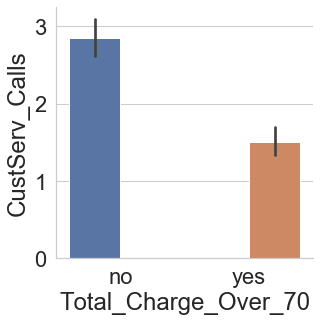

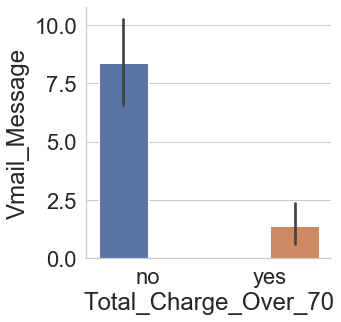

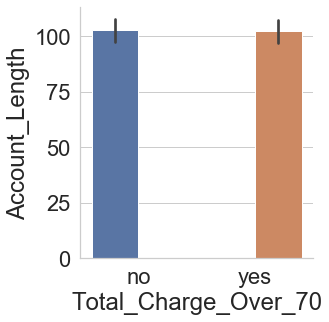

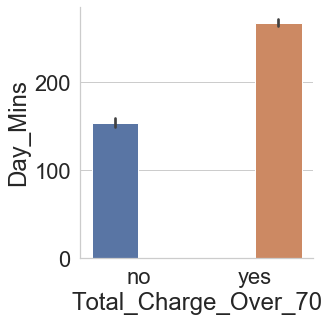

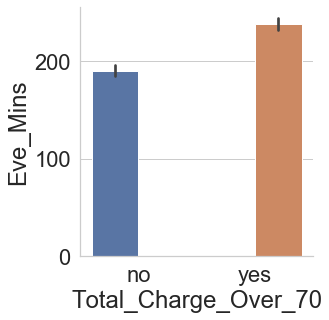

...

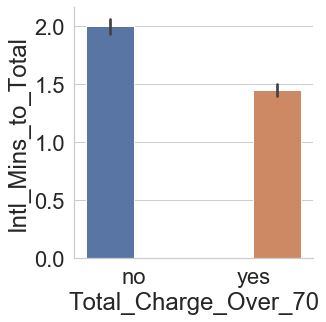

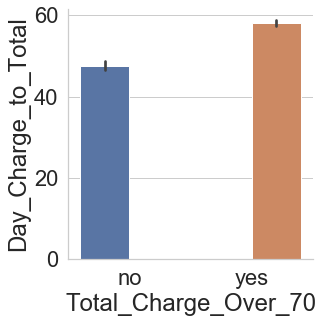

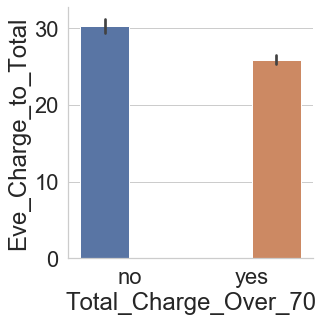

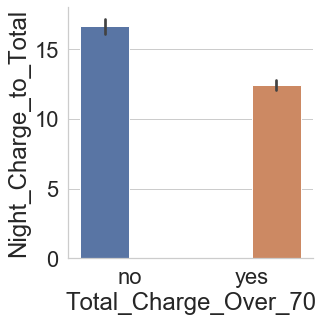

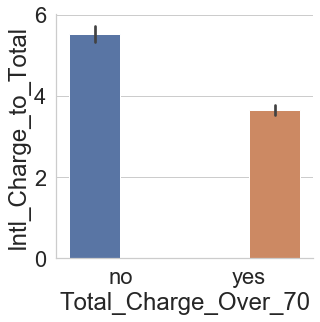

IndexError: list index out of range

In [299]:
for i in range(35):   
    f = sns.factorplot(data=churners, x='Total_Charge_Over_70', y=churner_quant_cols[i], hue='Total_Charge_Over_70', kind='bar')
    plt.show()

In [302]:
churner_metrics2 = churn_data2.iloc[:, 3:-1]

In [303]:
churner_metrics2

,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70,Care_Status
0,no,no,yes,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.17,0.09,0.04,0.27,0.59,0.11,2.37,0.25,36.96,27.52,34.12,1.39,59.65,22.21,14.57,3.57,yes,low
1,no,no,yes,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.17,0.09,0.05,0.27,0.55,0.09,1.88,0.18,25.85,31.27,40.69,2.19,46.37,28.06,19.33,6.25,no,low
2,no,no,no,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.17,0.08,0.05,0.27,0.45,0.12,1.62,0.19,45.12,22.47,30.14,2.26,66.43,16.54,11.75,5.28,no,none
3,no,yes,no,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.17,0.08,0.04,0.27,0.80,0.12,2.21,0.26,53.01,10.96,34.86,1.17,76.20,7.87,13.26,2.66,no,high
4,no,yes,no,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.17,0.09,0.04,0.27,0.69,0.10,1.43,0.15,32.56,28.96,36.50,1.97,54.41,24.21,16.15,5.24,no,critical
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,no,no,yes,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.17,0.09,0.05,0.27,0.31,0.09,2.26,0.21,23.64,32.62,42.24,1.50,44.18,30.48,20.90,4.44,no,high
3329,no,no,no,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.17,0.09,0.05,0.27,0.93,0.11,2.45,0.27,39.48,26.20,32.68,1.64,61.84,20.53,13.55,4.08,no,critical
3330,no,no,no,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,0.17,0.09,0.05,0.27,2.42,0.10,2.56,0.26,26.76,42.75,28.40,2.09,45.38,36.24,12.75,5.62,no,high
3331,no,yes,no,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.17,0.09,0.04,0.27,0.31,0.11,1.54,0.17,41.31,30.83,26.89,0.97,63.18,23.59,10.88,2.35,no,high


In [304]:
churner_metrics2['Churn'] = churner_metrics2['Churn'].replace({'no':0, 'yes':1})
churner_metrics2['Intl_Plan'] = churner_metrics2['Intl_Plan'].replace({'no':0, 'yes':1})
churner_metrics2['Vmail_Plan'] = churner_metrics2['Vmail_Plan'].replace({'no':0, 'yes':1})
churner_metrics2['Total_Charge_Over_70'] = churner_metrics2['Total_Charge_Over_70'].replace({'no':0, 'yes':1})
churner_metrics2

,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70,Care_Status
0,0,0,1,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.17,0.09,0.04,0.27,0.59,0.11,2.37,0.25,36.96,27.52,34.12,1.39,59.65,22.21,14.57,3.57,1,low
1,0,0,1,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.17,0.09,0.05,0.27,0.55,0.09,1.88,0.18,25.85,31.27,40.69,2.19,46.37,28.06,19.33,6.25,0,low
2,0,0,0,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.17,0.08,0.05,0.27,0.45,0.12,1.62,0.19,45.12,22.47,30.14,2.26,66.43,16.54,11.75,5.28,0,none
3,0,1,0,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.17,0.08,0.04,0.27,0.80,0.12,2.21,0.26,53.01,10.96,34.86,1.17,76.20,7.87,13.26,2.66,0,high
4,0,1,0,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.17,0.09,0.04,0.27,0.69,0.10,1.43,0.15,32.56,28.96,36.50,1.97,54.41,24.21,16.15,5.24,0,critical
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,0,0,1,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.17,0.09,0.05,0.27,0.31,0.09,2.26,0.21,23.64,32.62,42.24,1.50,44.18,30.48,20.90,4.44,0,high
3329,0,0,0,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.17,0.09,0.05,0.27,0.93,0.11,2.45,0.27,39.48,26.20,32.68,1.64,61.84,20.53,13.55,4.08,0,critical
3330,0,0,0,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,0.17,0.09,0.05,0.27,2.42,0.10,2.56,0.26,26.76,42.75,28.40,2.09,45.38,36.24,12.75,5.62,0,high
3331,0,1,0,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.17,0.09,0.04,0.27,0.31,0.11,1.54,0.17,41.31,30.83,26.89,0.97,63.18,23.59,10.88,2.35,0,high


In [305]:
corr_matrix = churner_metrics2.corr()
corr_matrix = corr_matrix.round(4)
corr_matrix

,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70
Churn,1.0000,0.2599,-0.1021,0.2087,-0.0897,0.0165,0.2052,0.0928,0.0355,0.0682,0.1986,0.0185,0.0092,0.0061,-0.0528,0.2052,0.0928,0.0355,0.0683,0.0158,0.2315,-0.0,-0.0175,0.0042,0.0,0.0030,0.0972,0.1446,0.1814,0.0956,-0.0237,-0.0742,-0.0222,0.0864,-0.0516,-0.0827,-0.0400,0.3472
Intl_Plan,0.2599,1.0000,0.0060,-0.0245,0.0087,0.0247,0.0494,0.0191,-0.0289,0.0459,0.0259,0.0038,0.0061,0.0125,0.0174,0.0494,0.0191,-0.0289,0.0458,0.0140,0.0484,-0.0,0.0061,-0.0193,-0.0,-0.0058,0.0634,0.0127,0.0336,0.0422,0.0052,-0.0510,0.0232,0.0332,-0.0124,-0.0525,0.0081,0.0554
Vmail_Plan,-0.1021,0.0060,1.0000,-0.0178,0.9569,0.0029,-0.0017,0.0215,0.0061,-0.0013,0.0145,-0.0111,-0.0064,0.0156,0.0076,-0.0017,0.0216,0.0061,-0.0013,-0.0008,0.0086,-0.0,0.0161,-0.0259,-0.0,0.0102,-0.0035,0.0111,0.0087,-0.0077,0.0149,-0.0063,-0.0091,-0.0077,0.0133,-0.0019,-0.0109,0.0225
CustServ_Calls,0.2087,-0.0245,-0.0178,1.0000,-0.0133,-0.0038,-0.0134,-0.0130,-0.0093,-0.0096,-0.0210,-0.0189,0.0024,-0.0128,-0.0176,-0.0134,-0.0130,-0.0093,-0.0097,-0.0182,-0.0199,0.0,-0.0044,-0.0048,-0.0,-0.0053,-0.0145,-0.0085,-0.0106,-0.0066,0.0014,0.0056,-0.0000,-0.0045,0.0017,0.0060,0.0019,-0.0010
Vmail_Message,-0.0897,0.0087,0.9569,-0.0133,1.0000,-0.0046,0.0008,0.0176,0.0077,0.0029,0.0148,-0.0095,-0.0059,0.0071,0.0140,0.0008,0.0176,0.0077,0.0029,-0.0039,0.0098,0.0,0.0192,-0.0289,-0.0,0.0088,-0.0006,0.0131,0.0110,-0.0048,0.0086,-0.0032,-0.0048,-0.0051,0.0075,0.0007,-0.0066,0.0193
Account_Length,0.0165,0.0247,0.0029,-0.0038,-0.0046,1.0000,0.0062,-0.0068,-0.0090,0.0095,-0.0048,0.0385,0.0193,-0.0132,0.0207,0.0062,-0.0067,-0.0090,0.0095,0.0275,0.0015,0.0,0.0111,-0.0003,0.0,-0.2969,0.0226,-0.0218,-0.0156,0.0116,-0.0075,-0.0053,0.0095,0.0088,-0.0085,-0.0069,0.0067,-0.0041
Day_Mins,0.2052,0.0494,-0.0017,-0.0134,0.0008,0.0062,1.0000,0.0070,0.0043,-0.0102,0.6116,0.0068,0.0158,0.0230,0.0080,1.0000,0.0070,0.0043,-0.0101,0.0267,0.8848,0.0,0.0013,-0.0161,-0.0,0.0301,0.7398,0.4692,0.7227,0.8586,-0.4314,-0.4380,-0.3154,0.8644,-0.6434,-0.5753,-0.5141,0.5918
Eve_Mins,0.0928,0.0191,0.0215,-0.0130,0.0176,-0.0068,0.0070,1.0000,-0.0126,-0.0110,0.5606,-0.0215,-0.0114,0.0076,0.0025,0.0070,1.0000,-0.0126,-0.0111,-0.0146,0.4131,-0.0,0.0137,-0.0066,0.0,0.0181,-0.1411,0.4530,0.3520,-0.3352,0.7889,-0.4188,-0.2910,-0.3846,0.7136,-0.2816,-0.2447,0.2614
Night_Mins,0.0355,-0.0289,0.0061,-0.0093,0.0077,-0.0090,0.0043,-0.0126,1.0000,-0.0152,0.5573,0.0229,-0.0021,0.0112,-0.0124,0.0043,-0.0126,1.0000,-0.0152,0.0176,0.2143,0.0,-0.0115,0.0014,-0.0,0.0045,-0.5321,0.4329,0.1699,-0.3348,-0.4106,0.7824,-0.2912,-0.1941,-0.1689,0.7364,-0.1351,0.1409
Intl_Mins,0.0682,0.0459,-0.0013,-0.0096,0.0029,0.0095,-0.0102,-0.0110,-0.0152,1.0000,0.0101,0.0216,0.0087,-0.0136,0.0323,-0.0102,-0.0110,-0.0152,1.0000,0.0122,0.0550,-0.0,-0.0131,-0.0043,0.0,-0.0331,0.0994,0.0023,0.0397,-0.0188,-0.0190,-0.0262,0.8459,-0.0695,-0.0511,-0.0504,0.7891,0.0188


In [306]:
corr_matrix = corr_matrix.sort_values('Churn', ascending=True)

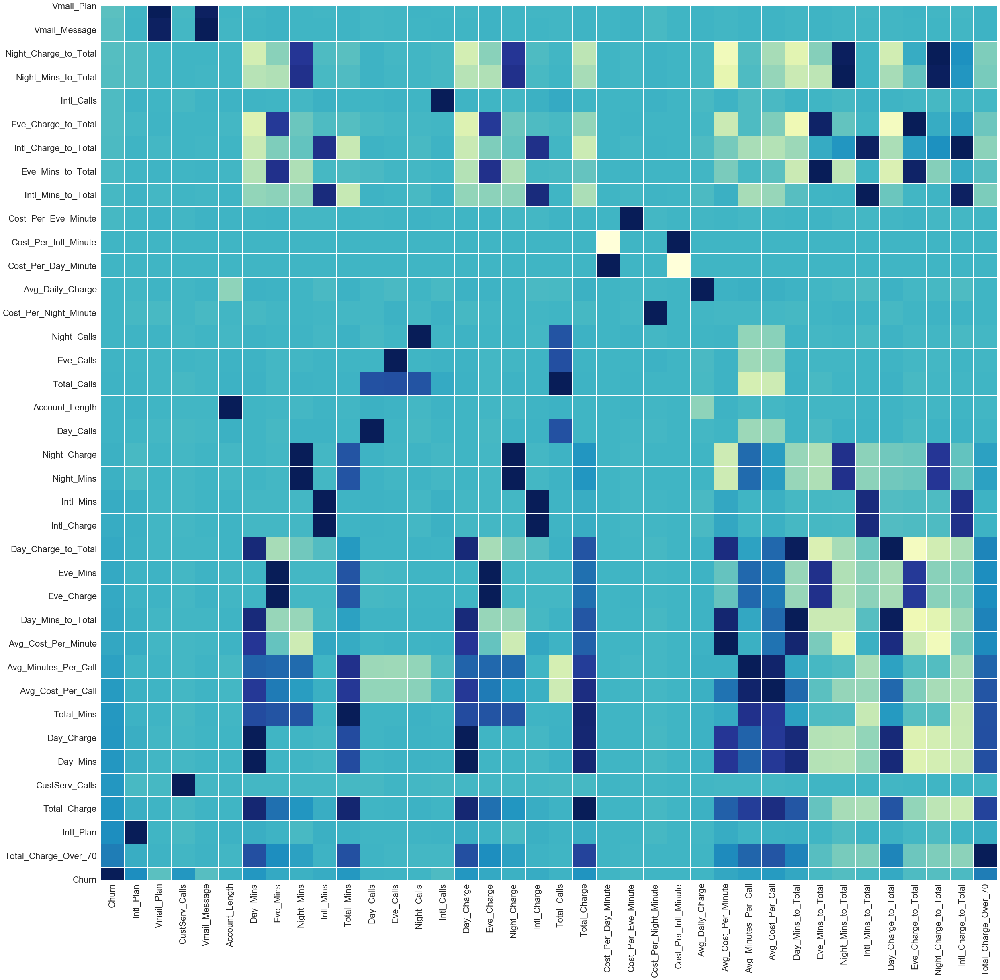

In [307]:
plt.subplots(figsize=(40, 40))
sns.set(font_scale=2)
sns.heatmap(corr_matrix, cmap='YlGnBu', cbar=False, linewidths=.5)


In [308]:
churners2 = churner_metrics2[churner_metrics2['Churn']!=0] 

In [309]:
churner_corr_matrix = churners2.corr()
churner_corr_matrix = churner_corr_matrix.round(4)
churner_corr_matrix = churner_corr_matrix.iloc[1:, 1:]
churner_corr_matrix

,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70
Intl_Plan,1.0000,0.1644,-0.2121,0.1435,0.0358,-0.1213,-0.0378,-0.1415,0.2441,-0.1473,-0.0746,-0.0354,0.0176,-0.0548,-0.1213,-0.0378,-0.1416,0.2437,-0.0595,-0.1228,0.0,0.0543,-0.0492,-0.0,-0.0239,0.0204,-0.0938,-0.0799,-0.0509,0.0850,-0.0466,0.2646,-0.0699,0.0642,-0.0402,0.2366,-0.1825
Vmail_Plan,0.1644,1.0000,0.0861,0.9692,0.0231,-0.1960,-0.0843,-0.1136,0.0711,-0.2081,-0.0020,0.0091,0.0347,0.0828,-0.1960,-0.0843,-0.1137,0.0710,0.0295,-0.2058,-0.0,0.0510,-0.0882,0.0,-0.0497,-0.0617,-0.1999,-0.2008,-0.1060,0.0813,0.0256,0.1579,-0.1053,0.0883,0.0305,0.1529,-0.2933
CustServ_Calls,-0.2121,0.0861,1.0000,0.0775,-0.0088,-0.4197,-0.2311,-0.0938,-0.0962,-0.4118,-0.0039,-0.0062,-0.0264,-0.0668,-0.4197,-0.2311,-0.0938,-0.0963,-0.0256,-0.4473,-0.0,0.0046,-0.0344,0.0,0.0191,-0.3192,-0.3452,-0.3968,-0.3132,0.0792,0.2544,0.1571,-0.2964,0.1727,0.2869,0.2229,-0.3625
Vmail_Message,0.1435,0.9692,0.0775,1.0000,0.0198,-0.1915,-0.0898,-0.1086,0.0636,-0.2059,-0.0038,0.0046,0.0165,0.0752,-0.1915,-0.0898,-0.1087,0.0636,0.0150,-0.2033,-0.0,0.0654,-0.0905,0.0,-0.0475,-0.0654,-0.1914,-0.1928,-0.1017,0.0706,0.0316,0.1533,-0.1003,0.0796,0.0353,0.1483,-0.2925
Account_Length,0.0358,0.0231,-0.0088,0.0198,1.0000,0.0002,-0.0142,-0.0873,-0.0262,-0.0443,0.0183,0.0430,-0.0406,0.0148,0.0002,-0.0142,-0.0873,-0.0263,0.0134,-0.0191,0.0,-0.0394,-0.0014,-0.0,-0.3151,0.0559,-0.0472,-0.0226,0.0375,0.0179,-0.0588,0.0094,0.0332,-0.0045,-0.0649,-0.0021,-0.0086
Day_Mins,-0.1213,-0.1960,-0.4197,-0.1915,0.0002,1.0000,0.2382,0.1343,-0.0162,0.7912,0.0618,-0.0026,0.0428,0.1323,1.0000,0.2382,0.1343,-0.0157,0.0702,0.9398,-0.0,-0.0307,0.0425,0.0,0.0353,0.7651,0.6442,0.8134,0.8809,-0.4120,-0.5335,-0.4600,0.8746,-0.6366,-0.6509,-0.6324,0.8262
Eve_Mins,-0.0378,-0.0843,-0.2311,-0.0898,-0.0142,0.2382,1.0000,0.0105,-0.0190,0.6196,0.0743,0.0429,0.0725,-0.0009,0.2382,1.0000,0.0104,-0.0192,0.1105,0.5184,-0.0,-0.0540,-0.0531,0.0,-0.0504,0.0443,0.4695,0.4154,-0.0948,0.6862,-0.5214,-0.3635,-0.1470,0.5422,-0.4149,-0.3630,0.4591
Night_Mins,-0.1415,-0.1136,-0.0938,-0.1086,-0.0873,0.1343,0.0105,1.0000,-0.0694,0.5125,0.0292,-0.0204,0.0028,-0.0041,0.1343,0.0105,1.0000,-0.0693,0.0077,0.2658,-0.0,-0.0314,0.0094,0.0,-0.0178,-0.3924,0.4328,0.2357,-0.1775,-0.4481,0.6483,-0.3353,-0.0483,-0.2376,0.5734,-0.2206,0.2133
Intl_Mins,0.2441,0.0711,-0.0962,0.0636,-0.0262,-0.0162,-0.0190,-0.0694,1.0000,-0.0233,-0.0033,-0.0246,0.0988,0.0882,-0.0162,-0.0190,-0.0694,1.0000,0.0466,0.0240,-0.0,0.0181,-0.0190,0.0,-0.0103,0.1151,-0.0484,-0.0050,0.0010,-0.0056,-0.0603,0.8038,-0.0427,-0.0561,-0.0853,0.7088,-0.0550
Total_Mins,-0.1473,-0.2081,-0.4118,-0.2059,-0.0443,0.7912,0.6196,0.5125,-0.0233,1.0000,0.0856,0.0091,0.0642,0.0825,0.7912,0.6196,0.5125,-0.0230,0.0998,0.9416,0.0,-0.0573,0.0052,-0.0,-0.0094,0.3333,0.8037,0.8011,0.4290,-0.1270,-0.3016,-0.5789,0.4547,-0.2459,-0.3575,-0.6396,0.8187


In [310]:
churner_corr_matrix = churner_corr_matrix.sort_values('Total_Charge_Over_70', ascending=True)

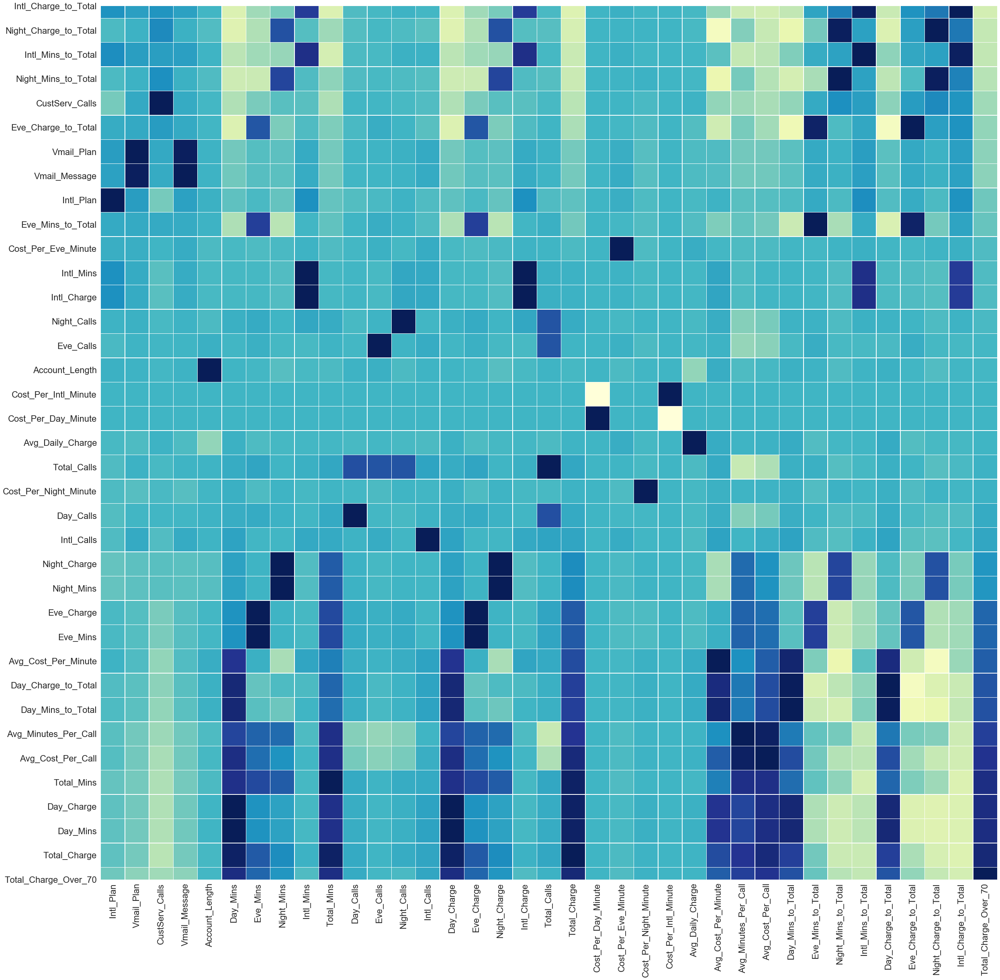

In [311]:
plt.subplots(figsize=(40, 40))
sns.set(font_scale=2)
sns.heatmap(churner_corr_matrix, cmap='YlGnBu', cbar=False, linewidths=.5)

In [312]:
churners2

,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70,Care_Status
10,1,0,0,4,0,65,129.1,228.5,208.8,12.7,579.1,137,83,111,6,21.95,19.42,9.40,3.43,337,54.20,0.17,0.08,0.05,0.27,0.83,0.09,1.72,0.16,22.29,39.46,36.06,2.19,40.50,35.83,17.34,6.33,0,critical
15,1,0,0,4,0,161,332.9,317.8,160.6,5.4,816.7,67,97,128,9,56.59,27.01,7.23,1.46,301,92.29,0.17,0.08,0.05,0.27,0.57,0.11,2.71,0.31,40.76,38.91,19.66,0.66,61.32,29.27,7.83,1.58,1,critical
21,1,0,0,5,0,77,62.4,169.9,209.6,5.7,447.6,89,121,64,6,10.61,14.44,9.43,1.54,280,36.02,0.17,0.08,0.04,0.27,0.47,0.08,1.60,0.13,13.94,37.96,46.83,1.27,29.46,40.09,26.18,4.28,0,critical
33,1,0,0,1,0,12,249.6,252.4,280.2,11.8,794.0,118,119,90,3,42.43,21.45,12.61,3.19,330,79.68,0.17,0.08,0.05,0.27,6.64,0.10,2.41,0.24,31.44,31.79,35.29,1.49,53.25,26.92,15.83,4.00,1,low
41,1,1,1,0,41,135,173.1,203.9,122.2,14.6,513.8,85,107,78,15,29.43,17.33,5.50,3.94,285,56.20,0.17,0.08,0.05,0.27,0.42,0.11,1.80,0.20,33.69,39.68,23.78,2.84,52.37,30.84,9.79,7.01,0,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3301,1,0,0,0,0,84,280.0,202.2,156.8,10.4,649.4,113,90,103,4,47.60,17.19,7.06,2.81,310,74.66,0.17,0.09,0.05,0.27,0.89,0.11,2.09,0.24,43.12,31.14,24.15,1.60,63.76,23.02,9.46,3.76,1,none
3304,1,1,0,4,0,71,186.1,198.6,206.5,13.8,605.0,114,140,80,5,31.64,16.88,9.29,3.73,339,61.54,0.17,0.08,0.04,0.27,0.87,0.10,1.78,0.18,30.76,32.83,34.13,2.28,51.41,27.43,15.10,6.06,0,critical
3320,1,1,0,4,0,122,140.0,196.4,120.1,9.7,466.2,101,77,133,4,23.80,16.69,5.40,2.62,315,48.51,0.17,0.08,0.04,0.27,0.40,0.10,1.48,0.15,30.03,42.13,25.76,2.08,49.06,34.41,11.13,5.40,0,critical
3322,1,0,0,4,0,62,321.1,265.5,180.5,11.5,778.6,105,122,72,2,54.59,22.57,8.12,3.11,301,88.39,0.17,0.09,0.04,0.27,1.43,0.11,2.59,0.29,41.24,34.10,23.18,1.48,61.76,25.53,9.19,3.52,1,critical


In [313]:
churner_segs = churners2.iloc[:, 1:]
churner_segs['US_Region'] = churners['US_Region']

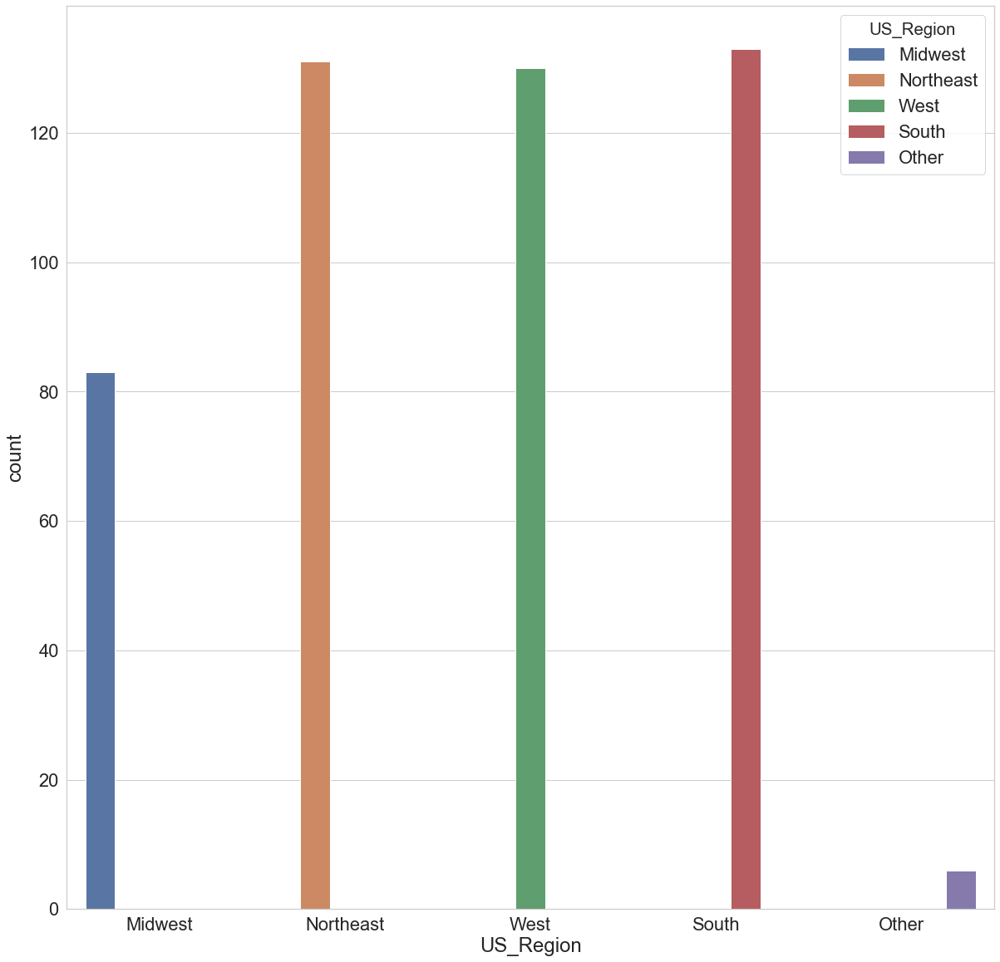

In [314]:
sns.set_style('whitegrid')
plt.subplots(figsize=(20, 20))
sns.countplot(data=churners, x='US_Region', hue='US_Region')

In [315]:
churner_segs = pd.get_dummies(churner_segs)
churner_segs = churner_segs.drop(columns=['Cost_Per_Day_Minute','Cost_Per_Eve_Minute','Cost_Per_Night_Minute','Cost_Per_Intl_Minute'])
churner_segs

,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70,Care_Status_critical,Care_Status_high,Care_Status_low,Care_Status_none,US_Region_Midwest,US_Region_Northeast,US_Region_Other,US_Region_South,US_Region_West
10,0,0,4,0,65,129.1,228.5,208.8,12.7,579.1,137,83,111,6,21.95,19.42,9.40,3.43,337,54.20,0.83,0.09,1.72,0.16,22.29,39.46,36.06,2.19,40.50,35.83,17.34,6.33,0,1,0,0,0,1,0,0,0,0
15,0,0,4,0,161,332.9,317.8,160.6,5.4,816.7,67,97,128,9,56.59,27.01,7.23,1.46,301,92.29,0.57,0.11,2.71,0.31,40.76,38.91,19.66,0.66,61.32,29.27,7.83,1.58,1,1,0,0,0,0,1,0,0,0
21,0,0,5,0,77,62.4,169.9,209.6,5.7,447.6,89,121,64,6,10.61,14.44,9.43,1.54,280,36.02,0.47,0.08,1.60,0.13,13.94,37.96,46.83,1.27,29.46,40.09,26.18,4.28,0,1,0,0,0,0,0,0,0,1
33,0,0,1,0,12,249.6,252.4,280.2,11.8,794.0,118,119,90,3,42.43,21.45,12.61,3.19,330,79.68,6.64,0.10,2.41,0.24,31.44,31.79,35.29,1.49,53.25,26.92,15.83,4.00,1,0,0,1,0,0,0,0,0,1
41,1,1,0,41,135,173.1,203.9,122.2,14.6,513.8,85,107,78,15,29.43,17.33,5.50,3.94,285,56.20,0.42,0.11,1.80,0.20,33.69,39.68,23.78,2.84,52.37,30.84,9.79,7.01,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3301,0,0,0,0,84,280.0,202.2,156.8,10.4,649.4,113,90,103,4,47.60,17.19,7.06,2.81,310,74.66,0.89,0.11,2.09,0.24,43.12,31.14,24.15,1.60,63.76,23.02,9.46,3.76,1,0,0,0,1,0,0,0,0,1
3304,1,0,4,0,71,186.1,198.6,206.5,13.8,605.0,114,140,80,5,31.64,16.88,9.29,3.73,339,61.54,0.87,0.10,1.78,0.18,30.76,32.83,34.13,2.28,51.41,27.43,15.10,6.06,0,1,0,0,0,1,0,0,0,0
3320,1,0,4,0,122,140.0,196.4,120.1,9.7,466.2,101,77,133,4,23.80,16.69,5.40,2.62,315,48.51,0.40,0.10,1.48,0.15,30.03,42.13,25.76,2.08,49.06,34.41,11.13,5.40,0,1,0,0,0,0,0,0,1,0
3322,0,0,4,0,62,321.1,265.5,180.5,11.5,778.6,105,122,72,2,54.59,22.57,8.12,3.11,301,88.39,1.43,0.11,2.59,0.29,41.24,34.10,23.18,1.48,61.76,25.53,9.19,3.52,1,1,0,0,0,0,1,0,0,0


In [316]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans

In [317]:
mms = MinMaxScaler()
mms.fit(churner_segs)
data_transformed = mms.transform(churner_segs)

In [318]:
Sum_of_squared_distances = []
K = range(1,30)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)

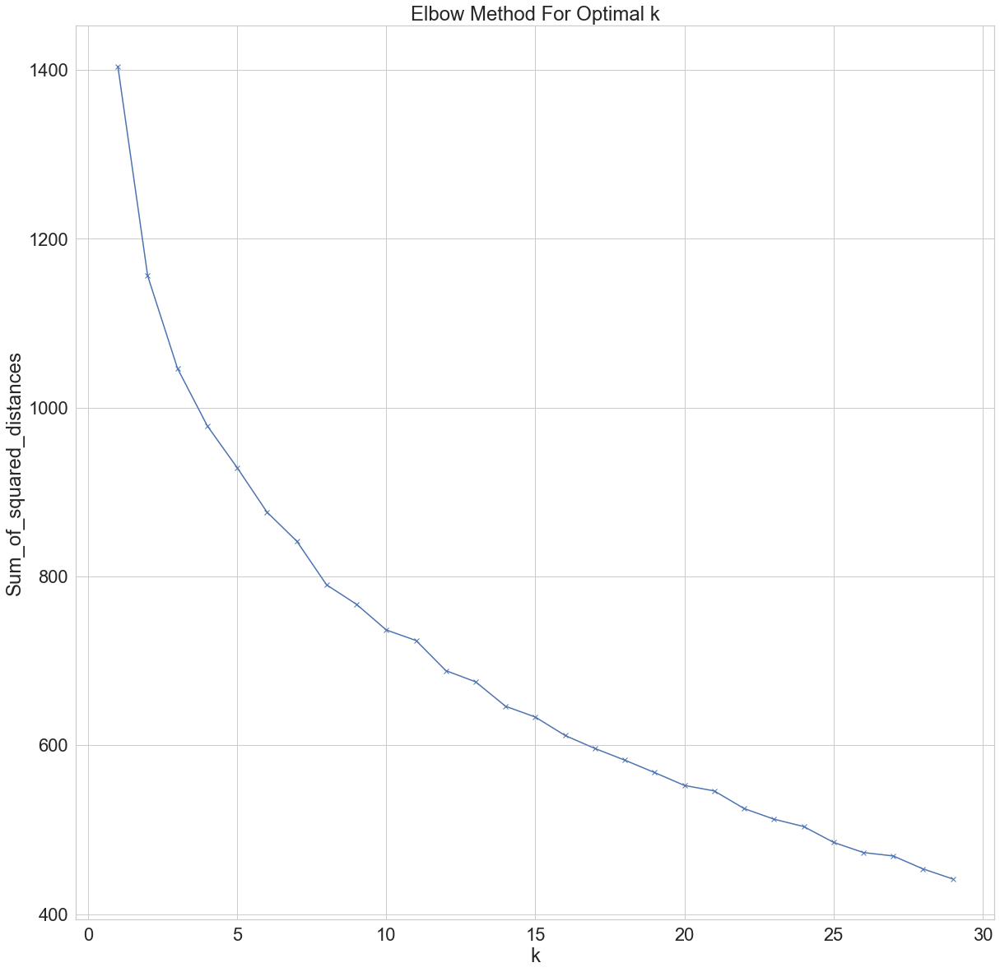

In [319]:
plt.subplots(figsize=(20, 20))
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [320]:
churner_segs.shape

(483, 42)

In [321]:
kmeans = KMeans()
kmeans.set_params(n_clusters=2)
kmeans.fit(churner_segs)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [322]:
cluster_assignment = kmeans.labels_

In [323]:
churners['Cluster'] = cluster_assignment

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [324]:
churners.columns

Index(['Phone', 'Area_Code', 'State', 'Churn', 'Intl_Plan', 'Vmail_Plan',
       'CustServ_Calls', 'Vmail_Message', 'Account_Length', 'Day_Mins',
       'Eve_Mins', 'Night_Mins', 'Intl_Mins', 'Total_Mins', 'Day_Calls',
       'Eve_Calls', 'Night_Calls', 'Intl_Calls', 'Day_Charge', 'Eve_Charge',
       'Night_Charge', 'Intl_Charge', 'Total_Calls', 'Total_Charge',
       'Cost_Per_Day_Minute', 'Cost_Per_Eve_Minute', 'Cost_Per_Night_Minute',
       'Cost_Per_Intl_Minute', 'Avg_Daily_Charge', 'Avg_Cost_Per_Minute',
       'Avg_Minutes_Per_Call', 'Avg_Cost_Per_Call', 'Day_Mins_to_Total',
       'Eve_Mins_to_Total', 'Night_Mins_to_Total', 'Intl_Mins_to_Total',
       'Day_Charge_to_Total', 'Eve_Charge_to_Total', 'Night_Charge_to_Total',
       'Intl_Charge_to_Total', 'Total_Charge_Over_70', 'Care_Status',
       'US_Region', 'Cluster'],
      dtype='object')

In [325]:
churner_cat_cols = ['Intl_Plan', 'Vmail_Plan','Care_Status', 'Total_Charge_Over_70', 'US_Region']

In [326]:
churner_quant_cols = ['CustServ_Calls', 'Vmail_Message', 'Account_Length', 'Day_Mins',
                       'Eve_Mins', 'Night_Mins', 'Intl_Mins', 'Total_Mins', 'Day_Calls',
                       'Eve_Calls', 'Night_Calls', 'Intl_Calls', 'Day_Charge', 'Eve_Charge',
                       'Night_Charge', 'Intl_Charge', 'Total_Calls', 'Total_Charge',
                       'Cost_Per_Day_Minute', 'Cost_Per_Eve_Minute', 'Cost_Per_Night_Minute',
                       'Cost_Per_Intl_Minute', 'Avg_Daily_Charge', 'Avg_Cost_Per_Minute',
                       'Avg_Minutes_Per_Call', 'Avg_Cost_Per_Call', 'Day_Mins_to_Total',
                       'Eve_Mins_to_Total', 'Night_Mins_to_Total', 'Intl_Mins_to_Total',
                       'Day_Charge_to_Total', 'Eve_Charge_to_Total', 'Night_Charge_to_Total',
                       'Intl_Charge_to_Total']
print(len(churner_quant_cols))

34


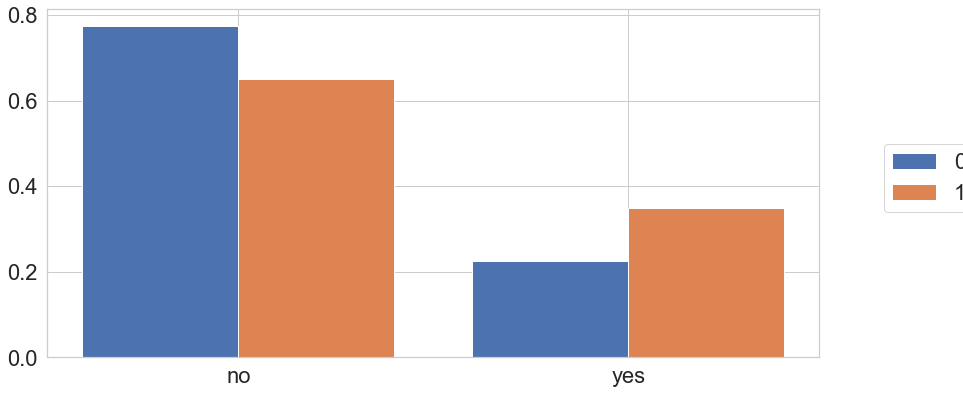

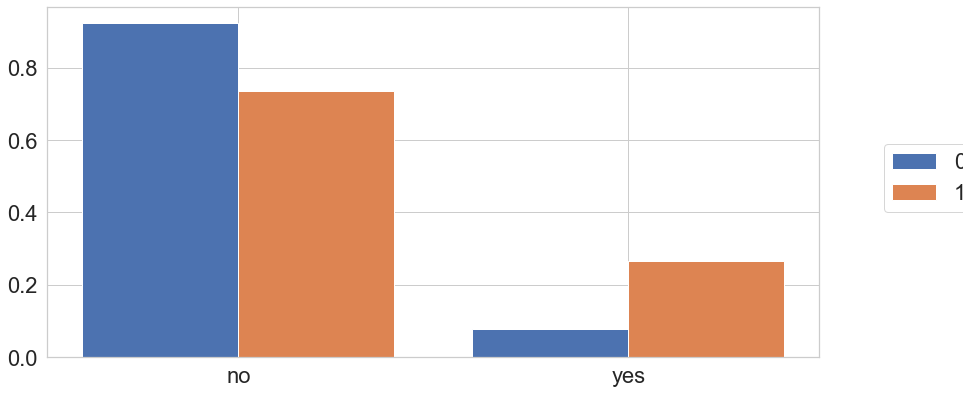

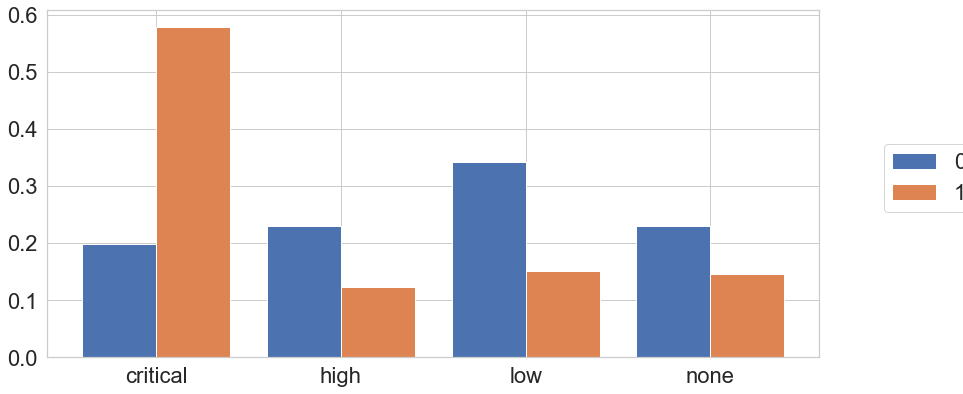

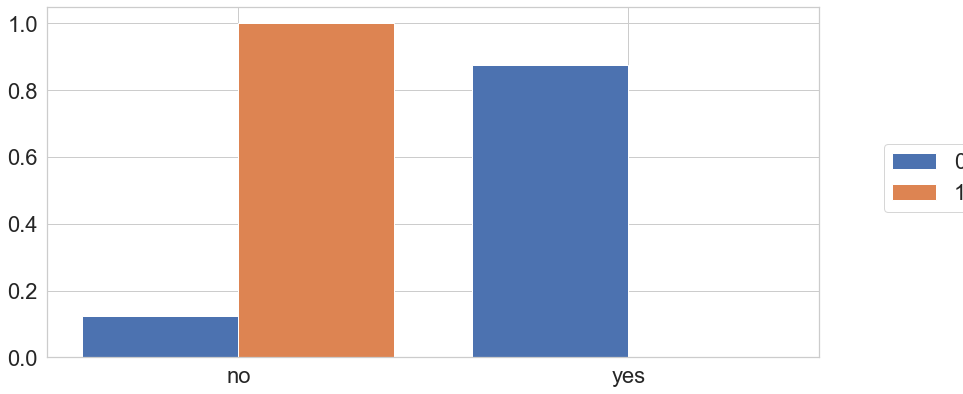

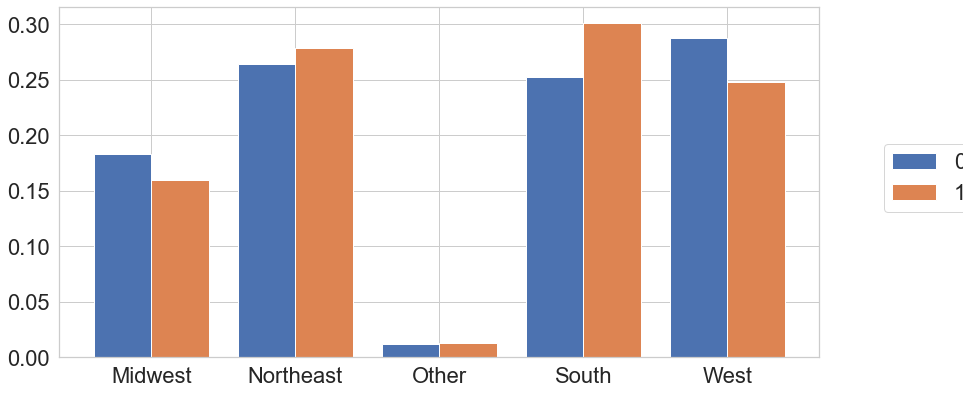

IndexError: list index out of range

In [327]:
sns.set_style('whitegrid')

for i in range(7):
    dxp.aggplot(data=churners, agg=churner_cat_cols[i], hue='Cluster', normalize='Cluster')
    plt.show()

/Users/andrewhoffman/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3666: UserWarning:

The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.



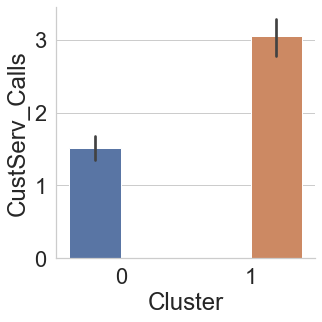

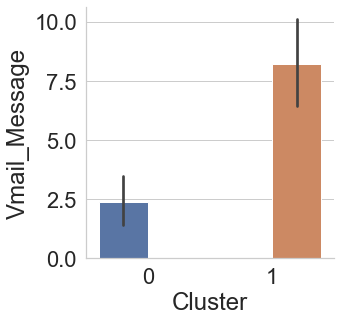

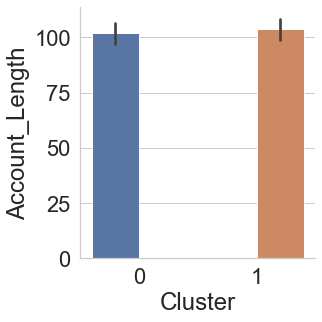

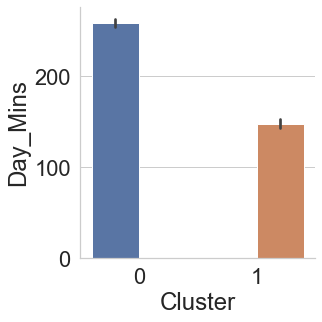

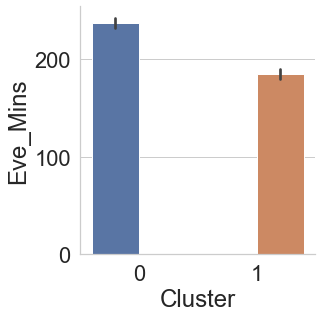

...

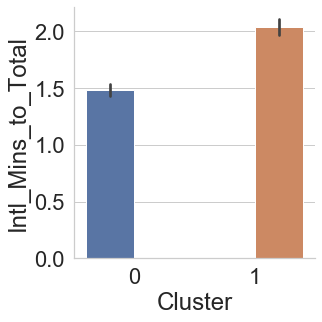

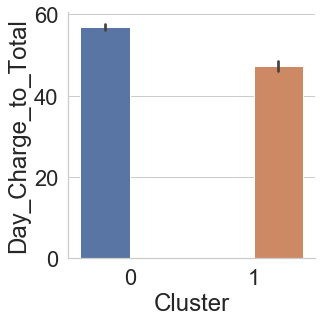

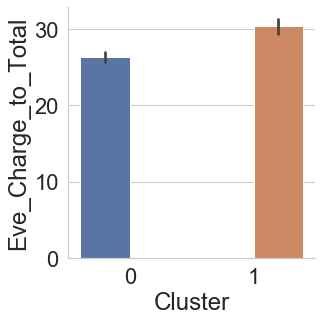

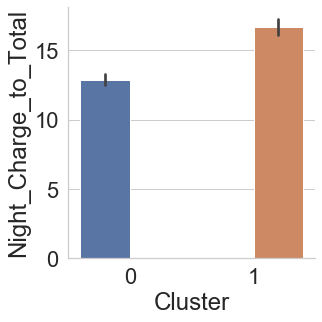

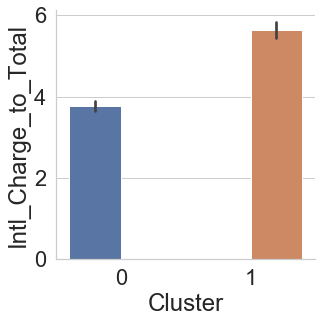

IndexError: list index out of range

In [328]:
for i in range(35):   
    f = sns.factorplot(data=churners, x='Cluster', y=churner_quant_cols[i], hue='Cluster', kind='bar')
    plt.show()

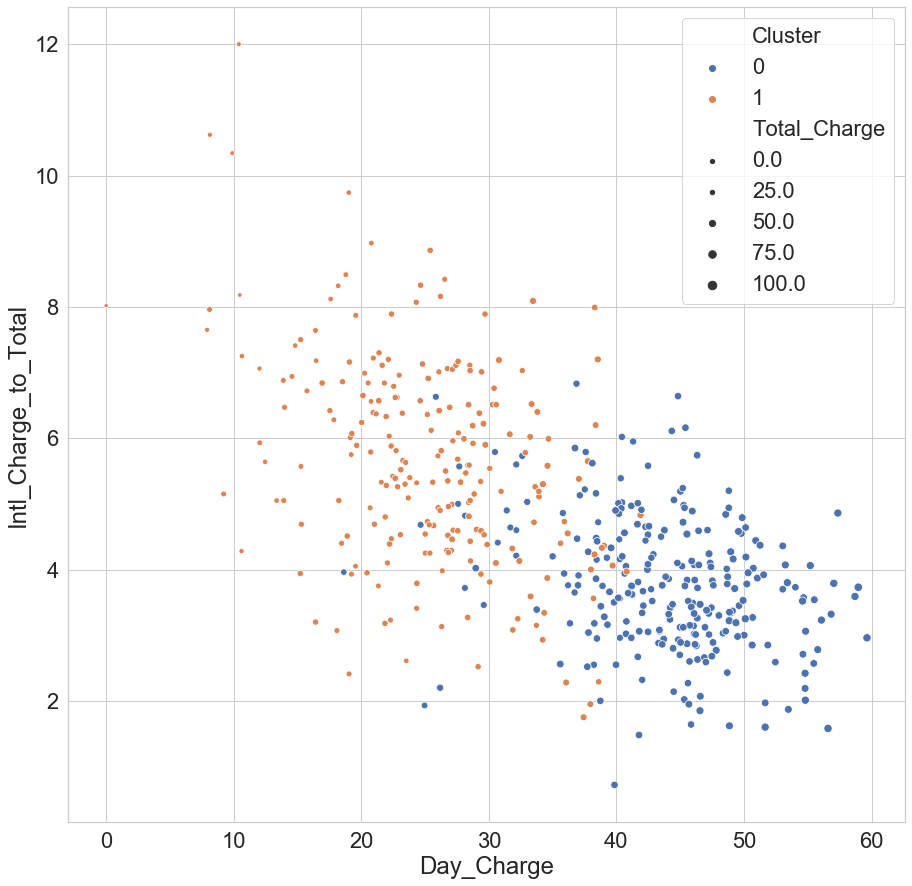

In [329]:
sns.set_style('whitegrid')
plt.subplots(figsize=(15, 15))
sns.scatterplot(x='Day_Charge', y='Intl_Charge_to_Total', data=churners, hue='Cluster', size='Total_Charge')

In [331]:
churn_data_with_segs = churn_data2.join(churners['Cluster'])

In [332]:
churn_data_with_segs

,Phone,Area_Code,State,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70,Care_Status,US_Region,Cluster
0,382-4657,415,KS,no,no,yes,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.17,0.09,0.04,0.27,0.59,0.11,2.37,0.25,36.96,27.52,34.12,1.39,59.65,22.21,14.57,3.57,yes,low,Midwest,NaN
1,371-7191,415,OH,no,no,yes,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.17,0.09,0.05,0.27,0.55,0.09,1.88,0.18,25.85,31.27,40.69,2.19,46.37,28.06,19.33,6.25,no,low,Midwest,NaN
2,358-1921,415,NJ,no,no,no,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.17,0.08,0.05,0.27,0.45,0.12,1.62,0.19,45.12,22.47,30.14,2.26,66.43,16.54,11.75,5.28,no,none,Northeast,NaN
3,375-9999,408,OH,no,yes,no,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.17,0.08,0.04,0.27,0.80,0.12,2.21,0.26,53.01,10.96,34.86,1.17,76.20,7.87,13.26,2.66,no,high,Midwest,NaN
4,330-6626,415,OK,no,yes,no,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.17,0.09,0.04,0.27,0.69,0.10,1.43,0.15,32.56,28.96,36.50,1.97,54.41,24.21,16.15,5.24,no,critical,South,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,414-4276,415,AZ,no,no,yes,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.17,0.09,0.05,0.27,0.31,0.09,2.26,0.21,23.64,32.62,42.24,1.50,44.18,30.48,20.90,4.44,no,high,West,NaN
3329,370-3271,415,WV,no,no,no,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.17,0.09,0.05,0.27,0.93,0.11,2.45,0.27,39.48,26.20,32.68,1.64,61.84,20.53,13.55,4.08,no,critical,South,NaN
3330,328-8230,510,RI,no,no,no,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,0.17,0.09,0.05,0.27,2.42,0.10,2.56,0.26,26.76,42.75,28.40,2.09,45.38,36.24,12.75,5.62,no,high,Northeast,NaN
3331,364-6381,510,CT,no,yes,no,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.17,0.09,0.04,0.27,0.31,0.11,1.54,0.17,41.31,30.83,26.89,0.97,63.18,23.59,10.88,2.35,no,high,Northeast,NaN


In [333]:
# create customer care buckets based on call center data

def k_assign(row):
    if row['Cluster'] == 0:
        return 2
    elif row['Cluster'] == 1:
        return 1
    else:
        return 0

churn_data_with_segs = churn_data_with_segs.assign(Cluster=churn_data_with_segs.apply(k_assign, axis=1))

In [334]:
churn_data_with_segs

,Phone,Area_Code,State,Churn,Intl_Plan,Vmail_Plan,CustServ_Calls,Vmail_Message,Account_Length,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,Total_Mins,Day_Calls,Eve_Calls,Night_Calls,Intl_Calls,Day_Charge,Eve_Charge,Night_Charge,Intl_Charge,Total_Calls,Total_Charge,Cost_Per_Day_Minute,Cost_Per_Eve_Minute,Cost_Per_Night_Minute,Cost_Per_Intl_Minute,Avg_Daily_Charge,Avg_Cost_Per_Minute,Avg_Minutes_Per_Call,Avg_Cost_Per_Call,Day_Mins_to_Total,Eve_Mins_to_Total,Night_Mins_to_Total,Intl_Mins_to_Total,Day_Charge_to_Total,Eve_Charge_to_Total,Night_Charge_to_Total,Intl_Charge_to_Total,Total_Charge_Over_70,Care_Status,US_Region,Cluster
0,382-4657,415,KS,no,no,yes,1,25,128,265.1,197.4,244.7,10.0,717.2,110,99,91,3,45.07,16.78,11.01,2.70,303,75.56,0.17,0.09,0.04,0.27,0.59,0.11,2.37,0.25,36.96,27.52,34.12,1.39,59.65,22.21,14.57,3.57,yes,low,Midwest,0
1,371-7191,415,OH,no,no,yes,1,26,107,161.6,195.5,254.4,13.7,625.2,123,103,103,3,27.47,16.62,11.45,3.70,332,59.24,0.17,0.09,0.05,0.27,0.55,0.09,1.88,0.18,25.85,31.27,40.69,2.19,46.37,28.06,19.33,6.25,no,low,Midwest,0
2,358-1921,415,NJ,no,no,no,0,0,137,243.4,121.2,162.6,12.2,539.4,114,110,104,5,41.38,10.30,7.32,3.29,333,62.29,0.17,0.08,0.05,0.27,0.45,0.12,1.62,0.19,45.12,22.47,30.14,2.26,66.43,16.54,11.75,5.28,no,none,Northeast,0
3,375-9999,408,OH,no,yes,no,2,0,84,299.4,61.9,196.9,6.6,564.8,71,88,89,7,50.90,5.26,8.86,1.78,255,66.80,0.17,0.08,0.04,0.27,0.80,0.12,2.21,0.26,53.01,10.96,34.86,1.17,76.20,7.87,13.26,2.66,no,high,Midwest,0
4,330-6626,415,OK,no,yes,no,3,0,75,166.7,148.3,186.9,10.1,512.0,113,122,121,3,28.34,12.61,8.41,2.73,359,52.09,0.17,0.09,0.04,0.27,0.69,0.10,1.43,0.15,32.56,28.96,36.50,1.97,54.41,24.21,16.15,5.24,no,critical,South,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,414-4276,415,AZ,no,no,yes,2,36,192,156.2,215.5,279.1,9.9,660.7,77,126,83,6,26.55,18.32,12.56,2.67,292,60.10,0.17,0.09,0.05,0.27,0.31,0.09,2.26,0.21,23.64,32.62,42.24,1.50,44.18,30.48,20.90,4.44,no,high,West,0
3329,370-3271,415,WV,no,no,no,3,0,68,231.1,153.4,191.3,9.6,585.4,57,55,123,4,39.29,13.04,8.61,2.59,239,63.53,0.17,0.09,0.05,0.27,0.93,0.11,2.45,0.27,39.48,26.20,32.68,1.64,61.84,20.53,13.55,4.08,no,critical,South,0
3330,328-8230,510,RI,no,no,no,2,0,28,180.8,288.8,191.9,14.1,675.6,109,58,91,6,30.74,24.55,8.64,3.81,264,67.74,0.17,0.09,0.05,0.27,2.42,0.10,2.56,0.26,26.76,42.75,28.40,2.09,45.38,36.24,12.75,5.62,no,high,Northeast,0
3331,364-6381,510,CT,no,yes,no,2,0,184,213.8,159.6,139.2,5.0,517.6,105,84,137,10,36.35,13.57,6.26,1.35,336,57.53,0.17,0.09,0.04,0.27,0.31,0.11,1.54,0.17,41.31,30.83,26.89,0.97,63.18,23.59,10.88,2.35,no,high,Northeast,0


In [335]:
churn_data_with_segs['Cluster'].value_counts()

0    2850
2     257
1     226
Name: Cluster, dtype: int64

In [336]:
churn_data_with_segs['Area_Code'].value_counts()

415    1655
510     840
408     838
Name: Area_Code, dtype: int64

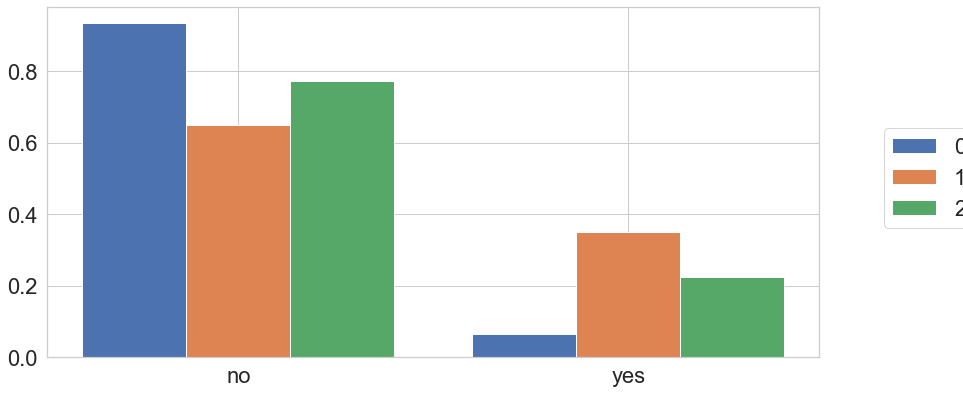

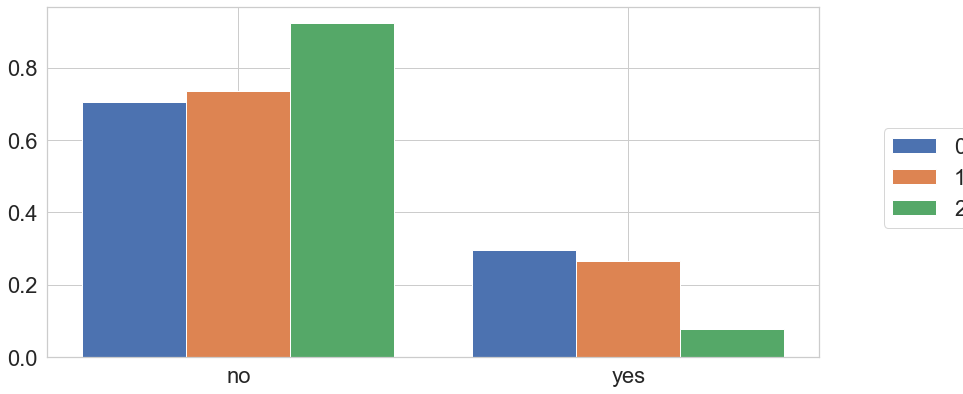

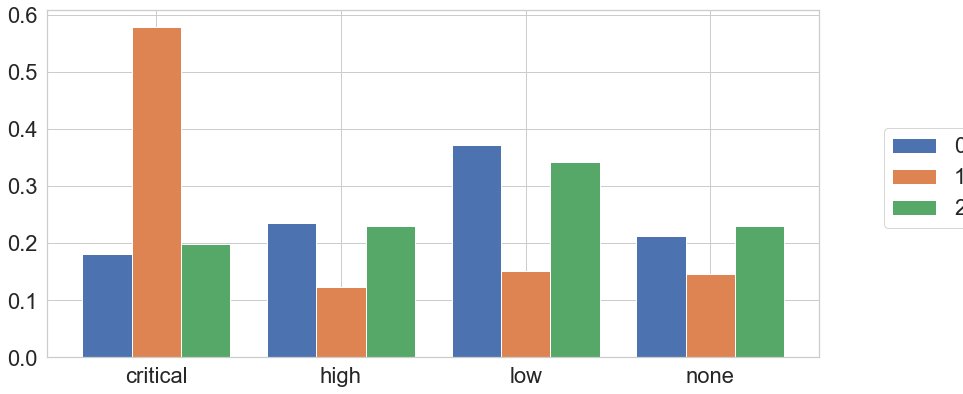

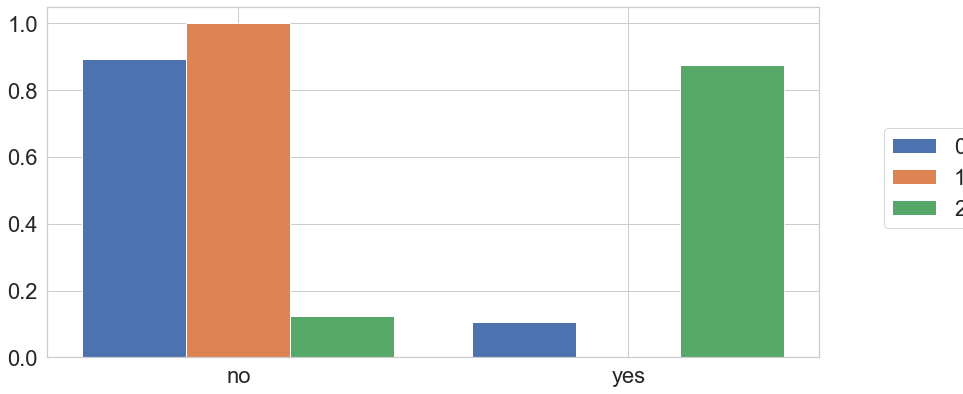

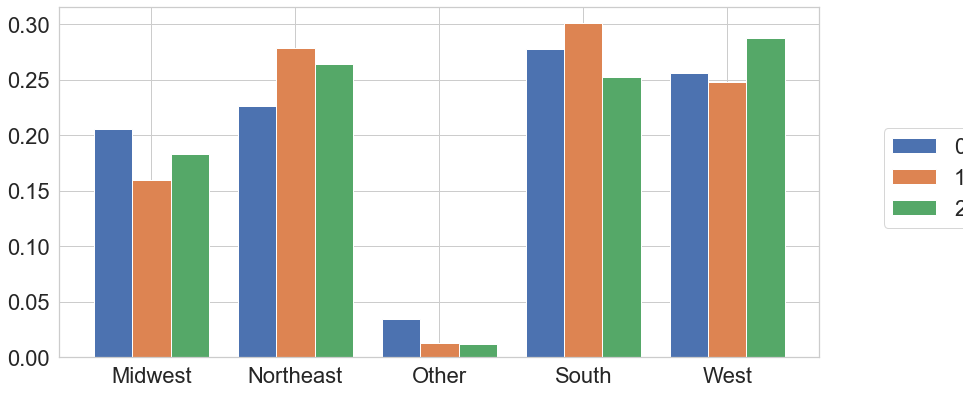

IndexError: list index out of range

In [337]:
# churner_cat_cols = ['Intl_Plan', 'Vmail_Plan','Care_Status', 'Total_Charge_Over_70', 'US_Region']

sns.set_style('whitegrid')

for i in range(7):
    dxp.aggplot(data=churn_data_with_segs, agg=churner_cat_cols[i], hue='Cluster', normalize='Cluster')
    plt.show()

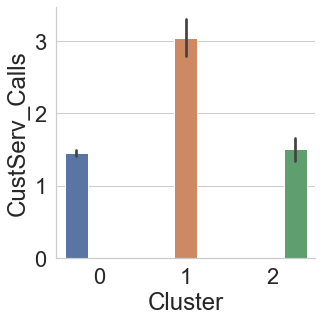

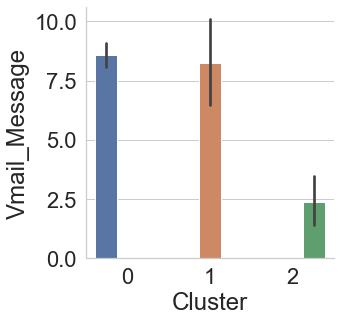

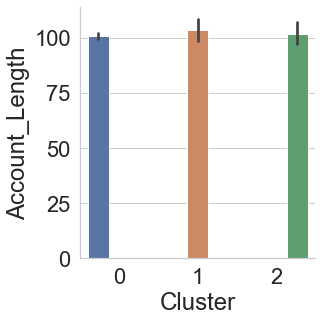

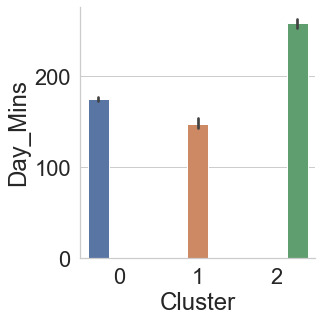

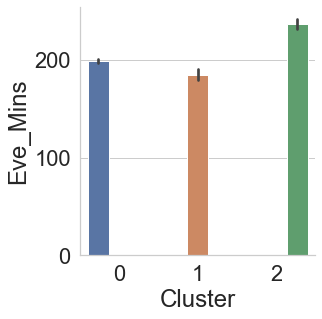

...

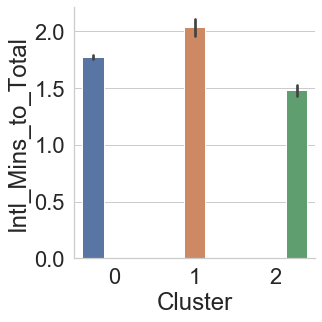

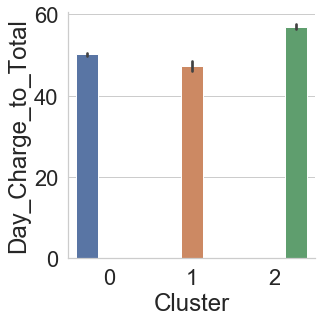

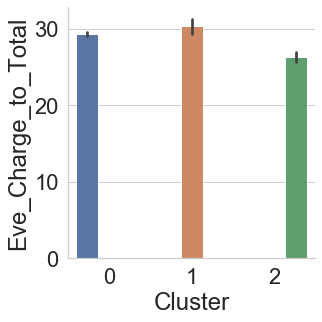

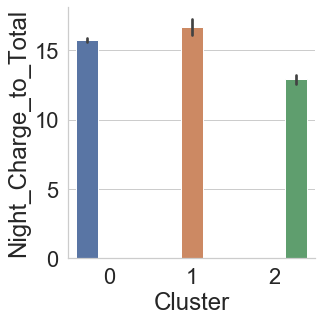

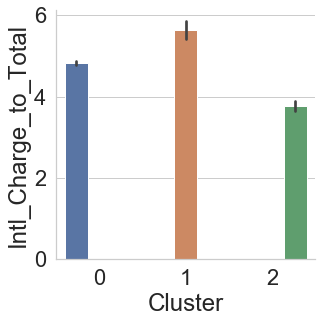

IndexError: list index out of range

In [338]:
for i in range(35):   
    f = sns.factorplot(data=churn_data_with_segs, x='Cluster', y=churner_quant_cols[i], hue='Cluster', kind='bar')
    plt.show()

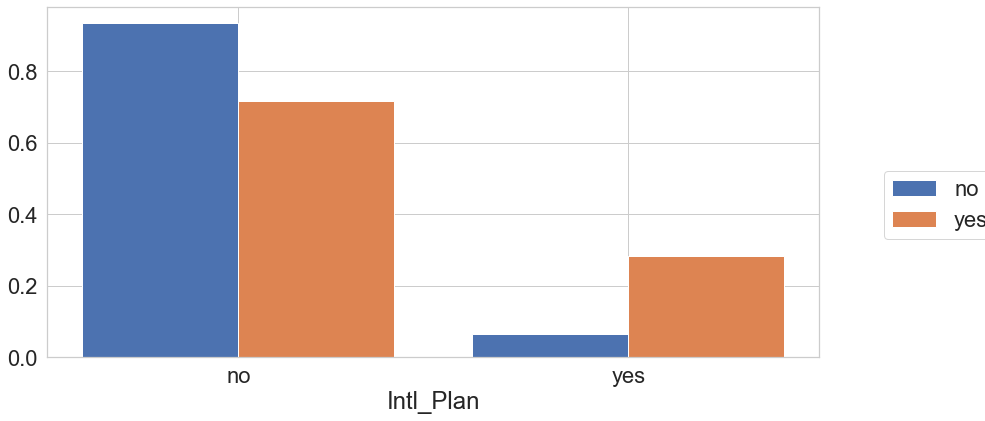

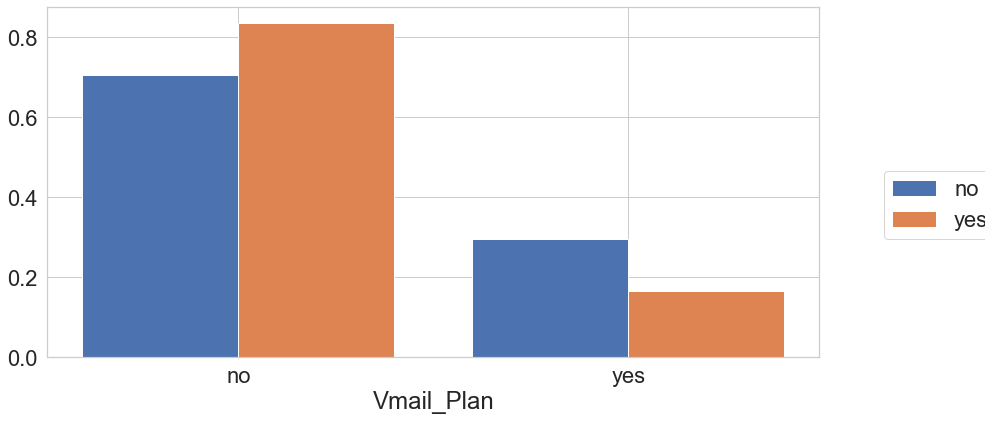

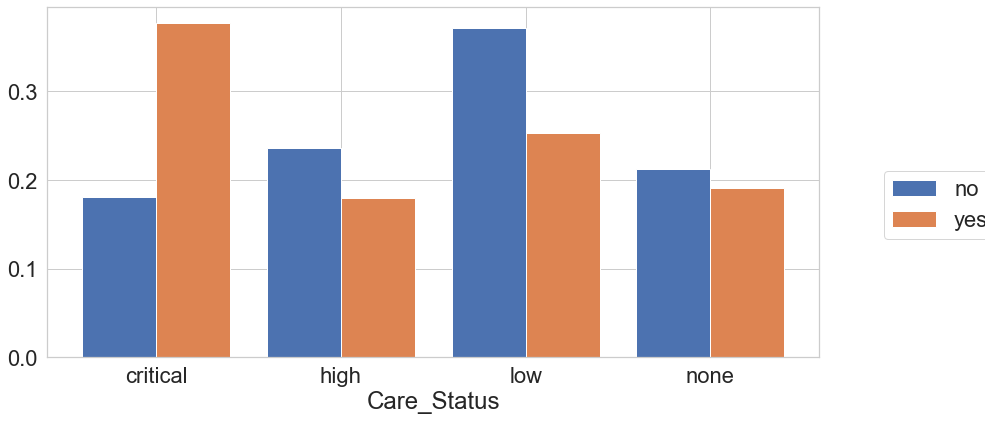

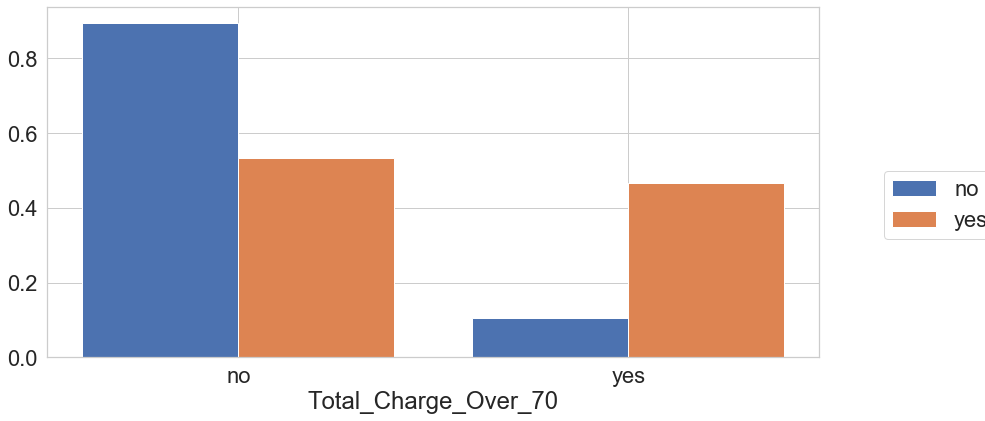

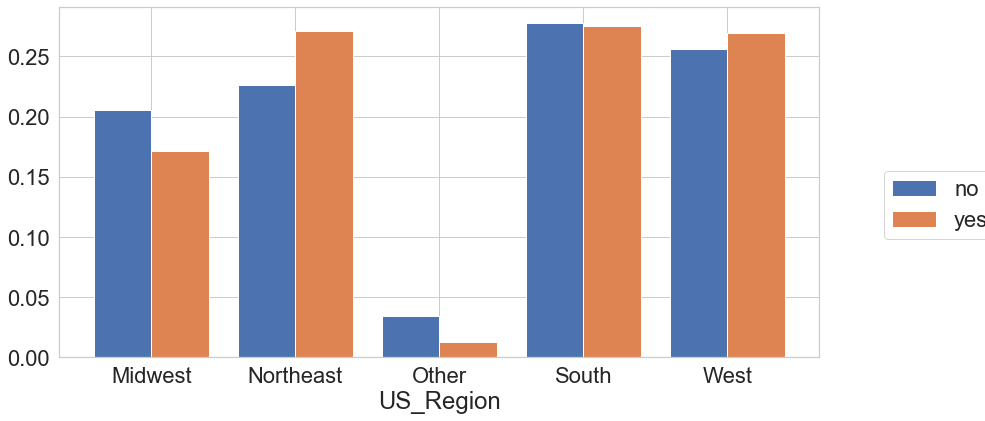

IndexError: list index out of range

In [339]:
# churner_cat_cols = ['Intl_Plan', 'Vmail_Plan','Care_Status', 'Total_Charge_Over_70', 'US_Region']
# g = dxp.aggplot(data=churn_data, agg='Vmail_Plan', hue='Churn', normalize='Churn')
# g.set(xlabel='Voicemail Plan')
# plt.show()

sns.set_style('whitegrid')

for i in range(7):
    g = dxp.aggplot(data=churn_data_with_segs, agg=churner_cat_cols[i], hue='Churn', normalize='Churn')
    g.set(xlabel=churner_cat_cols[i])
    plt.show()

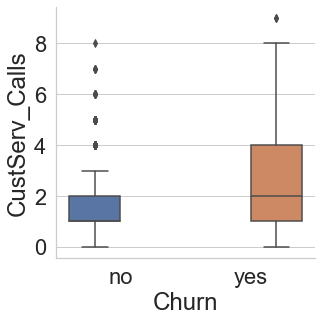

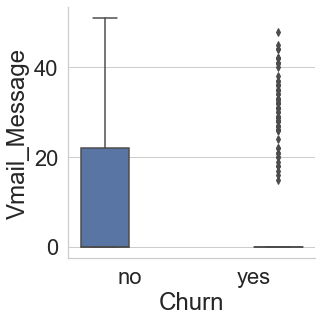

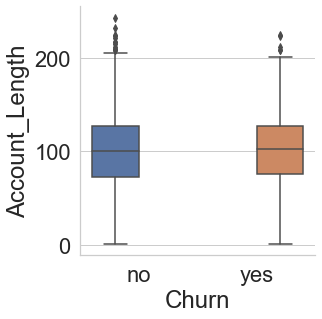

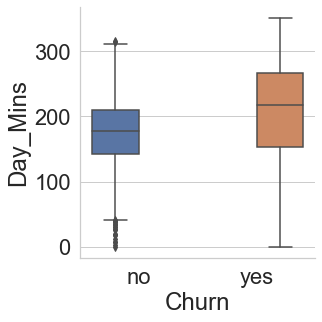

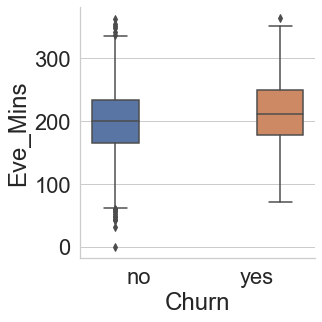

...

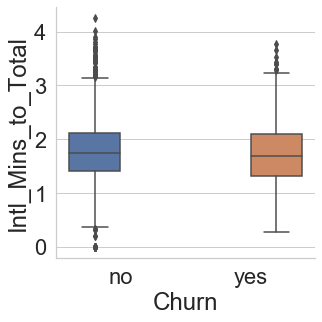

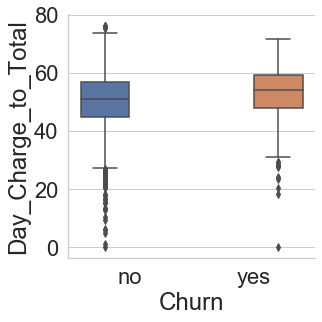

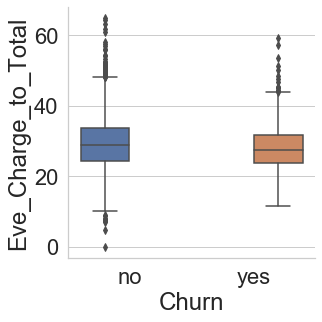

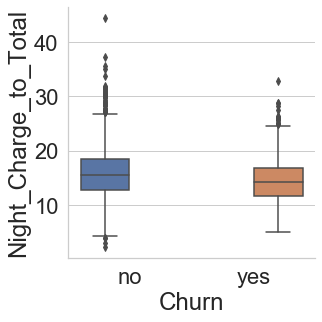

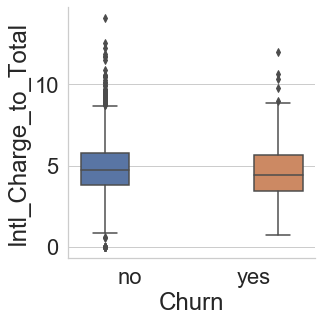

IndexError: list index out of range

In [340]:
sns.set_style('whitegrid')

for i in range(35):   
    f = sns.catplot(data=churn_data_with_segs, x='Churn', y=churner_quant_cols[i], hue='Churn', kind='box')
    plt.show()

In [343]:
sns.set_style('whitegrid')

for i in range(35):   
    sns.distplot(churn_data_with_segs, x=churner_quant_cols[i], hue='Churn')
    plt.show()

TypeError: distplot() got an unexpected keyword argument 'x'

In [ ]:
sns.set_style('whitegrid')

for i in range(35):   
    f = sns.catplot(data=churn_data_with_segs, y='Churn', x=churner_quant_cols[i], hue='Churn', kind='violin')
    plt.show()

In [341]:
X1 = cont_columns_scaled_df[features]
y1 = churn_data_with_segs['Cluster']

In [342]:
clf = RandomForestClassifier()

param_grid = {"max_depth": [3, 5, 8, 15, 25, 30, None],
              "max_features": [1, 3, 10, 15, 20, 30],
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}

random_search = RandomizedSearchCV(clf, param_grid)

random_search.fit(X1, y1)

RandomizedSearchCV(cv=None, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
            

In [344]:
print(random_search.best_params_)

{'max_features': 20, 'max_depth': 30, 'criterion': 'gini', 'bootstrap': True}


In [345]:
clf3 = RandomForestClassifier(bootstrap=False, max_depth=25, max_features=20, criterion='entropy')
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.1)
clf3.fit(X1_train, y1_train)
y1_pred = clf3.predict(X1_test)

In [346]:
summary1 = metrics.classification_report(y1_test, y1_pred)
print(summary1)
print()

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       298
           1       1.00      0.74      0.85        19
           2       0.94      1.00      0.97        17

    accuracy                           0.99       334
   macro avg       0.98      0.91      0.94       334
weighted avg       0.99      0.99      0.98       334




In [347]:
cnf_matrix1 = metrics.confusion_matrix(y1_test, y1_pred)
cnf_matrix1

array([[298,   0,   0],
       [  4,  14,   1],
       [  0,   0,  17]])

(3.0, 0.0)

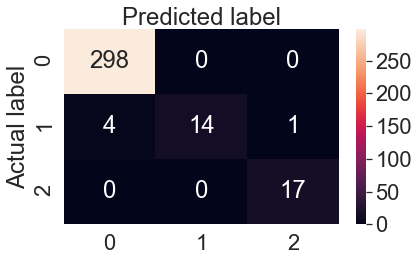

In [348]:
class_names=[0,1,2] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix1), annot=True, fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [349]:
# Calculate feature importances
importances_1 = clf3.feature_importances_

# Create labels
labels_1 = X1.columns

feats_1 = {} # a dict to hold feature_name: feature_importance
for feature, importance in zip(labels_1, importances_1):
    feats_1[feature] = importance #add the name/value pair 
    
importances_1 = pd.DataFrame.from_dict(feats_1, orient='index').rename(columns={0: 'Importance'})
importances_1 = importances_1.sort_values('Importance', ascending=False)

In [350]:
importances_1 = importances_1.reset_index()

In [351]:
importances_1 = importances_1.rename(columns={'index':'Feature'})

In [352]:
importances_1 

,Feature,Importance
0,Total_Charge,0.275047
1,CustServ_Calls,0.123578
2,Total_Mins,0.116609
3,Intl_Plan,0.080758
4,Intl_Calls,0.049232
5,Day_Mins,0.041479
6,Vmail_Message,0.040095
7,Vmail_Plan,0.035310
8,Day_Charge,0.024598
9,Intl_Mins,0.024158


(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 ]),
 <a list of 7 Text xticklabel objects>)

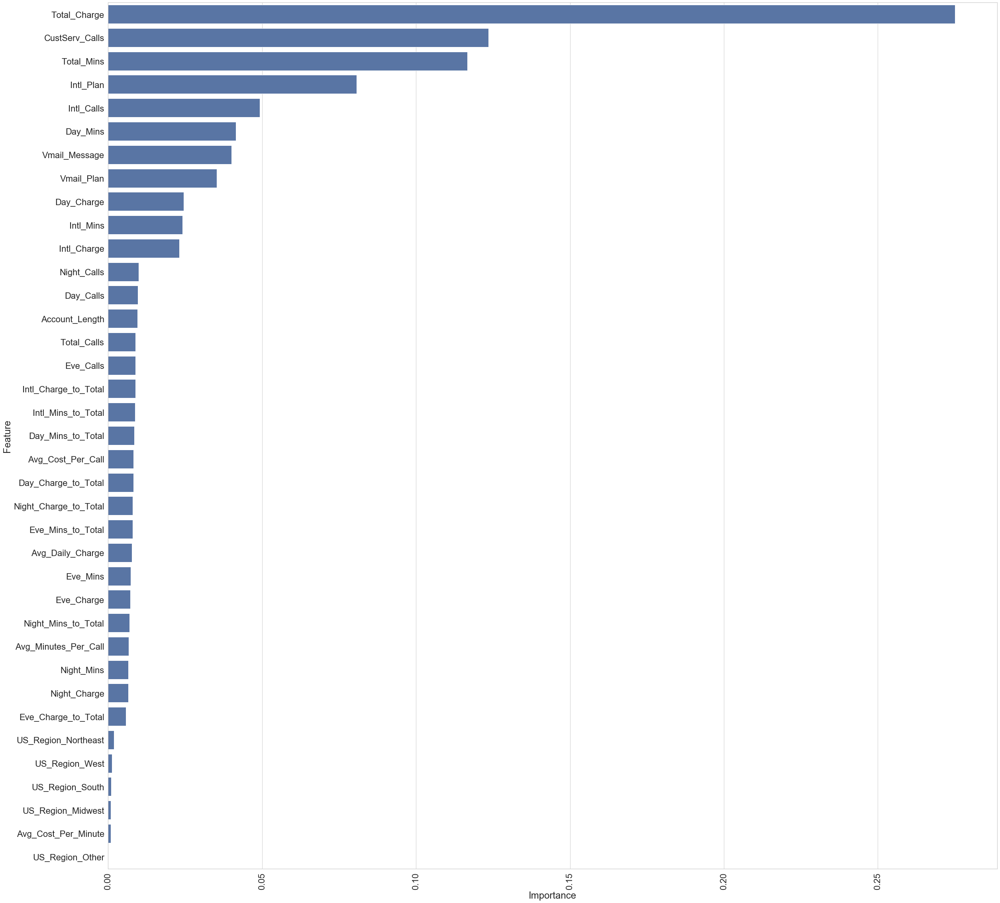

In [353]:
sns.set_style('whitegrid')
plt.subplots(figsize=(40, 40))
sns.set(font_scale=3)
sns.barplot(data=importances_1, y ='Feature', x='Importance', color='b')
plt.xticks(rotation=90)